# **FINAL DEEP LEARNING**

## **No 1**

Sherly Vaneza  
2702222163

# LINK YOUTUBE: https://youtu.be/tHt5V25ixdA

# Anda adalah seorang data scientist yang pada quarter ini memiliki projek menyelesaikan multivariable time series problem. Time series problem yang akan anda selesaikan adalah memprediksi kondisi kualitas udara suatu wilayah (AT). Anda memiliki data yang tersimpan pada link berikut: https://drive.google.com/drive/folders/1-Tdpj25TUPpn_FBfNVcEoTtjQstTKOZl?usp=sharing, dimana jika anda memiliki NIM genap, anda akan menggunakan data A_1, dan bila anda memiliki NIM ganjil akan menggunakan data B_1.

## Import Library

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import tensorflow as tf
from keras import Model
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input

import warnings
warnings.filterwarnings('ignore')

## Read Dataset

In [85]:
df = pd.read_csv("AP004.csv")
df.head()

,From Date,To Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),...,Temp (degree C),RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3)
0,2017-09-05 14:00:00,2017-09-05 15:00:00,25.00,45.00,1.80,12.20,7.90,10.20,5.60,0.35,...,30.30,69.00,3.20,213.00,372.00,747.00,0.10,33.80,0.00,0.50
1,2017-09-05 15:00:00,2017-09-05 16:00:00,23.00,49.50,0.65,14.55,8.28,8.85,4.52,0.41,...,30.00,70.50,4.10,140.00,290.75,747.25,0.05,32.22,0.00,0.48
2,2017-09-05 16:00:00,2017-09-05 17:00:00,18.00,55.75,4.00,26.58,17.40,6.23,5.35,0.38,...,29.85,88.00,2.82,174.75,300.25,747.00,0.00,28.30,0.93,0.53
3,2017-09-05 17:00:00,2017-09-05 18:00:00,19.75,33.50,1.63,21.78,12.92,8.30,5.30,0.48,...,29.25,88.75,1.72,231.50,225.50,747.75,0.00,28.77,0.00,1.85
4,2017-09-05 18:00:00,2017-09-05 19:00:00,14.00,28.00,1.07,26.38,14.90,3.42,4.68,0.43,...,28.05,88.50,1.97,105.25,11.25,748.25,0.00,28.25,0.00,2.17


## Simple EDA

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48802 entries, 0 to 48801
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   From Date            48802 non-null  object 
 1   To Date              48802 non-null  object 
 2   PM2.5 (ug/m3)        46344 non-null  float64
 3   PM10 (ug/m3)         46917 non-null  float64
 4   NO (ug/m3)           47244 non-null  float64
 5   NO2 (ug/m3)          47224 non-null  float64
 6   NOx (ppb)            46628 non-null  float64
 7   NH3 (ug/m3)          47140 non-null  float64
 8   SO2 (ug/m3)          46649 non-null  float64
 9   CO (mg/m3)           46387 non-null  float64
 10  Ozone (ug/m3)        47156 non-null  float64
 11  Benzene (ug/m3)      46914 non-null  float64
 12  Toluene (ug/m3)      46908 non-null  float64
 13  Eth-Benzene (ug/m3)  23988 non-null  float64
 14  MP-Xylene (ug/m3)    39256 non-null  float64
 15  Temp (degree C)      21599 non-null 

* **From Date**: Tanggal dan waktu mulai dari periode pengukuran data
* **To Date**: Tanggal dan waktu selesai dari periode pengukuran data.
* **PM2.5 (ug/m3)**: Partikel polusi udara yang sangat kecil yang bisa masuk ke dalam paru paru. Diukur dalam mikrogram per meter kubik.
* **PM10 (ug/m3)**: Partikel dengan diameter 10 mikrometer atau kurang. Sedikit lebih besar dari PM2.5.
* **NO (ug/m3)**: Nitric Oxide. Gas polutan yang biasanta berasal dari proses pembakaran.
* **NO2 (ug/m3)**: Nitrogen Dioxide. Gas polutan lain dari keluarga oksida nitrogen, sering terkait dengan lalu lintas dan industri.
* **NOx (ppb)**: Total Nitrogen Oxides. Gabungan dari NO dan NO2.
* **NH3 (ug/m3)**: Ammonia. Gas dengan bau tajam yang sering berasal dari aktivitas pertanian dan industri.
* **SO2 (ug/m3)**: Sulfur Dioxide. Gas polutan yang umumnya dihasilkan dari pembakaran bahan bakar fosil yang mengandung sulfur.
* **CO (mg/m3)**: Carbon Monoxide. Gas beracun yang dihasilkan dari pembakaran tidak sempurna, sumber utamanya adalah emisi kendaraan.
* **Ozone (ug/m3)**: Ozone. Polutan berbahaya yang berbentuk dari reaksi kimia anatara NOx dan senyawa organik volatil (VOC) dibawah sinar matahari.
* **Benzene (ug/m3)**: Senyawa organik volatil (VOC) koarsinogenik yang bisa berasal dari emisi industri dan asap rokok.
* **Toluene (ug/m3)**: Senyawa VOC lain yang umum ditemukan di perkotaan, berasal dari emisi kendaraan dan industri.
* **Eth-Benzene (ug/m3)**: Ethylbenzene. Komponen dari bahan bakar minyak dan pelarut industri.
* **MP-Xylene (ug/m3)**: Meta-Xylene & Para-Xylene. Dua jenis isomer dari Xylene, senyawa VOC yang sering digunakan sebagai pelarut.
* **Temp (degree C)**: Suhu udara, kemungkinan diukur oleh sensor spesifik, diukur dalam derajat Celsius.
* **RH (%)**: Relative Humidity. Jumlah uap air di udara dibandingkan dengan jumlah maksimum yang bisa ditampung udara pada suhu tersebut.
* **WS (m/s)**: Wind Speed. Kecepatan gerak udara.
* **WD (degree)**: Wind Direction. Arah dari mana angin bertiup.
* **SR (W/mt2)**: Solar Radiation. Jumlah energi matahari yang diterima per satuan luas.
* **BP (mmHg)**: Barometric Pressure. Tekanan udara atmosfer.
* **VWS (m/s)**: Vertical Wind Speed. Kecepatan pergerakan udara secara vertikal.
* **AT (degree C)**: Air Temperature.
* **RF (mm)**: Rainfall. Jumlah hujan turun.
* **Xylene (ug/m3)**: Senyawa organik volatil (VOC) yang umum digunakan sebagai pelarut industri (misalnya dalam cat) dan juga merupakan komponen dalam bahan bakar.

### Missing Value

In [87]:
df.isnull().sum()

,0
From Date,0
To Date,0
PM2.5 (ug/m3),2458
PM10 (ug/m3),1885
NO (ug/m3),1558
NO2 (ug/m3),1578
NOx (ppb),2174
NH3 (ug/m3),1662
SO2 (ug/m3),2153
CO (mg/m3),2415


Disini dapat dilihat untuk kolom *Eth-Benzene* dan *Temp* sangat banyak missing valuenya.  
Dan ada banyak juga kolom yang memiliki cukup banyak missing value.   
Untuk kolom *Eth-Benzene* dan *Temp* akan dihapus karena sangat tidak informatif.  
Dan untuk kolom lain, akan diisi dengan niali median.

### Drop Kolom Missing Value > 50%

In [88]:
threshold = len(df) * 0.5

df = df.dropna(thresh=threshold, axis=1)

print("Kolom setelah penghapusan:")
print(df.columns)

print("\nDataFrame setelah dibersihkan:")
df.head()

Kolom setelah penghapusan:
Index(['From Date', 'To Date', 'PM2.5 (ug/m3)', 'PM10 (ug/m3)', 'NO (ug/m3)',
       'NO2 (ug/m3)', 'NOx (ppb)', 'NH3 (ug/m3)', 'SO2 (ug/m3)', 'CO (mg/m3)',
       'Ozone (ug/m3)', 'Benzene (ug/m3)', 'Toluene (ug/m3)',
       'MP-Xylene (ug/m3)', 'RH (%)', 'WS (m/s)', 'WD (degree)', 'SR (W/mt2)',
       'BP (mmHg)', 'VWS (m/s)', 'AT (degree C)', 'RF (mm)', 'Xylene (ug/m3)'],
      dtype='object')

DataFrame setelah dibersihkan:


,From Date,To Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),...,MP-Xylene (ug/m3),RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3)
0,2017-09-05 14:00:00,2017-09-05 15:00:00,25.00,45.00,1.80,12.20,7.90,10.20,5.60,0.35,...,0.10,69.00,3.20,213.00,372.00,747.00,0.10,33.80,0.00,0.50
1,2017-09-05 15:00:00,2017-09-05 16:00:00,23.00,49.50,0.65,14.55,8.28,8.85,4.52,0.41,...,0.08,70.50,4.10,140.00,290.75,747.25,0.05,32.22,0.00,0.48
2,2017-09-05 16:00:00,2017-09-05 17:00:00,18.00,55.75,4.00,26.58,17.40,6.23,5.35,0.38,...,0.13,88.00,2.82,174.75,300.25,747.00,0.00,28.30,0.93,0.53
3,2017-09-05 17:00:00,2017-09-05 18:00:00,19.75,33.50,1.63,21.78,12.92,8.30,5.30,0.48,...,0.28,88.75,1.72,231.50,225.50,747.75,0.00,28.77,0.00,1.85
4,2017-09-05 18:00:00,2017-09-05 19:00:00,14.00,28.00,1.07,26.38,14.90,3.42,4.68,0.43,...,0.38,88.50,1.97,105.25,11.25,748.25,0.00,28.25,0.00,2.17


ini melakukan drop kepada kolom yang memiliki missing value diatas 50%

### Shape

In [89]:
df.shape

(48802, 23)

setealh di drop mendapatkan 48802 baris dan 23 kolom

### Check Columns

In [90]:
df.columns

Index(['From Date', 'To Date', 'PM2.5 (ug/m3)', 'PM10 (ug/m3)', 'NO (ug/m3)',
       'NO2 (ug/m3)', 'NOx (ppb)', 'NH3 (ug/m3)', 'SO2 (ug/m3)', 'CO (mg/m3)',
       'Ozone (ug/m3)', 'Benzene (ug/m3)', 'Toluene (ug/m3)',
       'MP-Xylene (ug/m3)', 'RH (%)', 'WS (m/s)', 'WD (degree)', 'SR (W/mt2)',
       'BP (mmHg)', 'VWS (m/s)', 'AT (degree C)', 'RF (mm)', 'Xylene (ug/m3)'],
      dtype='object')

### Deskripsi Dataset

In [91]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
PM2.5 (ug/m3),46344.0,34.821967,30.785200,0.25,12.00,25.00,51.25,723.00
PM10 (ug/m3),46917.0,71.598595,48.312579,0.25,34.50,59.75,100.50,835.50
NO (ug/m3),47244.0,2.509505,5.058787,0.03,1.45,1.90,2.60,216.17
NO2 (ug/m3),47224.0,15.284711,10.415231,0.10,8.45,12.80,19.30,166.25
NOx (ppb),46628.0,10.025558,7.179902,0.00,6.00,8.47,12.15,166.00
NH3 (ug/m3),47140.0,13.382927,7.847778,0.10,8.20,11.90,17.00,118.25
SO2 (ug/m3),46649.0,8.498869,6.086666,0.10,4.92,7.25,10.37,183.30
CO (mg/m3),46387.0,0.693976,0.437964,0.00,0.43,0.63,0.88,18.69
Ozone (ug/m3),47156.0,40.931671,32.651348,0.20,14.73,33.23,59.68,198.40
Benzene (ug/m3),46914.0,0.570979,0.800774,0.00,0.10,0.35,0.83,50.90


1. **PM2.5 dan PM10** menunjukkan tingkat partikel halus di udara. Rata-rata PM2.5 adalah 34.82 µg/m³ dan PM10 sebesar 71.60 µg/m³, namun keduanya memiliki nilai maksimum yang sangat tinggi (hingga 723 dan 835), mengindikasikan kemungkinan kondisi polusi ekstrem di beberapa waktu.

2. **NO, NO2, dan NOx** merupakan gas hasil pembakaran, terutama dari kendaraan bermotor. Nilai rata-rata NO adalah 2.5 µg/m³, NO2 sekitar 15.28 µg/m³, dan NOx 10.03 ppb.

3. **NH3 (Amonia)** memiliki rata-rata 13.38 µg/m³ dan berasal dari aktivitas pertanian atau limbah organik. Nilainya bisa mencapai hingga 118 µg/m³.

4. **SO2 (Sulfur dioksida)**, gas dari pembakaran bahan bakar fosil, memiliki rata-rata 8.49 µg/m³ dan maksimum 183 µg/m³.

5. **CO (Karbon monoksida)** memiliki nilai rendah secara rata-rata (0.69 mg/m³), tetapi berbahaya bila mendekati maksimum (18.69 mg/m³).

6. **Ozone (O₃)** di permukaan tanah cukup tinggi, dengan rata-rata 40.93 µg/m³ dan maksimum hampir 200 µg/m³, berpotensi berdampak pada kesehatan pernapasan.

7. **Senayawa VOC seperti Benzene, Toluene, Xylene, dan MP-Xylene** memiliki rata-rata rendah namun nilai maksimum yang tinggi, menunjukkan potensi pencemaran sesekali dari sumber industri atau lalu lintas.

8. **Kelembaban relatif (RH)** cukup tinggi dengan rata-rata 69.5%, mencerminkan iklim tropis yang lembap.

9. **Kecepatan angin (WS)** rata-rata sekitar 2.76 m/s, sedangkan **arah angin (WD)** sangat bervariasi, menunjukkan arah angin dari seluruh penjuru.

10. **Radiasi matahari (SR)** cukup intens dengan nilai rata-rata 193 W/m² dan bisa mencapai hingga 455 W/m².

11. **Tekanan udara (BP)** stabil di sekitar 752 mmHg.

12. **Kecepatan angin vertikal (VWS)** sangat kecil, rata-rata mendekati nol, yang umum untuk pengukuran dekat permukaan tanah.

13. **Suhu udara (AT)** berkisar di angka 28.04°C rata-rata, menunjukkan cuaca yang hangat atau panas.

14. **Curah hujan (RF)** sangat kecil secara rata-rata (0.0378 mm), tetapi sesekali bisa mencapai 4.6 mm, menunjukkan kejadian hujan singkat atau lokal.

15. **Xylene**, salah satu VOC, memiliki rata-rata 0.73 µg/m³ dengan maksimum 64 µg/m³, juga mencerminkan potensi pencemaran lokal.


### Ganti Datatype -> Datetime

In [92]:
df['From Date'] = pd.to_datetime(df['From Date'])
df.sort_values(by='From Date', ascending=True, inplace=True)
df.reset_index(drop=True, inplace=True)

In [93]:
df['To Date'] = pd.to_datetime(df['To Date'])
df.sort_values(by='To Date', ascending=True, inplace=True)
df.reset_index(drop=True, inplace=True)

Kode tersebut mengubah kolom tanggal menjadi tipe datetime, mengurutkan berdasarkan tanggal, lalu mereset indeks dataframe.

### info dataset

In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48802 entries, 0 to 48801
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   From Date          48802 non-null  datetime64[ns]
 1   To Date            48802 non-null  datetime64[ns]
 2   PM2.5 (ug/m3)      46344 non-null  float64       
 3   PM10 (ug/m3)       46917 non-null  float64       
 4   NO (ug/m3)         47244 non-null  float64       
 5   NO2 (ug/m3)        47224 non-null  float64       
 6   NOx (ppb)          46628 non-null  float64       
 7   NH3 (ug/m3)        47140 non-null  float64       
 8   SO2 (ug/m3)        46649 non-null  float64       
 9   CO (mg/m3)         46387 non-null  float64       
 10  Ozone (ug/m3)      47156 non-null  float64       
 11  Benzene (ug/m3)    46914 non-null  float64       
 12  Toluene (ug/m3)    46908 non-null  float64       
 13  MP-Xylene (ug/m3)  39256 non-null  float64       
 14  RH (%)

## EDA

### Duplicate

In [95]:
df.duplicated().sum()

np.int64(0)

In [96]:
df.isnull().sum()

,0
From Date,0
To Date,0
PM2.5 (ug/m3),2458
PM10 (ug/m3),1885
NO (ug/m3),1558
NO2 (ug/m3),1578
NOx (ppb),2174
NH3 (ug/m3),1662
SO2 (ug/m3),2153
CO (mg/m3),2415


In [97]:
# Asumsikan DataFrame Anda bernama df

# 1. Pilih hanya kolom numerik yang akan diisi
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# 2. Hitung median untuk setiap kolom numerik
median_values = df[numeric_cols].median()

# 3. Isi missing values secara langsung di DataFrame df
# Perhatikan penggunaan inplace=True
df[numeric_cols] = df[numeric_cols].fillna(median_values)

# --- Verifikasi ---
# Cek kembali jumlah missing value pada df untuk memastikan perubahan
print("Jumlah missing value pada DataFrame 'df' setelah diubah:")
print(df.isnull().sum())

Jumlah missing value pada DataFrame 'df' setelah diubah:
From Date            0
To Date              0
PM2.5 (ug/m3)        0
PM10 (ug/m3)         0
NO (ug/m3)           0
NO2 (ug/m3)          0
NOx (ppb)            0
NH3 (ug/m3)          0
SO2 (ug/m3)          0
CO (mg/m3)           0
Ozone (ug/m3)        0
Benzene (ug/m3)      0
Toluene (ug/m3)      0
MP-Xylene (ug/m3)    0
RH (%)               0
WS (m/s)             0
WD (degree)          0
SR (W/mt2)           0
BP (mmHg)            0
VWS (m/s)            0
AT (degree C)        0
RF (mm)              0
Xylene (ug/m3)       0
dtype: int64


mengubah missing value menjadi data median.

In [98]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48802 entries, 0 to 48801
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   From Date          48802 non-null  datetime64[ns]
 1   To Date            48802 non-null  datetime64[ns]
 2   PM2.5 (ug/m3)      48802 non-null  float64       
 3   PM10 (ug/m3)       48802 non-null  float64       
 4   NO (ug/m3)         48802 non-null  float64       
 5   NO2 (ug/m3)        48802 non-null  float64       
 6   NOx (ppb)          48802 non-null  float64       
 7   NH3 (ug/m3)        48802 non-null  float64       
 8   SO2 (ug/m3)        48802 non-null  float64       
 9   CO (mg/m3)         48802 non-null  float64       
 10  Ozone (ug/m3)      48802 non-null  float64       
 11  Benzene (ug/m3)    48802 non-null  float64       
 12  Toluene (ug/m3)    48802 non-null  float64       
 13  MP-Xylene (ug/m3)  48802 non-null  float64       
 14  RH (%)

### Unique Value

In [99]:
df.nunique()

,0
From Date,48802
To Date,48802
PM2.5 (ug/m3),937
PM10 (ug/m3),1428
NO (ug/m3),950
NO2 (ug/m3),3233
NOx (ppb),2213
NH3 (ug/m3),2567
SO2 (ug/m3),2041
CO (mg/m3),394


In [100]:
for i in df.columns:
  x = df[i].value_counts()
  print(f'{x}\n')

From Date
2023-03-31 23:00:00    1
2017-09-05 14:00:00    1
2023-03-30 08:00:00    1
2023-03-30 09:00:00    1
2023-03-30 10:00:00    1
                      ..
2017-09-05 19:00:00    1
2017-09-05 20:00:00    1
2017-09-05 21:00:00    1
2017-09-05 22:00:00    1
2017-09-05 23:00:00    1
Name: count, Length: 48802, dtype: int64

To Date
2023-04-01 00:00:00    1
2017-09-05 15:00:00    1
2023-03-30 09:00:00    1
2023-03-30 10:00:00    1
2023-03-30 11:00:00    1
                      ..
2017-09-05 20:00:00    1
2017-09-05 21:00:00    1
2017-09-05 22:00:00    1
2017-09-05 23:00:00    1
2017-09-06 00:00:00    1
Name: count, Length: 48802, dtype: int64

PM2.5 (ug/m3)
25.00     2679
6.00       460
11.00      416
5.00       406
8.00       383
          ... 
239.25       1
195.00       1
158.75       1
214.50       1
162.00       1
Name: count, Length: 937, dtype: int64

PM10 (ug/m3)
59.75     1966
39.00      184
28.00      178
33.00      175
27.00      169
          ... 
251.50       1
288.25     

1. **Kolom From Date dan To Date** berisi nilai waktu (timestamp) unik yang masing-masing hanya muncul satu kali, menunjukkan bahwa data dikumpulkan setiap jam tanpa duplikasi waktu.

2. **PM2.5 (µg/m³)** paling sering muncul pada nilai 25.0 sebanyak 2679 kali, menunjukkan bahwa level ini adalah konsentrasi partikel halus yang paling umum dalam data.

3. **PM10 (µg/m³)** memiliki nilai paling sering di angka 59.75 sebanyak 1966 kali, menandakan dominasi level ini dalam polusi partikulat kasar.

4. **NO (µg/m³)** umumnya muncul pada nilai 1.90 sebanyak 2199 kali, menunjukkan tingkat nitrogen monoksida yang paling sering terjadi.

5. **NO2 (µg/m³)** paling banyak muncul pada nilai 12.80 dengan frekuensi 1639 kali, menjadi konsentrasi dominan untuk nitrogen dioksida.

6. **NOx (ppb)** paling sering berada pada nilai 8.47 sebanyak 2246 kali, yang menggambarkan nilai khas dari gabungan NO dan NO2.

7. **NH3 (µg/m³)** paling umum muncul pada angka 11.90 sebanyak 1747 kali, menunjukkan paparan amonia yang konsisten.

8. **SO2 (µg/m³)** paling sering berada di level 7.25 dengan frekuensi 2272 kali, menggambarkan nilai khas untuk sulfur dioksida.

9. **CO (mg/m³)** umumnya muncul pada 0.63 sebanyak 2884 kali, menandakan itu adalah level karbon monoksida yang paling umum.

10. **Ozone (µg/m³)** sering muncul pada nilai 33.23 sebanyak 1658 kali, menandakan konsentrasi ozon yang paling stabil di lingkungan tersebut.

11. **Benzene (µg/m³)** mendominasi di nilai rendah seperti 0.10 sebanyak 6136 kali dan 0.00 sebanyak 4901 kali, menandakan banyaknya waktu udara bebas dari benzene.

12. **Toluene (µg/m³)** paling sering muncul pada nilai 2.10 sebanyak 2098 kali, menandakan paparan sedang terhadap senyawa ini.

13. **MP-Xylene (µg/m³)** sangat dominan pada 0.10 sebanyak 21.478 kali, mengindikasikan nilai rendah hampir sepanjang waktu.

14. **RH (%)** atau kelembaban relatif paling banyak muncul di angka 72.75 sebanyak 1670 kali, menunjukkan iklim yang lembap secara konsisten.

15. **WS (m/s)** atau kecepatan angin sering berada di nilai 2.55 sebanyak 1734 kali, menunjukkan angin ringan sebagai kondisi dominan.

16. **WD (degree)** atau arah angin paling umum berasal dari 187.75 derajat dengan frekuensi 1474 kali, menandakan arah angin dominan.

17. **SR (W/m²)** atau radiasi matahari sangat sering berada di level rendah seperti 3.00 dan 4.00, kemungkinan besar terjadi saat malam atau cuaca mendung.

18. **BP (mmHg)** atau tekanan udara paling sering berada di kisaran 754–757 mmHg, menunjukkan kestabilan atmosfer.

19. **VWS (m/s)** atau kecepatan angin vertikal paling sering 0.00 sebanyak lebih dari 12.000 kali, menandakan kondisi udara yang tenang secara vertikal.

20. **AT (°C)** atau suhu udara paling sering berada di 28.27°C sebanyak 1605 kali, mencerminkan suhu rata-rata wilayah tropis.

21. **RF (mm)** atau curah hujan didominasi oleh nilai 0.00 sebanyak lebih dari 46.000 kali, menunjukkan mayoritas waktu tidak ada hujan.

22. **Xylene (µg/m³)** paling umum di angka 0.00 dan 0.10, menunjukkan rendahnya paparan senyawa ini di sebagian besar waktu.


### Data Types

In [101]:
df.dtypes

,0
From Date,datetime64[ns]
To Date,datetime64[ns]
PM2.5 (ug/m3),float64
PM10 (ug/m3),float64
NO (ug/m3),float64
NO2 (ug/m3),float64
NOx (ppb),float64
NH3 (ug/m3),float64
SO2 (ug/m3),float64
CO (mg/m3),float64


### Drop To Date

In [102]:
df.drop(['To Date'], axis=1, inplace=True)

Kolom To Date tidak dibutuhkan karena tidak efektif, sudah ada From Date

### Rename From Date -> Date

In [103]:
df.rename(columns={'From Date': 'Date'}, inplace=True)

rename "From Date" jadi "Date"

### Duration

In [104]:
print("Starting date : ",df.iloc[0][0])
print("Ending date : ", df.iloc[-1][0])
print("Duration : ", df.iloc[-1][0]-df.iloc[0][0])

Starting date :  2017-09-05 14:00:00
Ending date :  2023-03-31 23:00:00
Duration :  2033 days 09:00:00


durasi date dari data ini, jadi dimulainya di akhir 2017, sampai awal 2023

### Hour

In [105]:
import pandas as pd

# Asumsikan DataFrame Anda bernama df dan punya kolom 'Date'

# 1. Langkah PENTING: Pastikan kolom 'Date' dikenali sebagai tanggal & waktu
df['Date'] = pd.to_datetime(df['Date'])

# 2. Buat kolom baru 'Hour' dari kolom 'Date'
df['Hour'] = df['Date'].dt.hour

# Tampilkan hasilnya untuk verifikasi
print("Kolom 'Hour' sudah berhasil dibuat:")
print(df[['Date', 'Hour']].head())

Kolom 'Hour' sudah berhasil dibuat:
                 Date  Hour
0 2017-09-05 14:00:00    14
1 2017-09-05 15:00:00    15
2 2017-09-05 16:00:00    16
3 2017-09-05 17:00:00    17
4 2017-09-05 18:00:00    18


### **2017**

#### Filtered Dataset

In [106]:
df_2017 = df[(df['Date'] >= '2017-01-01') & (df['Date'] <= '2017-12-31')]

df_2017

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
0,2017-09-05 14:00:00,25.00,45.00,1.80,12.20,7.90,10.20,5.60,0.35,79.50,...,69.00,3.20,213.00,372.00,747.00,0.10,33.80,0.00,0.50,14
1,2017-09-05 15:00:00,23.00,49.50,0.65,14.55,8.28,8.85,4.52,0.41,62.50,...,70.50,4.10,140.00,290.75,747.25,0.05,32.22,0.00,0.48,15
2,2017-09-05 16:00:00,18.00,55.75,4.00,26.58,17.40,6.23,5.35,0.38,40.50,...,88.00,2.82,174.75,300.25,747.00,0.00,28.30,0.93,0.53,16
3,2017-09-05 17:00:00,19.75,33.50,1.63,21.78,12.92,8.30,5.30,0.48,34.43,...,88.75,1.72,231.50,225.50,747.75,0.00,28.77,0.00,1.85,17
4,2017-09-05 18:00:00,14.00,28.00,1.07,26.38,14.90,3.42,4.68,0.43,33.00,...,88.50,1.97,105.25,11.25,748.25,0.00,28.25,0.00,2.17,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2790,2017-12-30 20:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.00,0.33,20
2791,2017-12-30 21:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.00,0.33,21
2792,2017-12-30 22:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.00,0.33,22
2793,2017-12-30 23:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.00,0.33,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2017, lalu menyimpannya ke dalam **df_2017**.


#### AT/ Month

In [107]:
monthly_avg = df_2017.groupby(df_2017['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January              NaN
February             NaN
March                NaN
April                NaN
May                  NaN
June                 NaN
July                 NaN
August               NaN
September      30.061361
October        30.287016
November       30.143847
December       26.960888


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2017, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

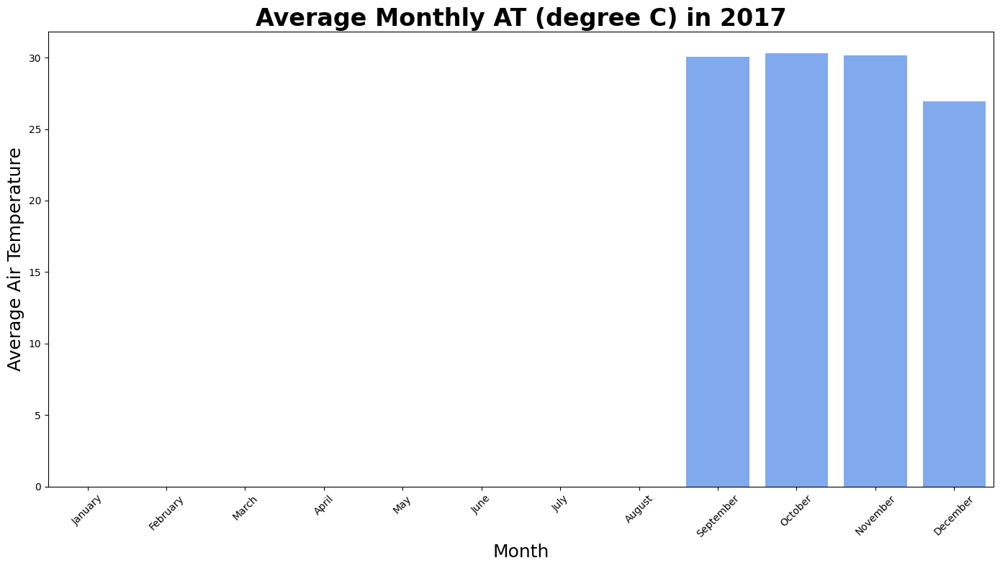

In [108]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2017', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata **suhu udara (AT) per bulan** sepanjang tahun 2017 berdasarkan data yang sudah difilter. Namun, hanya bulan **September sampai Desember** yang memiliki data, sedangkan bulan Januari - Agustus nilainya **NaN (kosong)**, kemungkinan karena data belum tersedia atau belum tercatat di awal tahun.

Nilai rata-rata suhu bulanan:

* September: ±30.06°C

* Oktober: ±30.29°C (tertinggi)

* November: ±30.14°C

* Desember: ±26.97°C (terendah)

Suhu cenderung tinggi pada akhir tahun, khususnya di bulan Oktober–November, kemudian sedikit menurun di Desember. Data ini bisa menunjukkan pola musiman atau kondisi iklim lokal di lokasi pengukuran.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

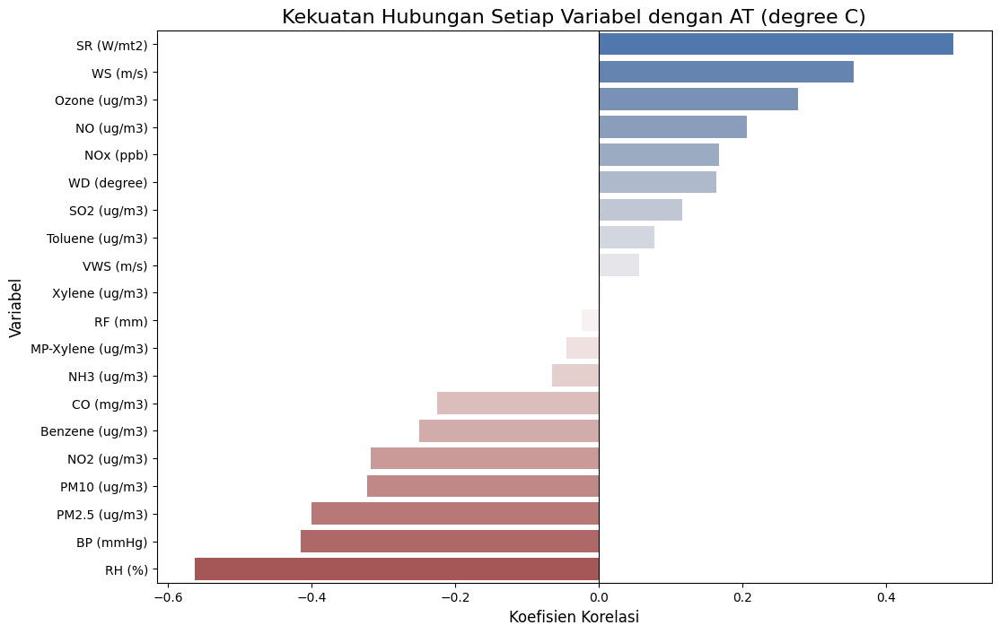

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2017 adalah DataFrame Anda untuk tahun 2017
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2017.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Grafik ini menunjukkan **kekuatan dan arah hubungan (korelasi Pearson)** antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):
* SR (W/m²): Paling tinggi (sekitar +0.48), artinya semakin tinggi radiasi matahari, semakin tinggi suhu.

* WS (m/s): Kecepatan angin mendatar juga berhubungan positif dengan suhu.

* Ozone, NO, NOx: Konsentrasi gas-gas ini meningkat saat suhu meningkat, kemungkinan karena reaksi fotokimia yang dipicu oleh panas.

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):
* RH (%): Korelasi negatif terkuat (sekitar -0.55), artinya suhu tinggi biasanya disertai kelembaban rendah.

* BP (mmHg): Tekanan udara cenderung menurun saat suhu naik.

* PM2.5 & PM10: Partikel polutan cenderung berkurang ketika suhu tinggi, mungkin karena dispersi oleh angin atau naiknya udara panas.

* NO2, Benzene, CO, NH3: Konsentrasi senyawa ini menurun saat suhu meningkat.

#### Plot Distribusi Setiap Variable Numerik

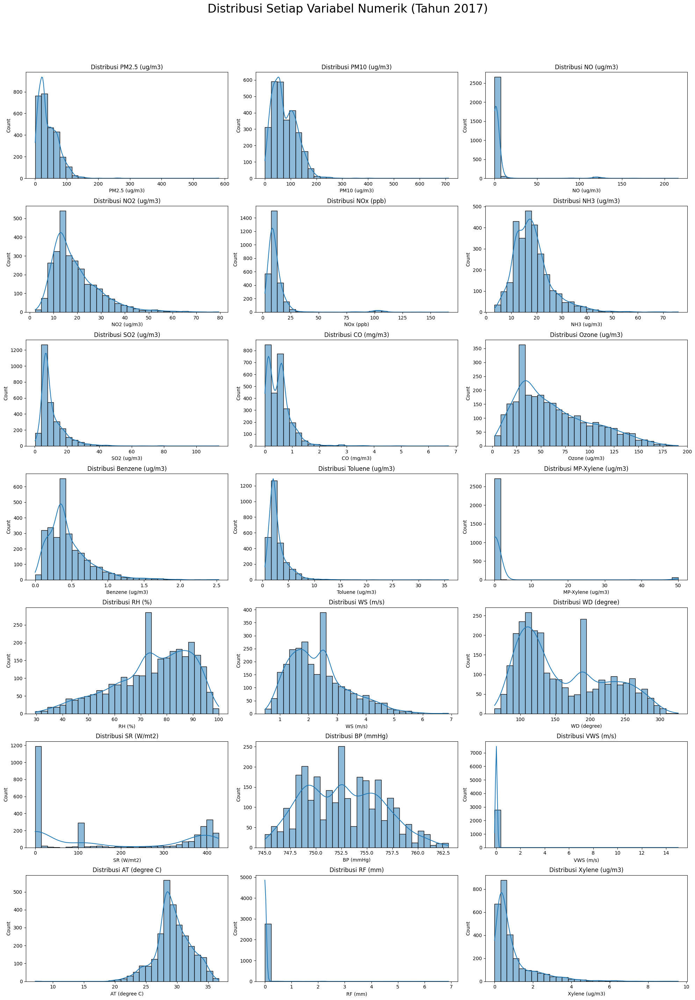

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2017 adalah DataFrame Anda
numeric_cols = df_2017.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2017)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2017[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik**

1. **Sebagian besar variabel seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya** menunjukkan **distribusi skewed ke kanan (positif)**, yang artinya sebagian besar data berada di nilai rendah, tetapi terdapat beberapa nilai ekstrem tinggi (outlier).

2. **Variabel seperti RH (%), WD (arah angin), dan AT (temperatur udara)** memiliki **distribusi yang lebih simetris**, dengan RH dan WD cenderung mendekati distribusi normal, sedangkan AT sedikit skewed ke kiri.

3. **Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan)** sangat tidak merata, dengan **banyak nilai nol** (curah hujan/angin vertikal tidak terjadi), menandakan nilai-nilai ini bersifat sporadis atau jarang terjadi.

4. **SR (Solar Radiation)** menunjukkan dua puncak (bimodal), kemungkinan mencerminkan perbedaan antara kondisi siang dan malam.

5. **BP (Tekanan udara)** memiliki distribusi sempit, menandakan tekanan udara relatif stabil sepanjang waktu.

6. **Variabel seperti Xylene, Toluene, dan MP-Xylene** juga menunjukkan distribusi yang sangat miring ke kanan, mencerminkan polutan ini biasanya rendah, namun kadang meningkat drastis.


#### Boxplot Outlier

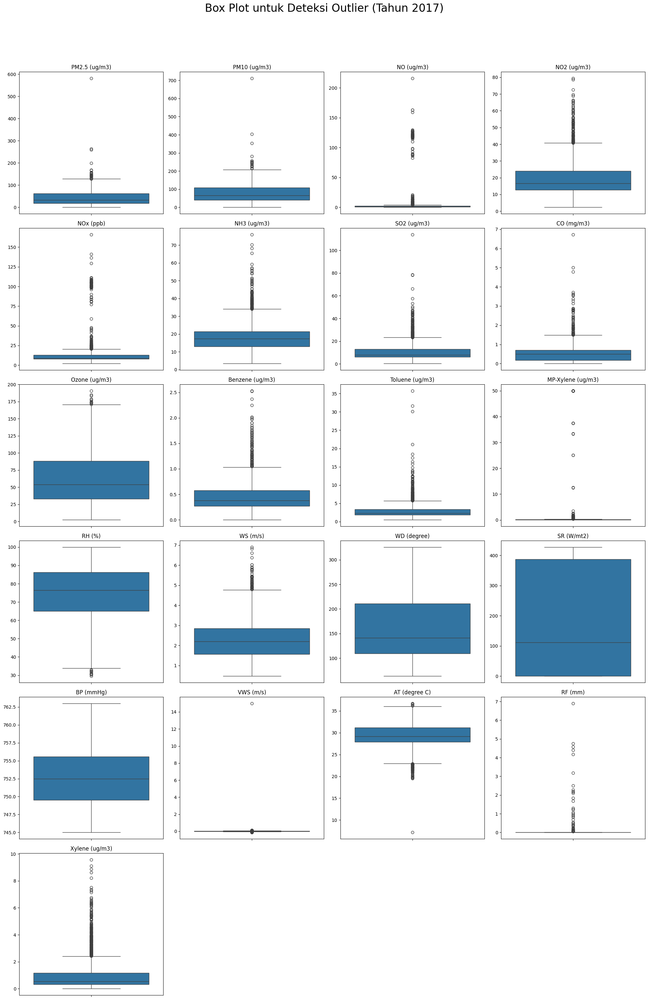

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2017.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2017)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2017[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

---

**1. PM2.5 (µg/m³)**

* Menunjukkan **banyak outlier di atas upper whisker**, dengan nilai ekstrem mencapai hampir **600 µg/m³**.
* Median berada di bawah 50 µg/m³, menunjukkan **mayoritas data rendah**, tetapi ada **hari-hari tertentu dengan polusi ekstrem**.

---

**2. PM10 (µg/m³)**

* Distribusi serupa dengan PM2.5, dengan outlier mencapai **>700 µg/m³**.
* Menunjukkan bahwa terjadi **pencemaran partikel besar secara tidak normal** di beberapa waktu.

---

**3. NO (µg/m³)**

* Mayoritas data sangat rendah, tapi ada **lonjakan ekstrem hingga >200 µg/m³**.
* Outlier cukup padat di bagian atas, menunjukkan **lonjakan nitrogen monoksida pada waktu tertentu**.

---

**4. NO2 (µg/m³)**

* Median sekitar 20–30 µg/m³, tapi ada **outlier signifikan hingga 80 µg/m³**.
* Perlu dicermati karena NO2 berbahaya bagi kesehatan paru-paru.

---

**5. NOx (ppb)**

* Menunjukkan banyak outlier, beberapa nilai bahkan mencapai **>150 ppb**.
* Distribusi padat di bagian bawah, menunjukkan **konsentrasi NOx umumnya rendah tapi rawan lonjakan**.

---

**6. NH3 (µg/m³)**

* Hampir seluruh outlier ada di atas, mencapai **>70 µg/m³**.
* Data dominan di bawah 25, menandakan **anomali tinggi** di nilai atas.

---

**7. SO2 (µg/m³)**

* Median rendah, sekitar 10 µg/m³, tapi outlier mencapai lebih dari **100 µg/m³**.
* Mengindikasikan kemungkinan **aktivitas industri** atau **pembakaran bahan bakar** sebagai penyebab lonjakan.

---

**8. CO (mg/m³)**

* Hampir semua data berada di bawah 1 mg/m³, tapi terdapat **banyak outlier hingga >6 mg/m³**.
* Hal ini menunjukkan **beberapa kejadian pencemaran CO berat**, meskipun secara umum CO rendah.

---

**9. Ozone (µg/m³)**

* Sebaran data cukup luas, dan **terlihat simetris**.
* Outlier tetap ada di bagian atas, dengan nilai hingga hampir **200 µg/m³**.
* Meskipun ada variasi, pola data cukup alami dan tidak terlalu ekstrem.

---

**10. Benzene (µg/m³)**

* Median sangat rendah, tapi ada **banyak outlier di atas**, hingga **>2 µg/m³**.
* Mengindikasikan **kejadian pencemaran benzene**, senyawa berbahaya dari pembakaran.

---

**11. Toluene (µg/m³)**

* Hampir semua data sangat rendah, namun ada **outlier mencapai >25 µg/m³**.
* Outlier jarang tapi ekstrem, menandakan **kontaminasi tidak rutin**.

---

**12. MP-Xylene (µg/m³)**

* Pola mirip dengan Toluene, dengan outlier signifikan di atas 40 µg/m³.
* Menunjukkan adanya **kontaminasi kimia tertentu di beberapa waktu**.

---

**13. Xylene (µg/m³)**

* Median rendah, tetapi outlier banyak dan mencapai hampir **10 µg/m³**.
* Kemungkinan terjadi dari **aktivitas industri atau lalu lintas padat**.

---

**14. RH (%)**

* Distribusi simetris dan normal, sebagian besar antara **60–90%**.
* Beberapa outlier rendah (sekitar 30%), menunjukkan **kelembapan ekstrem kering**.

---

**15. WS (m/s)**

* Median sekitar 2 m/s, tetapi terdapat **outlier hingga >6 m/s**.
* Artinya, **kadang terjadi angin kencang**, meski secara umum tenang.

---

**16. WD (degree)**

* Distribusi arah angin cukup merata, **tidak terlihat banyak outlier**.
* Menunjukkan **arah angin bervariasi tapi wajar** sepanjang tahun.

---

**17. SR (W/m²)**

* Sebaran simetris, dengan **tidak ada outlier mencolok**.
* Menunjukkan distribusi **radiasi matahari stabil**.

---

**18. BP (mmHg)**

* Tekanan udara sangat stabil, berada di rentang sempit.
* Hampir tidak ada outlier, **menunjukkan kestabilan atmosfer**.

---

**19. VWS (m/s)**

* Hampir semua data sangat rendah (dekat nol), tapi ada **1 outlier ekstrem** hingga 15 m/s.
* Sangat tidak biasa, perlu dicek apakah itu **error data atau kejadian langka**.

---

**20. AT (°C)**

* Sebagian besar suhu berkisar antara **24–34°C**, tetapi ada **1 outlier rendah** di bawah 10°C.
* Sangat mungkin merupakan **anomali data atau pencatatan salah**.

---

**21. RF (mm)**

* Sebagian besar hari tidak hujan (nilai 0), tetapi ada **outlier hujan deras hingga 7 mm**.
* Menunjukkan **curah hujan tinggi di hari-hari tertentu**, meskipun sebagian besar hari kering.

---
---

**Kesimpulan Umum:**

* **Polutan udara** seperti PM, NOx, NH3, dan VOC memiliki banyak **outlier di atas**, menandakan **kejadian pencemaran tidak rutin**.
* **Cuaca** relatif stabil, tapi variabel seperti **RF, WS, AT** memiliki outlier penting yang perlu diperhatikan.
* Box plot ini sangat berguna untuk:

  * Deteksi **anomali**
  * Menentukan perlakuan terhadap **nilai ekstrem**
  * Menjadi acuan untuk **preprocessing sebelum modeling**

---

#### Line Chart Air Temperature

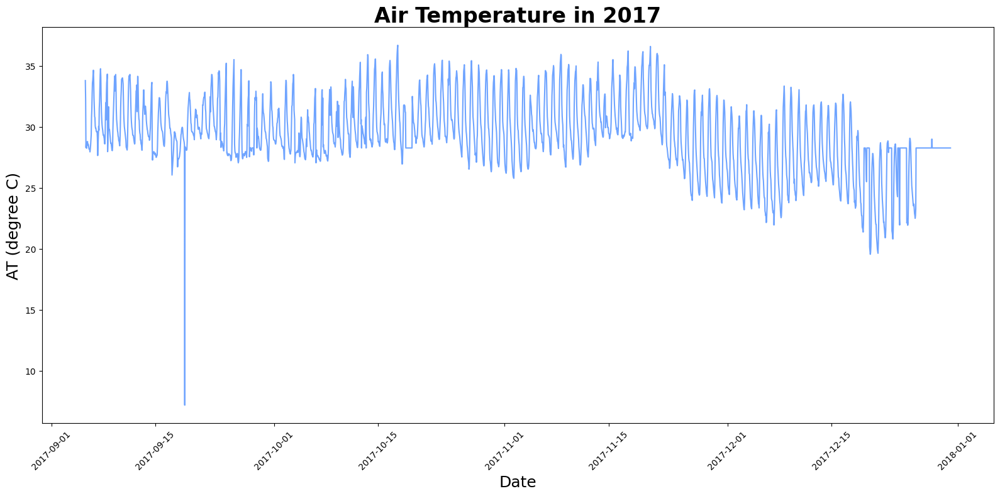

In [112]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2017, color='#6FA4FF')
plt.title(f'Air Temperature in 2017', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

* Grafik menunjukkan **perubahan suhu udara (AT)** sepanjang akhir tahun 2017.
* **Sebagian besar suhu berkisar antara 25–35°C**, mencerminkan iklim tropis yang stabil.
* Terdapat **fluktuasi harian yang teratur**, kemungkinan akibat siklus siang dan malam.
* Menjelang Desember, suhu sedikit menurun dan menjadi lebih stabil, mengindikasikan **perubahan musiman**.
* Terlihat **satu outlier ekstrem sekitar 2017-09-25**, di mana suhu turun drastis hingga sekitar **7–8°C**.
* Nilai ekstrem tersebut **kemungkinan besar merupakan kesalahan pencatatan atau data error**, karena tidak sesuai dengan pola suhu lainnya.
* Secara keseluruhan, suhu menunjukkan **pola konsisten**, namun **perlu penanganan untuk data anomali** agar tidak mengganggu analisis lebih lanjut.


#### Rata Rata Air Temperature per Jam

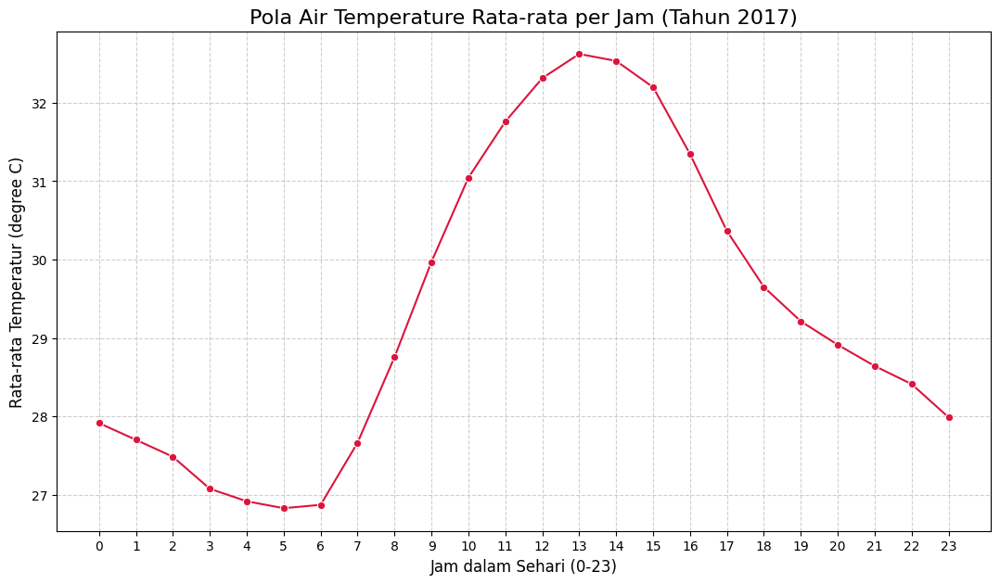

In [113]:
hourly_temp_avg = df_2017.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2017)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

* Suhu terendah terjadi sekitar pukul 05.00 - 06.00 dengan rata-rata sekitar 26.8°C.
* Suhu mulai naik sejak pukul 07.00, dan mencapai puncaknya pada pukul 13.00 - 14.00 dengan suhu lebih dari 32.5°C.
* Setelah itu suhu menurun secara bertahap hingga malam hari.
* Pola ini mencerminkan siklus harian suhu yang wajar, mengikuti pergerakan matahari dari pagi hingga malam.
* Grafik menunjukkan pola suhu tropis yang stabil dengan fluktuasi alami setiap harinya.


### **2018**

#### Filtered Dataset

In [114]:
df_2018 = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2018-12-31')]

df_2018

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
2818,2018-01-01 00:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.0,0.33,0
2819,2018-01-01 01:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.0,0.33,1
2820,2018-01-01 02:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.0,0.33,2
2821,2018-01-01 03:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,0.00,28.27,0.0,0.30,3
2822,2018-01-01 04:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.50,-0.03,28.27,0.0,0.35,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11550,2018-12-30 20:00:00,79.25,148.00,0.97,47.08,25.82,21.25,22.10,0.85,98.07,...,57.25,2.45,80.50,4.00,762.00,0.10,22.13,0.0,0.67,20
11551,2018-12-30 21:00:00,76.75,144.50,1.70,50.65,28.32,20.30,25.83,0.80,94.35,...,58.00,1.57,92.25,4.00,762.00,0.03,21.75,0.0,0.60,21
11552,2018-12-30 22:00:00,81.33,147.67,0.73,54.77,29.70,19.53,18.50,0.78,77.47,...,61.67,1.53,68.33,4.00,762.00,0.07,21.70,0.0,0.37,22
11553,2018-12-30 23:00:00,84.25,145.75,0.90,34.47,19.10,16.17,18.62,0.29,104.85,...,58.00,2.20,76.75,4.00,761.75,0.08,21.50,0.0,0.38,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2018, lalu menyimpannya ke dalam **df_2018**.

#### AT/ Month

In [115]:
monthly_avg = df_2018.groupby(df_2018['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        28.026331
February       25.371890
March          27.530255
April          32.365319
May            32.512675
June           33.095431
July           31.700067
August         29.387043
September      29.935569
October        30.298548
November       29.123764
December       25.726630


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2018, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

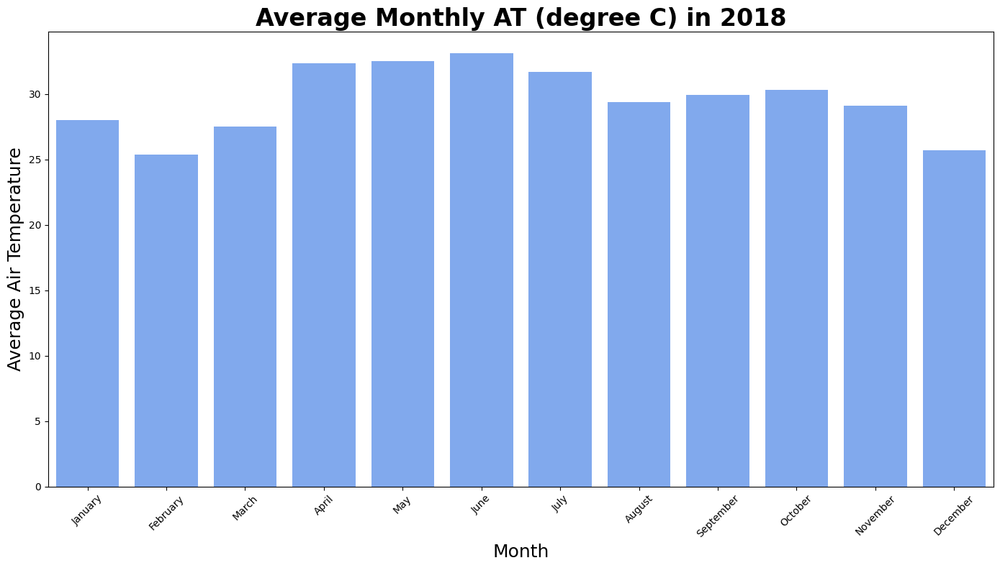

In [116]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2018', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata suhu udara (AT) per bulan sepanjang tahun 2018 berdasarkan data yang sudah difilter. Berdasarkan data yang Anda berikan, semua bulan dari Januari hingga Desember memiliki data suhu rata-rata yang tercatat.

Nilai rata-rata suhu bulanan:

Januari: ±28.03°C
Februari: ±25.37°C (terendah)
Maret: ±27.53°C
April: ±32.37°C
Mei: ±32.51°C
Juni: ±33.10°C (tertinggi)
Juli: ±31.70°C
Agustus: ±29.39°C
September: ±29.94°C
Oktober: ±30.30°C
November: ±29.12°C
Desember: ±25.73°C
Suhu cenderung rendah di awal tahun (Februari) dan akhir tahun (Desember), lalu naik secara signifikan dan mencapai puncaknya di pertengahan tahun, khususnya pada bulan Juni.

Data ini menunjukkan adanya pola musiman yang jelas, di mana pertengahan tahun merupakan periode terpanas, yang kemungkinan sesuai dengan musim kemarau di lokasi pengukuran.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

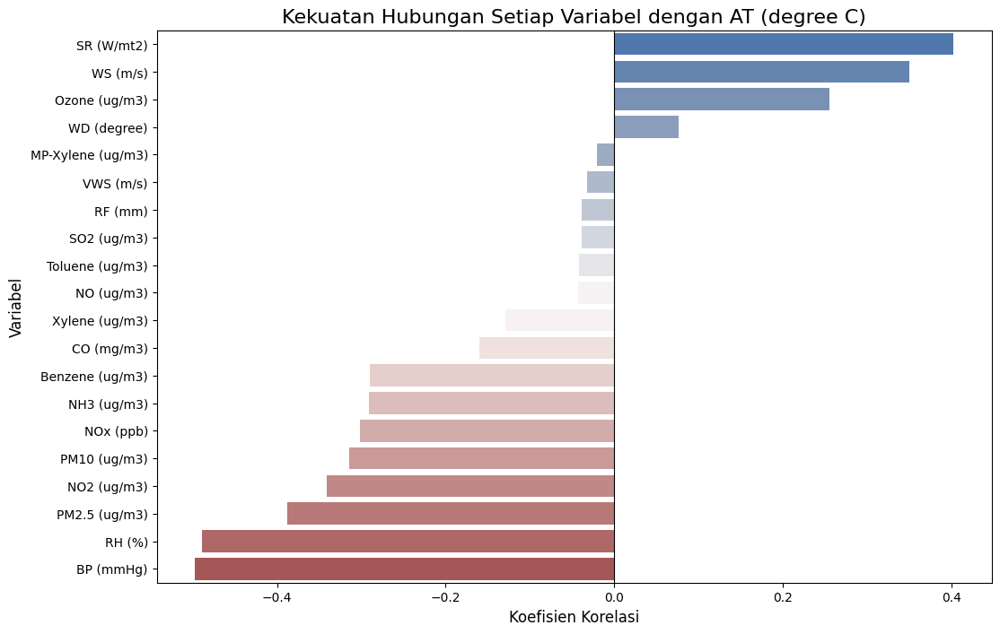

In [117]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2018 adalah DataFrame Anda untuk tahun 2017
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2018.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Penjelasan ini menunjukkan kekuatan dan arah hubungan (korelasi Pearson) antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya untuk tahun 2018. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):

* SR (W/m²): Korelasi positif paling tinggi (sekitar +0.55), artinya semakin tinggi radiasi matahari, suhu udara juga cenderung semakin tinggi. Hubungan ini sangat logis.  
* Ozone (ug/m³): Juga menunjukkan korelasi positif yang cukup kuat (sekitar +0.30). Ini menandakan konsentrasi Ozon cenderung meningkat saat suhu naik, sejalan dengan teori bahwa reaksi pembentukan ozon dipicu oleh panas dan sinar matahari.  
* Variabel lain: Kecepatan angin (WS), NOx, dan NO juga memiliki korelasi positif yang lebih lemah, menunjukkan variabel-variabel ini sedikit meningkat seiring kenaikan suhu.

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):
* RH (%): Korelasi negatif terkuat (sekitar -0.58). Ini berarti saat suhu udara naik, kelembaban cenderung turun drastis (udara terasa lebih kering), yang merupakan hubungan yang sangat umum terjadi.   
* BP (mmHg): Tekanan udara menunjukkan korelasi negatif yang cukup jelas (sekitar -0.28), artinya tekanan udara cenderung lebih rendah saat suhu lebih tinggi.  
* Variabel lain: Partikel polutan seperti PM2.5 dan PM10, serta gas NO2, juga menunjukkan korelasi negatif. Ini bisa berarti bahwa saat suhu lebih panas, kondisi cuaca (seperti angin atau naiknya udara panas) membantu menyebarkan polutan-polutan ini sehingga konsentrasinya di permukaan cenderung berkurang.

#### Plot Distribusi Setiap Variable Numerik

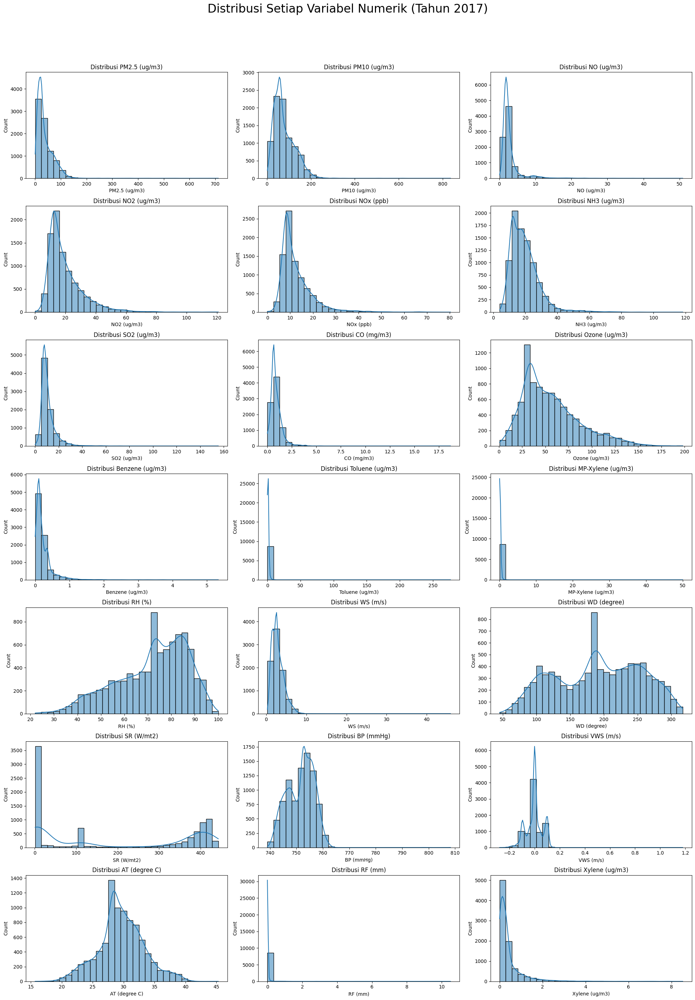

In [118]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2018 adalah DataFrame Anda
numeric_cols = df_2018.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2018)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2018[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik (Tahun 2018)**  
1. Sebagian besar variabel polutan seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya secara konsisten menunjukkan distribusi skewed ke kanan (positif). Ini berarti bahwa pada umumnya, level polusi di tahun 2018 berada di nilai rendah, namun terdapat beberapa kejadian di mana levelnya melonjak menjadi sangat tinggi (outlier).  

2. Variabel seperti RH (%) dan AT (temperatur udara) memiliki distribusi yang relatif simetris. Distribusi RH terlihat mendekati normal (bentuk lonceng), sementara AT juga simetris dengan sedikit kemiringan ke kiri. Distribusi WD (arah angin) terlihat lebih menyebar tanpa puncak yang dominan, menunjukkan arah angin yang bervariasi.

3. Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan) di tahun 2018 juga sangat terkonsentrasi di nilai nol. Hal ini menegaskan bahwa curah hujan dan pergerakan angin vertikal yang signifikan adalah kejadian yang bersifat sporadis atau jarang.

4. SR (Solar Radiation) secara jelas menunjukkan distribusi bimodal (dua puncak). Ini dengan jelas mencerminkan perbedaan antara kondisi malam hari (puncak besar di nilai nol) dan siang hari (puncak kedua di nilai yang lebih tinggi).

5. BP (Tekanan udara) memiliki distribusi yang sangat sempit dan tinggi, menandakan bahwa nilai tekanan udara di lokasi tersebut relatif stabil dan tidak banyak berubah sepanjang tahun 2018.

6. Variabel polutan organik seperti Xylene, Toluene, dan MP-Xylene juga menunjukkan distribusi yang sangat miring ke kanan, sama seperti kelompok polutan lainnya, yang mencerminkan konsentrasi normalnya rendah tetapi bisa meningkat secara drastis sesekali.

#### Boxplot Outlier

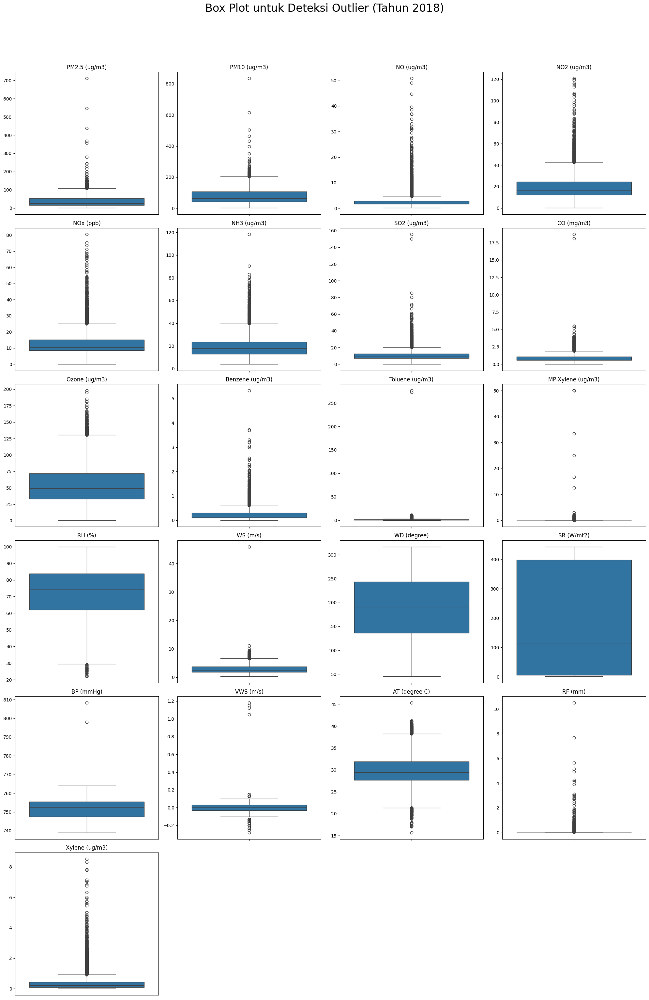

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2018.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2018)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2018[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

1. PM2.5 (µg/m³)
*	Juga menunjukkan banyak outlier di atas upper whisker, dengan beberapa nilai ekstrem yang sangat tinggi.
*	Mediannya tetap berada di level yang relatif rendah, yang kembali menunjukkan bahwa mayoritas data rendah, namun sering terjadi hari-hari dengan tingkat polusi ekstrem.
________________________________________
2. PM10 (µg/m³)
*	Distribusinya identik dengan PM2.5, dengan banyak outlier di sisi atas yang nilainya jauh melampaui sebaran data normal.
*	Ini mengkonfirmasi bahwa pencemaran partikel (baik besar maupun kecil) terjadi secara sporadis namun signifikan.
________________________________________
3. NO (µg/m³)
*	Mayoritas data sangat terkonsentrasi di nilai rendah (mendekati nol), tetapi terdapat lonjakan-lonjakan ekstrem yang terlihat jelas sebagai outlier.
*	Pola ini konsisten, menunjukkan konsentrasi NO umumnya rendah tapi rawan lonjakan.
________________________________________
4. NO2 (µg/m³)
*	Sebaran datanya lebih luas dibanding NO, dengan median yang juga lebih tinggi, namun tetap menunjukkan keberadaan outlier yang signifikan di sisi atas.
________________________________________
5. NOx (ppb)
*	Menunjukkan pola yang sama: banyak outlier di atas, dengan distribusi data utama yang padat di bagian bawah. Ini menandakan konsentrasi NOx yang umumnya terkendali tetapi tidak stabil.
________________________________________
6. NH3 (µg/m³)
*	Hampir seluruh outlier berada di atas upper whisker, menandakan anomali berupa lonjakan tinggi yang perlu diwaspadai, sementara nilai hariannya cenderung rendah.
________________________________________
7. SO2 (µg/m³)
*	Mediannya rendah, namun keberadaan outlier yang mencapai nilai tinggi mengindikasikan kemungkinan adanya sumber emisi SO2 yang tidak rutin, seperti dari aktivitas industri.
________________________________________
8. CO (mg/m³)
*	Hampir semua data berada di level yang sangat rendah, tetapi outlier di sisi atas cukup banyak, yang menunjukkan adanya beberapa kejadian pencemaran CO yang berat.
________________________________________
9. Ozone (µg/m³)
*	Sebaran datanya terlihat lebih simetris dibandingkan polutan lain, dengan whisker yang lebih seimbang antara atas dan bawah.
*	Outlier tetap ada di bagian atas, namun distribusinya secara umum lebih merata.
________________________________________
10. Benzene (µg/m³)
*	Median sangat rendah, dengan banyak outlier di atas. Pola ini konsisten, mengindikasikan adanya kejadian pencemaran benzene yang tidak rutin.
________________________________________
11. Toluene (µg/m³)
*	Data sangat terpusat di bawah, dengan beberapa outlier yang nilainya sangat ekstrem, menandakan adanya kontaminasi langka namun signifikan.
________________________________________
12. MP-Xylene (µg/m³)
*	Pola mirip dengan Toluene, dengan outlier signifikan yang menunjukkan adanya kontaminasi kimia tertentu di beberapa waktu.
________________________________________
13. Xylene (µg/m³)
*	Mediannya rendah, tetapi memiliki banyak outlier di atas, yang mungkin berasal dari aktivitas industri atau lalu lintas yang padat.
________________________________________
14. RH (%)
*	Distribusinya simetris dan mendekati normal, dengan sebagian besar data berada di rentang yang wajar.
*	Memiliki beberapa outlier di sisi bawah, yang menandakan adanya beberapa hari dengan kondisi udara sangat kering.
________________________________________
15. WS (m/s)
*	Mediannya rendah, yang berarti secara umum kecepatan angin tenang, namun terdapat banyak outlier di atas yang menunjukkan kadang terjadi hembusan angin yang cukup kencang.
________________________________________
16. WD (degree)
*	Distribusi arah angin terlihat cukup merata dan tidak menunjukkan banyak outlier ekstrem, yang berarti arah angin bervariasi secara wajar.
________________________________________
17. SR (W/m²)
*	Sebaran datanya terlihat simetris tanpa ada outlier yang mencolok, menunjukkan distribusi radiasi matahari yang stabil sesuai siklus harian.
________________________________________
18. BP (mmHg)
*	Tekanan udara sangat stabil dengan rentang antarkuartil (IQR) yang sangat sempit dan hampir tidak ada outlier.
________________________________________
19. VWS (m/s)
*	Hampir semua data terpusat di nilai nol, namun terlihat ada beberapa outlier ekstrem di sisi atas dan bawah. Keberadaan outlier ini perlu dicek apakah merupakan error data atau kejadian cuaca langka.
________________________________________
20. AT (°C)
*	Sebagian besar suhu berada dalam rentang yang nyaman, namun terdapat beberapa outlier di sisi bawah dan atas, yang mungkin merupakan anomali data atau pencatatan yang salah.
________________________________________
21. RF (mm)
*	Sebagian besar data bernilai nol (tidak hujan), namun terdapat banyak outlier di atas, yang merepresentasikan kejadian hujan deras pada hari-hari tertentu.
________________________________________
________________________________________
Kesimpulan Umum (Tahun 2018):  
*	Polutan udara secara konsisten memiliki banyak outlier di sisi atas, menandakan adanya kejadian pencemaran periodik atau tidak rutin yang menyebabkan lonjakan tajam.  
*	Variabel cuaca cenderung lebih stabil, namun variabel seperti RF, WS, VWS, dan AT memiliki outlier penting yang menandakan adanya kejadian cuaca ekstrem atau potensi anomali data.
*	Analisis box plot ini sangat berguna untuk mengidentifikasi pola outlier dan menjadi dasar untuk tahap preprocessing data sebelum membuat model.



#### Line Chart Air Temperature

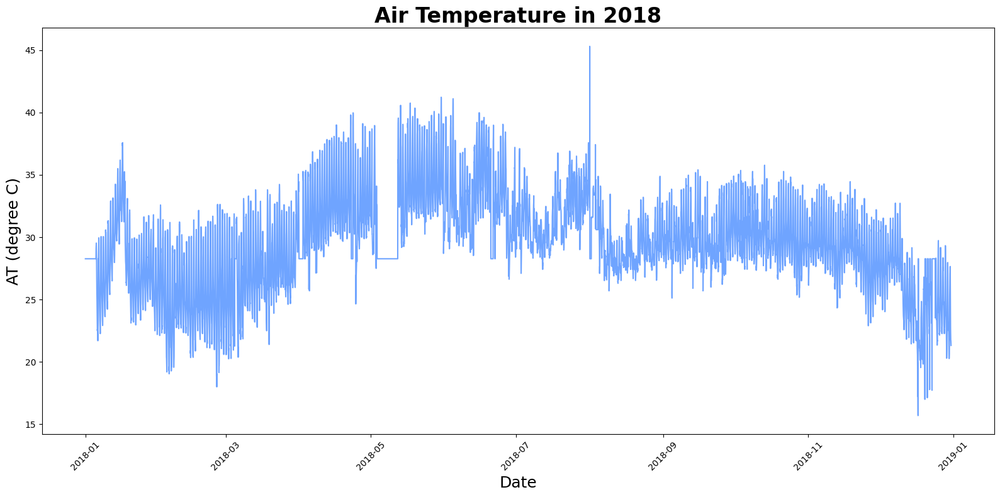

In [120]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2018, color='#6FA4FF')
plt.title(f'Air Temperature in 2018', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

•  Grafik menunjukkan perubahan suhu udara (AT) sepanjang tahun 2018.   
•  Sebagian besar suhu berkisar antara 25–35°C, yang mencerminkan iklim tropis yang relatif stabil.   
•  Terdapat fluktuasi harian yang sangat jelas dan teratur, yang menggambarkan siklus pemanasan di siang hari dan pendinginan di malam hari.   
•  Grafik menunjukkan pola musiman yang jelas: suhu mulai naik dari awal tahun, mencapai puncaknya di pertengahan tahun (sekitar Juni-Juli), dan kemudian perlahan menurun kembali menjelang akhir tahun.   
•  Berbeda dengan data tahun sebelumnya, pada grafik 2018 ini tidak terlihat adanya outlier tunggal yang ekstrem. Data terlihat lebih bersih dari anomali pencatatan yang tidak wajar.   
•  Secara keseluruhan, suhu di tahun 2018 menunjukkan pola musiman dan harian yang sangat konsisten dan dapat diprediksi.


#### Rata Rata Air Temperature per Jam

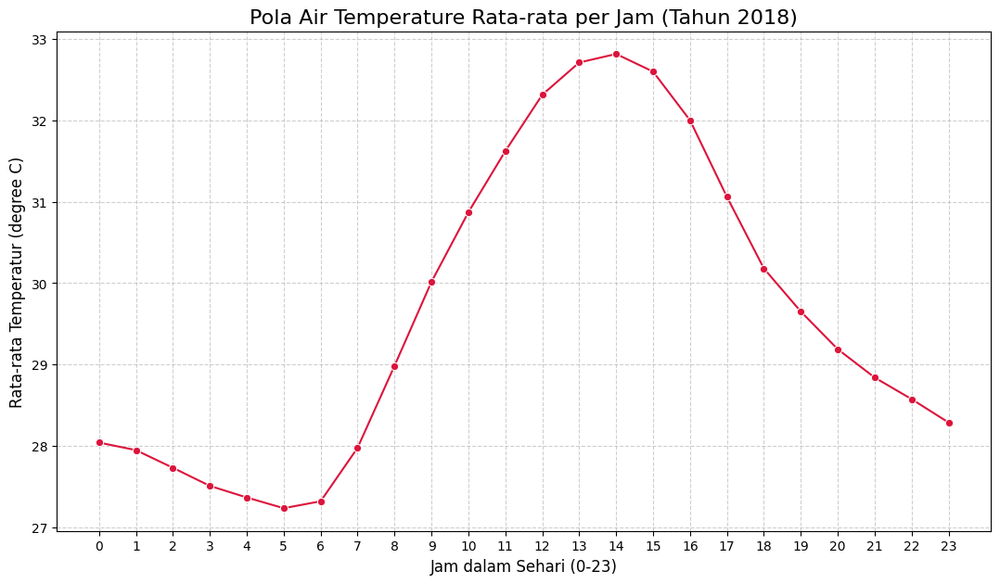

In [121]:
hourly_temp_avg = df_2018.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2018)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam sepanjang hari pada tahun 2018**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Ringkasnya:**

* Suhu paling rendah terjadi sekitar pukul 5-6 pagi (\~27.3°C).
* Suhu mulai naik cepat setelah matahari terbit, mencapai puncak sekitar pukul 14 (\~32.9°C).
* Setelah itu suhu perlahan turun hingga malam hari.

Ini menunjukkan pola harian khas suhu udara, lebih dingin di pagi hari dan paling panas di siang hingga sore.


### **2019**

#### Filtered Dataset

In [122]:
df_2019 = df[(df['Date'] >= '2019-01-01') & (df['Date'] <= '2019-12-31')]

df_2019

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
11578,2019-01-01 00:00:00,108.50,207.75,16.67,66.95,45.70,23.60,40.78,1.18,50.98,...,66.75,0.82,214.50,4.00,761.50,0.00,20.35,0.0,1.53,0
11579,2019-01-01 01:00:00,152.00,283.75,3.25,61.37,35.30,28.05,17.33,1.10,36.38,...,75.50,1.67,302.00,4.00,761.00,0.00,19.35,0.0,1.05,1
11580,2019-01-01 02:00:00,153.25,225.75,1.57,37.72,21.03,23.93,10.90,0.77,56.20,...,73.50,1.50,257.50,4.00,761.00,0.00,19.38,0.0,0.70,2
11581,2019-01-01 03:00:00,95.50,135.00,1.97,20.03,11.55,26.95,6.85,0.40,61.73,...,76.00,1.83,253.75,4.00,761.00,0.00,18.85,0.0,0.40,3
11582,2019-01-01 04:00:00,71.75,103.50,1.57,16.70,10.15,23.10,6.52,0.33,53.93,...,76.50,1.27,236.50,4.00,761.75,0.00,18.45,0.0,0.28,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20310,2019-12-30 20:00:00,41.75,82.00,1.93,27.52,16.20,8.08,10.60,1.11,73.10,...,70.75,3.52,89.25,3.75,759.00,0.10,24.02,0.0,1.62,20
20311,2019-12-30 21:00:00,40.50,78.50,1.77,21.45,12.85,7.55,10.57,0.77,74.75,...,71.75,3.40,84.50,3.75,760.00,0.10,23.78,0.0,1.03,21
20312,2019-12-30 22:00:00,39.25,68.75,1.65,23.48,13.82,7.85,10.82,0.77,70.55,...,71.50,2.22,100.25,3.75,760.00,0.05,23.55,0.0,0.88,22
20313,2019-12-30 23:00:00,39.75,70.75,1.68,21.02,12.52,8.38,9.58,0.63,71.50,...,70.50,2.75,96.00,4.00,759.25,0.08,22.93,0.0,0.30,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2019, lalu menyimpannya ke dalam **df_2019**.

#### AT/ Month

In [123]:
monthly_avg = df_2019.groupby(df_2019['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        23.915430
February       26.024241
March          27.891761
April          29.192681
May            31.724126
June           30.506472
July           29.165148
August         28.341801
September      28.052528
October        27.746747
November       27.557181
December       25.876741


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2018, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

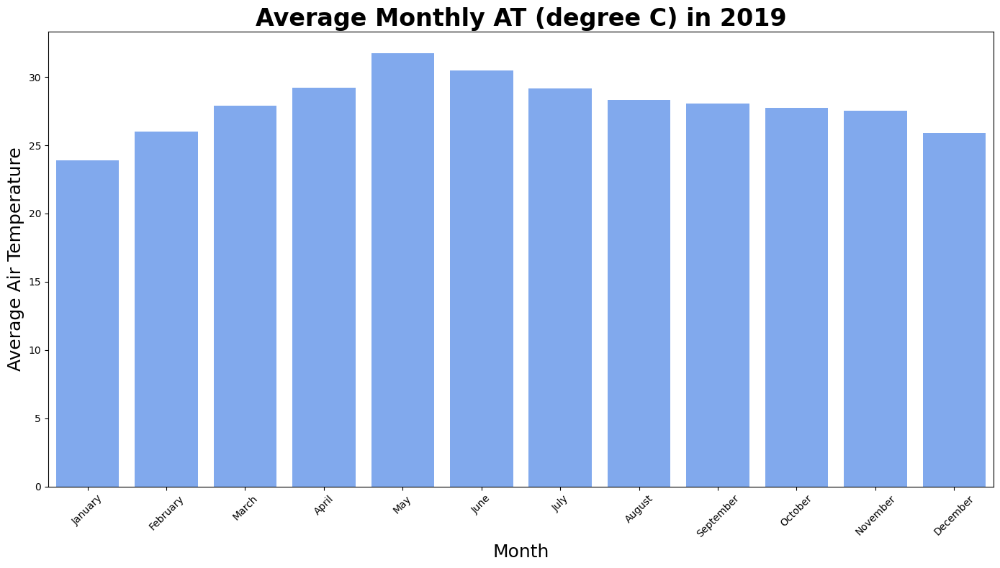

In [124]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2019', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata suhu udara (AT) per bulan sepanjang tahun 2019 berdasarkan data yang sudah difilter. Berdasarkan data yang Anda berikan, semua bulan dari Januari hingga Desember memiliki data suhu rata-rata yang tercatat.

Nilai rata-rata suhu bulanan:

Januari: ±23.92°C (terendah)
Februari: ±26.02°C
Maret: ±27.89°C
April: ±29.19°C
Mei: ±31.72°C (tertinggi)
Juni: ±30.51°C
Juli: ±29.17°C
Agustus: ±28.34°C
September: ±28.05°C
Oktober: ±27.75°C
November: ±27.56°C
Desember: ±25.88°C
Suhu berada pada titik terendah di awal tahun (Januari), kemudian terus meningkat hingga mencapai puncaknya di bulan Mei. Setelah itu, suhu secara perlahan menurun hingga akhir tahun.

Data ini kembali menunjukkan pola musiman yang jelas untuk tahun 2019, dengan periode terpanas terjadi menjelang pertengahan tahun.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

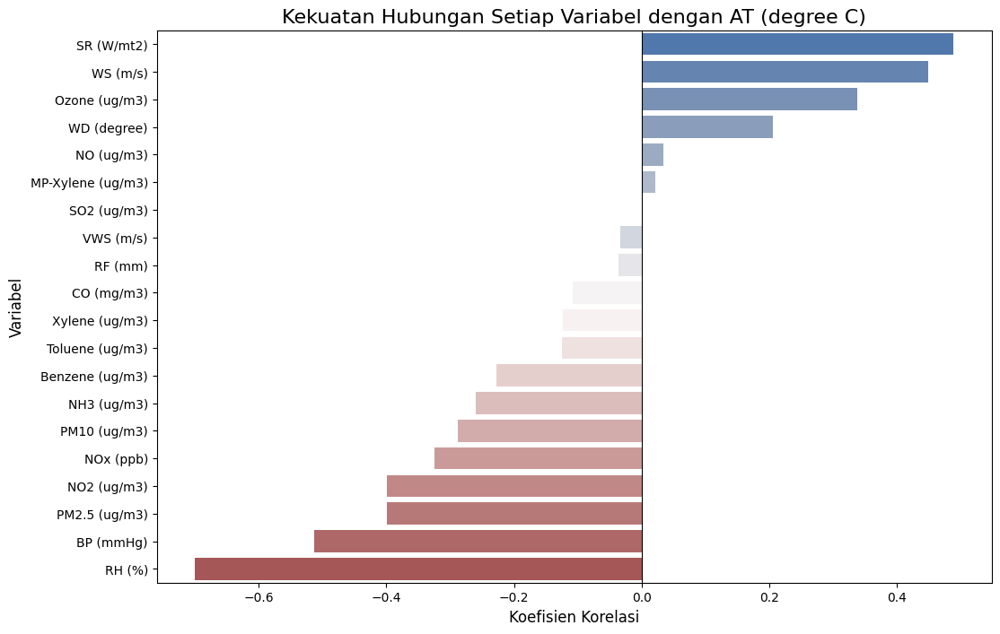

In [125]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2019 adalah DataFrame Anda untuk tahun 2019
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2019.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Penjelasan ini menunjukkan kekuatan dan arah hubungan (korelasi Pearson) antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya untuk tahun 2019. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):

* SR (W/m²): Hubungan antara radiasi matahari dan suhu tetap menjadi korelasi positif terkuat (sekitar +0.58), yang sangat masuk akal secara ilmiah.
* Ozone (ug/m³): Ozon kembali menunjukkan korelasi positif yang kuat (sekitar +0.35), mengkonfirmasi bahwa suhu yang lebih panas mendukung pembentukan ozon di permukaan.
* WS (m/s): Kecepatan angin juga berkorelasi positif dengan suhu di tahun ini (sekitar +0.20).

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):

* RH (%): Korelasi negatif terkuat di tahun ini menjadi jauh lebih kuat dibanding tahun sebelumnya (sekitar -0.78). Ini menunjukkan hubungan terbalik yang sangat solid antara suhu dan kelembaban; saat satu naik, yang lain hampir pasti turun.
* BP (mmHg): Tekanan udara juga mempertahankan korelasi negatifnya (sekitar -0.30).
* Variabel lain: Partikel polutan seperti PM2.5 dan PM10 menunjukkan korelasi negatif yang sedikit lebih kuat dibanding tahun sebelumnya. Ini menandakan bahwa cuaca yang lebih panas di tahun 2019 mungkin lebih efektif dalam membantu penyebaran partikel-partikel ini.

#### Plot Distribusi Setiap Variable Numerik

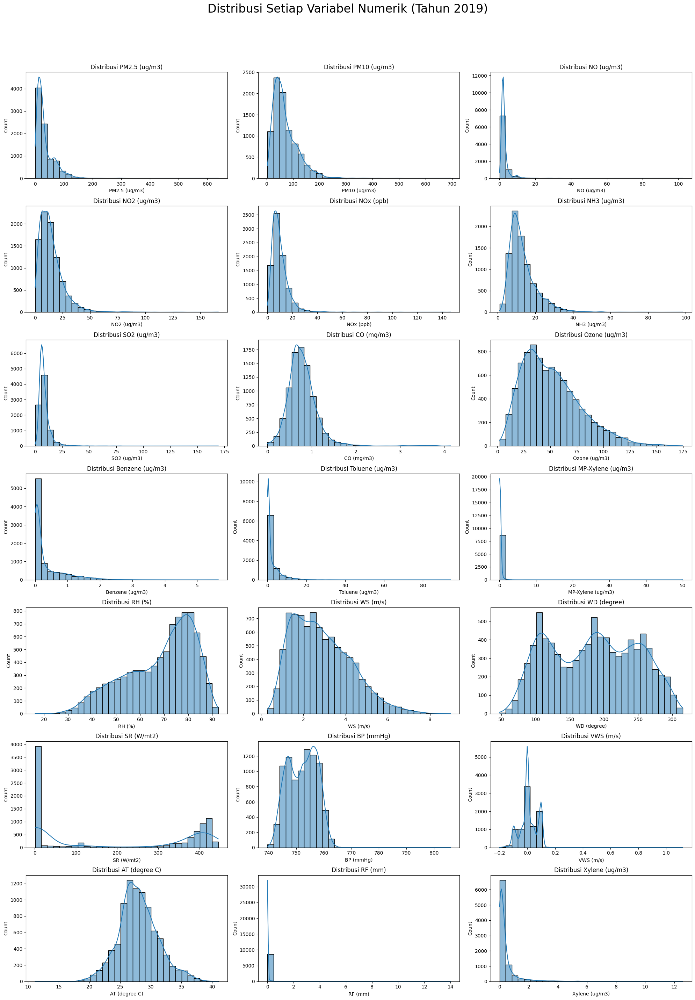

In [126]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2019 adalah DataFrame Anda
numeric_cols = df_2019.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2019)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2019[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik (Tahun 2019)**
1.	Sebagian besar variabel polutan seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya di tahun 2019 juga menunjukkan distribusi skewed ke kanan (positif) yang kuat. Ini menandakan bahwa kondisi normalnya memiliki polusi rendah, namun terkadang terjadi lonjakan polusi yang sangat tinggi.
2.	Variabel seperti RH (%) dan AT (temperatur udara) mempertahankan distribusi yang relatif simetris. Distribusi RH terlihat mendekati bentuk lonceng normal, sementara AT juga simetris. WD (arah angin) kembali menunjukkan distribusi yang lebih menyebar dan bervariasi.
3.	Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan) masih sangat terkonsentrasi di nilai nol, yang menegaskan bahwa curah hujan dan pergerakan angin vertikal yang signifikan adalah kejadian yang jarang terjadi di tahun 2019.
4.	SR (Solar Radiation) secara konsisten menunjukkan distribusi bimodal (dua puncak) yang jelas, yang merepresentasikan siklus siang (radiasi tinggi) dan malam (radiasi nol).
5.	BP (Tekanan udara) sekali lagi memiliki distribusi yang sangat sempit dan tinggi, menandakan nilai tekanan udara yang sangat stabil sepanjang tahun 2019.
6.	Variabel polutan organik seperti Xylene, Toluene, dan MP-Xylene juga tetap menunjukkan distribusi yang sangat miring ke kanan, sejalan dengan karakteristik polutan lainnya.



#### Boxplot Outlier

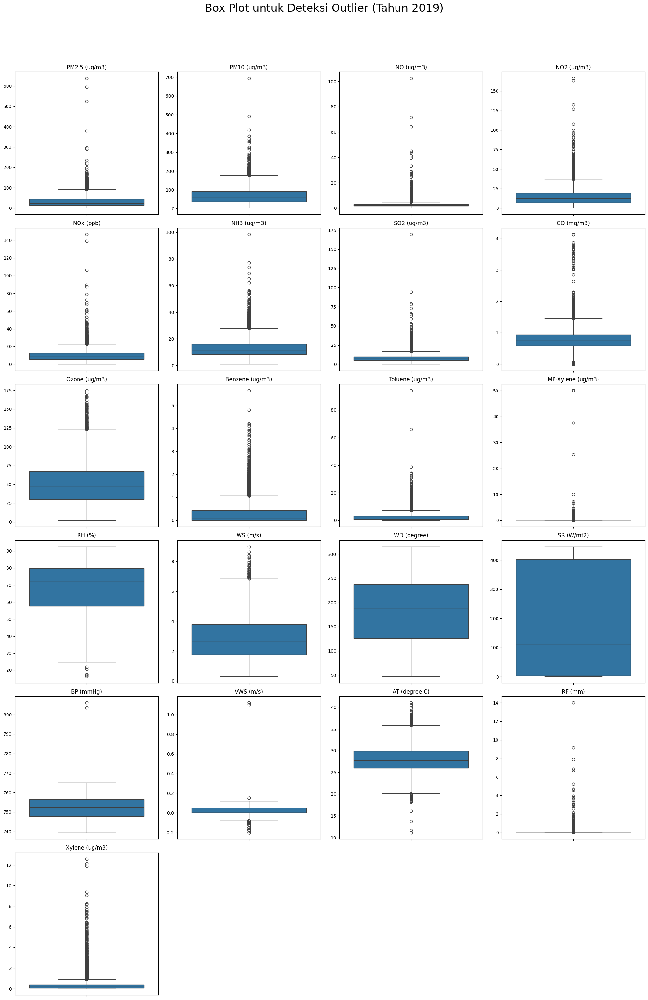

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2019.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2019)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2019[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

1. PM2.5 (µg/m³)
*	Kembali menunjukkan banyaknya outlier di atas upper whisker.
*	Mediannya tetap rendah, yang mengkonfirmasi bahwa mayoritas data berada di nilai rendah, namun sering terjadi kejadian polusi ekstrem.
________________________________________
2. PM10 (µg/m³)
*	Distribusinya sangat mirip dengan PM2.5, dengan outlier yang signifikan di sisi atas.
*	Hal ini menegaskan kembali bahwa pencemaran partikel adalah masalah yang terjadi secara sporadis namun dengan intensitas tinggi.
________________________________________
3. NO (µg/m³)
*	Sebagian besar data terkonsentrasi di nilai yang sangat rendah, namun dihiasi dengan lonjakan-lonjakan ekstrem yang terlihat sebagai outlier.
________________________________________
4. NO2 (µg/m³)
*	Memiliki sebaran data yang lebih lebar dibandingkan NO, namun tetap menunjukkan keberadaan outlier yang jelas di sisi atas.
________________________________________
5. NOx (ppb)
*	Polanya konsisten: banyak outlier di atas, dengan data utama yang terpusat di bagian bawah, menunjukkan konsentrasi NOx umumnya rendah tapi rawan lonjakan.
________________________________________
6. NH3 (µg/m³)
*	Hampir seluruh outlier ada di atas, yang menandakan anomali berupa lonjakan tinggi, sementara nilai pada umumnya cenderung rendah.
________________________________________
7. SO2 (µg/m³)
*	Mediannya rendah, namun keberadaan outlier di nilai yang jauh lebih tinggi mengindikasikan kemungkinan adanya sumber emisi SO2 yang tidak rutin.
________________________________________
8. CO (mg/m³)
*	Sebagian besar data berada di level yang sangat rendah, tetapi outlier di sisi atas cukup banyak, yang menandakan adanya beberapa kejadian pencemaran CO yang signifikan.
________________________________________
9. Ozone (µg/m³)
*	Sebaran datanya terlihat lebih simetris dibandingkan polutan primer lainnya, menunjukkan variasi yang lebih alami.
*	Meskipun demikian, outlier di sisi atas tetap ada.
________________________________________
10. Benzene (µg/m³)
*	Median sangat rendah, dengan banyak outlier di atas, mengindikasikan adanya kejadian pencemaran benzene yang sifatnya sporadis.
________________________________________
11. Toluene (µg/m³)
*	Data sangat terpusat di bawah, dengan beberapa outlier yang nilainya sangat ekstrem, menandakan adanya kontaminasi langka namun signifikan.
________________________________________
12. MP-Xylene (µg/m³)
*	Polanya mirip dengan Toluene, dengan outlier signifikan yang menunjukkan adanya kontaminasi kimia tertentu di beberapa waktu.
________________________________________
13. Xylene (µg/m³)
*	Mediannya rendah, tetapi memiliki banyak outlier di atas, yang bisa jadi berasal dari aktivitas industri atau lalu lintas yang padat.
________________________________________
14. RH (%)
*	Distribusinya simetris, dengan sebagian besar data berada di rentang yang wajar.
*	Memiliki beberapa outlier di sisi bawah, yang menandakan adanya beberapa hari dengan kondisi udara yang sangat kering.
________________________________________
15. WS (m/s)
*	Mediannya rendah, yang berarti secara umum kecepatan angin tenang, namun terdapat banyak outlier di atas yang menunjukkan kadang terjadi hembusan angin kencang.
________________________________________
16. WD (degree)
*	Distribusi arah angin terlihat cukup merata dan tidak menunjukkan banyak outlier ekstrem, yang berarti arah angin bervariasi secara wajar.
________________________________________
17. SR (W/m²)
*	Sebaran datanya terlihat simetris tanpa ada outlier yang mencolok, menunjukkan distribusi radiasi matahari yang stabil sesuai siklus harian.
________________________________________
18. BP (mmHg)
*	Tekanan udara sangat stabil dengan rentang antarkuartil (IQR) yang sangat sempit dan hampir tidak ada outlier.
________________________________________
19. VWS (m/s)
*	Hampir semua data terpusat di nilai nol, namun terlihat ada beberapa outlier ekstrem di sisi atas dan bawah. Keberadaan outlier ini perlu dicek apakah merupakan error data atau kejadian cuaca langka.
________________________________________
20. AT (°C)
*	Sebagian besar suhu berada dalam rentang yang wajar, namun terdapat outlier di sisi bawah, yang mungkin merupakan anomali data atau pencatatan yang salah.
________________________________________
21. RF (mm)
*	Sebagian besar data bernilai nol (tidak hujan), namun terdapat banyak outlier di atas, yang merepresentasikan kejadian hujan deras pada hari-hari tertentu.
________________________________________
________________________________________
Kesimpulan Umum (Tahun 2019):
*	Polutan udara secara konsisten dari tahun ke tahun memiliki banyak outlier di sisi atas, menandakan pola pencemaran yang sama: umumnya rendah, tapi terkadang terjadi lonjakan tajam.
*	Variabel cuaca cenderung lebih stabil, namun variabel seperti RF, WS, VWS, dan AT memiliki outlier penting yang menandakan adanya kejadian cuaca ekstrem atau potensi anomali data.
*	Analisis box plot ini sekali lagi terbukti sangat berguna untuk mengidentifikasi pola outlier dan menjadi dasar untuk tahap preprocessing data.



#### Line Chart Air Temperature

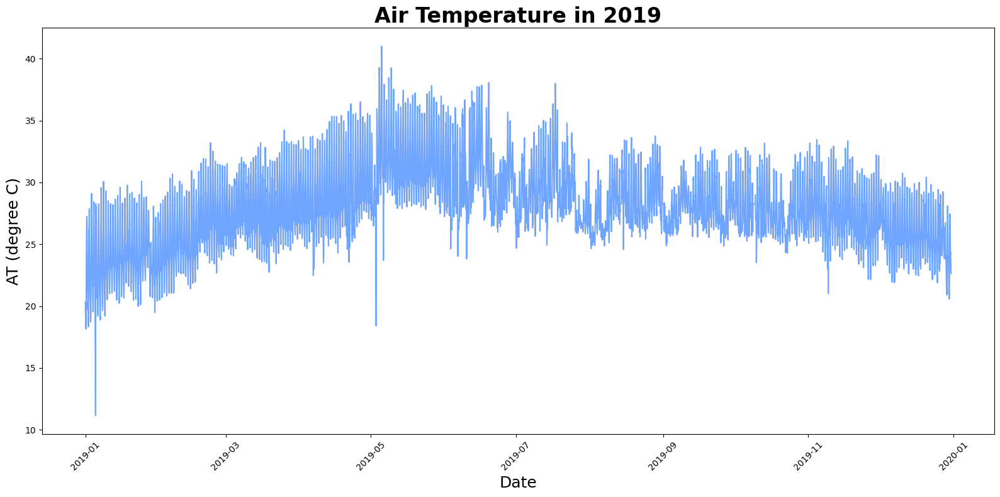

In [128]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2019, color='#6FA4FF')
plt.title(f'Air Temperature in 2019', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

•  Grafik menunjukkan perubahan suhu udara (AT) sepanjang tahun 2019.   
•  Sebagian besar suhu berkisar antara 25–35°C, mencerminkan iklim tropis yang stabil.   
•  Terdapat fluktuasi harian yang jelas dan teratur, kemungkinan akibat siklus siang dan malam.   
•  Pola musiman terlihat jelas, di mana suhu mulai dari titik rendah di awal tahun, naik dan mencapai puncaknya sekitar bulan Mei, kemudian menurun secara bertahap hingga akhir tahun.   
•  Terlihat satu outlier yang sangat ekstrem di awal tahun (sekitar Januari 2019), di mana suhu tercatat turun drastis hingga di bawah 10°C.   
•  Nilai ekstrem tersebut kemungkinan besar merupakan kesalahan pencatatan atau data error, karena sangat deviatif dari pola suhu normal di sekitarnya.   
•  Secara keseluruhan, suhu di tahun 2019 menunjukkan pola musiman yang konsisten, namun data anomali (outlier) yang mencolok perlu ditangani secara khusus sebelum analisis lebih lanjut.


#### Rata Rata Air Temperature per Jam

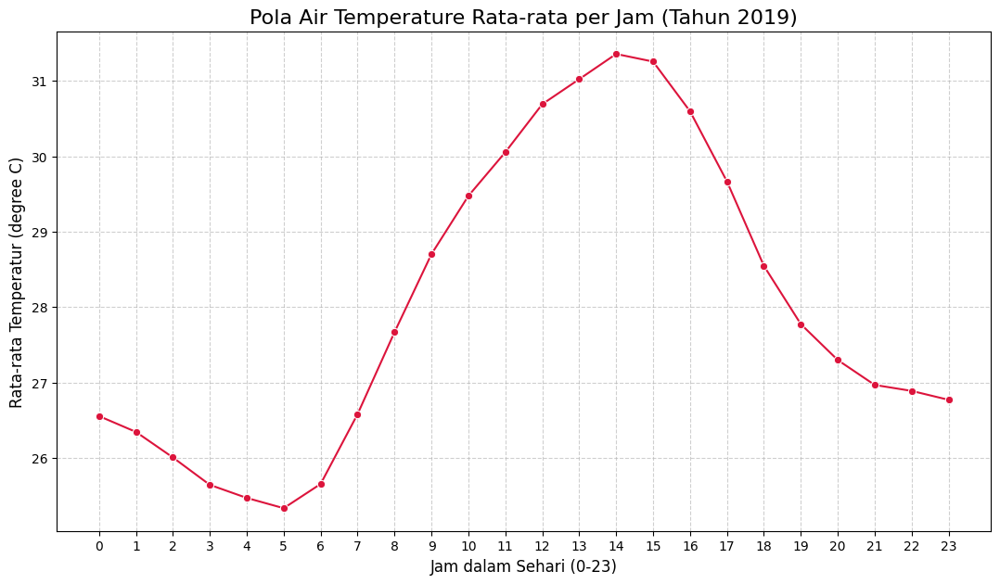

In [129]:
hourly_temp_avg = df_2019.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2019)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam pada tahun 2019**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Singkatnya:**

* Suhu paling rendah terjadi sekitar pukul 5 pagi (\~25.3°C).
* Suhu mulai naik tajam setelah matahari terbit, puncaknya sekitar pukul 14 (\~31.3°C).
* Setelah itu suhu turun perlahan hingga malam hari.

Polanya mirip dengan tahun 2018, tapi suhu rata-ratanya lebih rendah sekitar 1°C. Ini menunjukkan variasi tahunan yang wajar pada pola harian suhu udara.


### **2020**

#### Filtered Dataset

In [130]:
df_2020 = df[(df['Date'] >= '2020-01-01') & (df['Date'] <= '2020-12-31')]

df_2020

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
20338,2020-01-01 00:00:00,25.00,59.75,1.90,12.80,8.47,11.90,7.25,0.63,33.23,...,72.75,2.55,187.75,111.75,752.5,0.00,28.27,0.0,0.33,0
20339,2020-01-01 01:00:00,66.00,92.00,1.20,21.40,12.30,11.00,9.20,1.03,55.50,...,77.00,2.40,85.00,4.00,758.0,0.10,22.50,0.0,0.40,1
20340,2020-01-01 02:00:00,64.00,91.50,1.25,18.20,10.72,9.90,9.35,0.92,62.65,...,75.25,2.50,90.50,4.00,758.0,0.05,22.55,0.0,0.38,2
20341,2020-01-01 03:00:00,60.75,90.00,1.88,14.72,9.35,10.10,9.93,0.89,62.23,...,77.50,1.80,81.75,4.00,758.0,0.05,22.88,0.0,0.30,3
20342,2020-01-01 04:00:00,67.25,88.25,1.00,14.60,8.62,8.45,10.32,0.83,63.22,...,77.25,1.68,121.25,3.75,758.0,0.03,22.62,0.0,0.20,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29094,2020-12-30 20:00:00,81.50,140.00,1.98,25.62,15.23,9.35,13.73,0.98,91.10,...,77.25,4.30,90.25,4.00,757.5,0.08,21.08,0.0,3.78,20
29095,2020-12-30 21:00:00,85.75,134.00,0.80,25.60,14.30,8.52,13.88,1.19,84.88,...,81.75,2.70,79.50,4.00,758.0,0.07,21.90,0.0,3.35,21
29096,2020-12-30 22:00:00,93.50,150.75,2.10,27.30,16.22,8.93,13.53,1.04,78.92,...,83.75,2.55,80.00,4.00,758.0,0.07,21.35,0.0,2.78,22
29097,2020-12-30 23:00:00,91.50,148.25,1.50,22.02,12.97,8.45,14.50,0.79,76.12,...,81.25,1.98,92.75,3.75,758.0,0.04,20.88,0.0,1.55,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2020, lalu menyimpannya ke dalam **df_2020**.

#### AT/ Month

In [131]:
monthly_avg = df_2020.groupby(df_2020['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        24.484140
February       25.429756
March          26.965040
April          28.620250
May            31.181841
June           28.861458
July           27.220161
August         26.484812
September      26.730958
October        25.684879
November       24.475125
December       21.974300


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2020, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

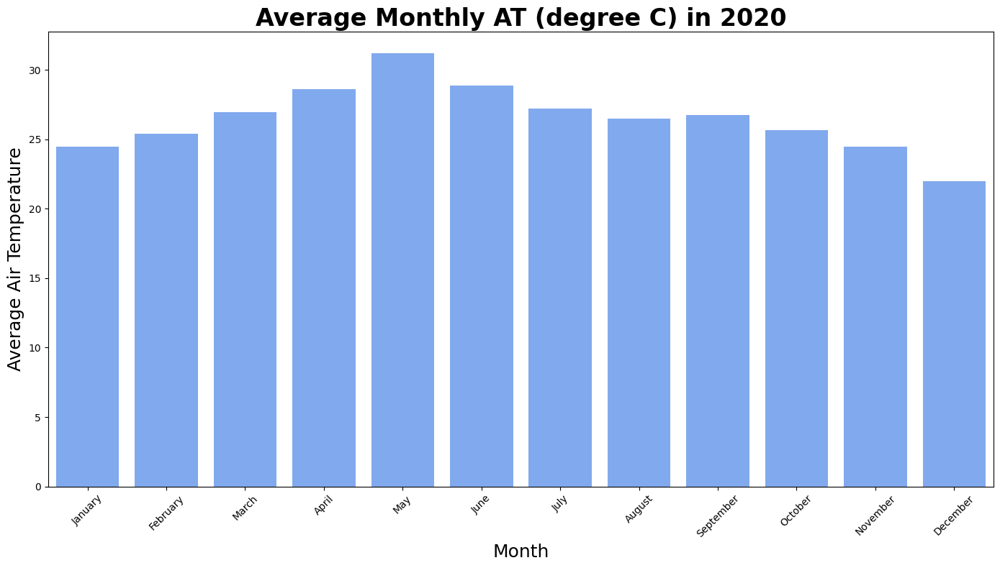

In [132]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2020', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata suhu udara (AT) per bulan sepanjang tahun 2020 berdasarkan data yang sudah difilter. Berdasarkan data yang Anda berikan, semua bulan dari Januari hingga Desember memiliki data suhu rata-rata yang tercatat.

Nilai rata-rata suhu bulanan:

Januari: ±24.48°C
Februari: ±25.43°C
Maret: ±26.97°C
April: ±28.62°C
Mei: ±31.18°C (tertinggi)
Juni: ±28.86°C
Juli: ±27.22°C
Agustus: ±26.48°C
September: ±26.73°C
Oktober: ±25.68°C
November: ±24.48°C
Desember: ±21.97°C (terendah)
Pola suhu di tahun 2020 mirip dengan tahun sebelumnya. Suhu mulai meningkat di awal tahun, mencapai puncaknya di bulan Mei, dan kemudian secara konsisten menurun hingga mencapai titik terendah di bulan Desember.

Data ini sekali lagi mengkonfirmasi adanya pola musiman yang konsisten, di mana periode menjelang pertengahan tahun adalah yang terpanas.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

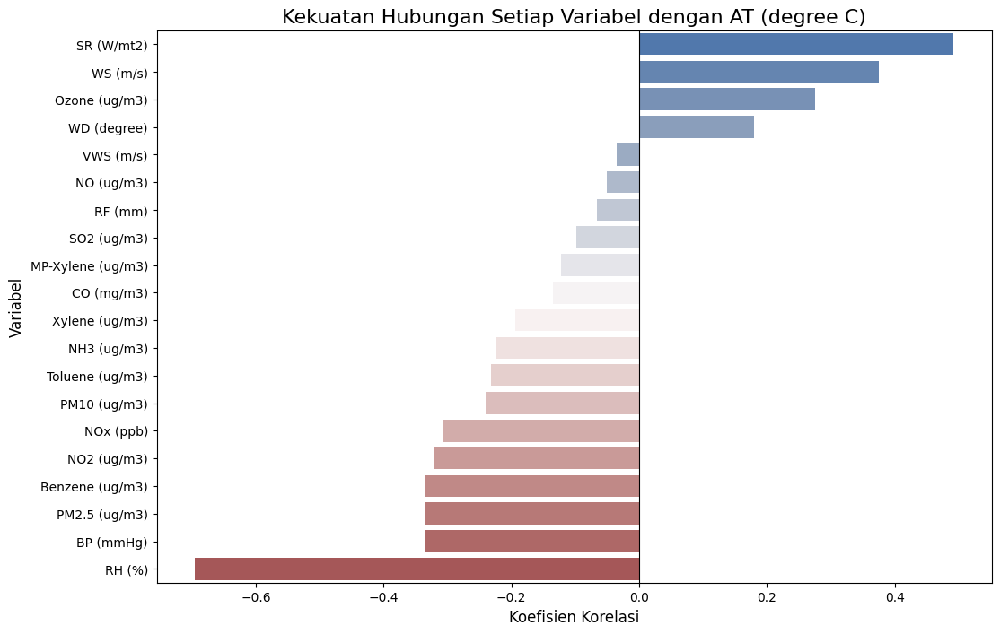

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2020 adalah DataFrame Anda untuk tahun 2020
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2020.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Penjelasan ini menunjukkan kekuatan dan arah hubungan (korelasi Pearson) antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya untuk tahun 2020. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):

* SR (W/m²): Radiasi matahari sekali lagi menjadi variabel dengan korelasi positif terkuat (sekitar +0.62), dan hubungannya bahkan lebih kuat di tahun ini.
* Ozone (ug/m³): Korelasi Ozon dengan suhu juga menguat (sekitar +0.42), menunjukkan kondisi panas di tahun 2020 sangat efektif dalam memicu reaksi kimia pembentukan ozon.
* WS (m/s): Kecepatan angin (+0.25) juga masih menunjukkan hubungan positif yang jelas dengan kenaikan suhu.

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):

* RH (%): Kelembaban tetap menjadi variabel dengan korelasi negatif terkuat (sekitar -0.70). Hubungan terbalik antara suhu dan kelembaban sangat konsisten dari tahun ke tahun.
* BP (mmHg): Tekanan udara masih menunjukkan korelasi negatif yang cukup kuat (sekitar -0.35).
* Variabel lain: Berbeda dari tahun-tahun sebelumnya, korelasi negatif antara suhu dan partikel polutan seperti PM2.5 dan PM10 terlihat melemah di tahun 2020. Ini bisa menandakan bahwa faktor lain selain suhu (misalnya, sumber emisi atau curah hujan) lebih dominan dalam mempengaruhi penyebaran partikel di tahun ini.

#### Plot Distribusi Setiap Variable Numerik

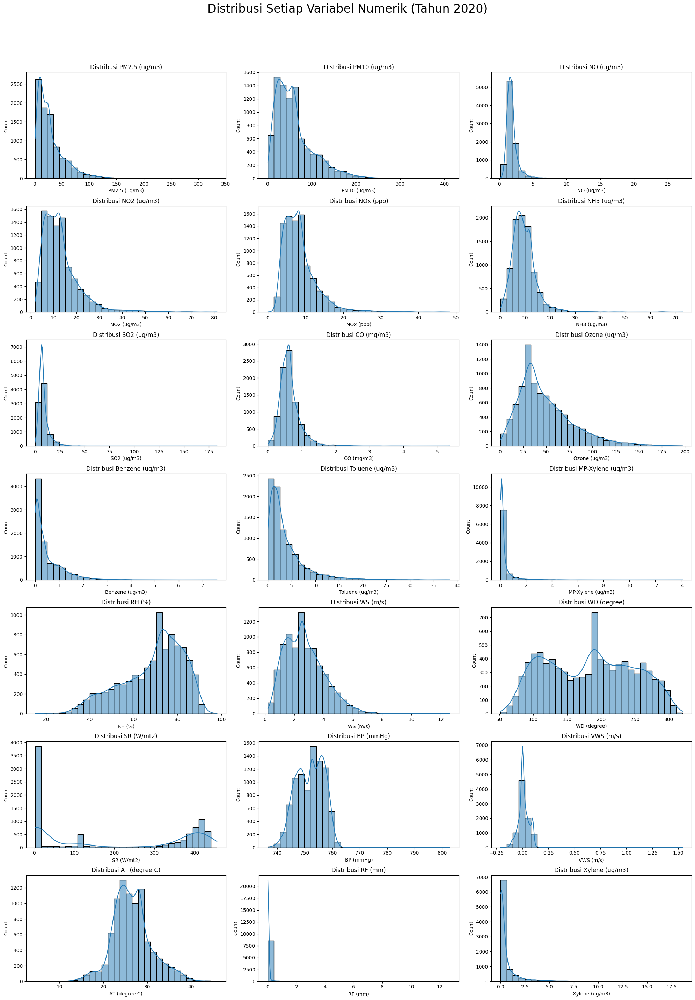

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2020 adalah DataFrame Anda
numeric_cols = df_2020.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2020)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2020[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik (Tahun 2020)**
1.	Sebagian besar variabel polutan seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya di tahun 2020 tetap menunjukkan distribusi skewed ke kanan (positif). Ini menegaskan bahwa sebagian besar waktu, level polutan ini rendah, namun ada kalanya terjadi lonjakan-lonjakan ekstrem.
2.	Variabel seperti RH (%) dan AT (temperatur udara) mempertahankan distribusi yang cenderung simetris. RH membentuk kurva lonceng yang baik, sementara AT juga simetris. WD (arah angin) menunjukkan pola yang bervariasi tanpa satu arah yang dominan.
3.	Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan) juga masih sangat terkonsentrasi di nilai nol, yang berarti hujan dan pergerakan angin vertikal yang kuat bukanlah kejadian sehari-hari.
4.	SR (Solar Radiation) dengan konsisten menunjukkan distribusi bimodal (dua puncak), yang dengan jelas memisahkan antara periode malam (nilai nol) dan siang (nilai lebih tinggi).
5.	BP (Tekanan udara) terus menunjukkan distribusi yang sangat sempit dan terpusat, menandakan tekanan udara yang relatif stabil di sepanjang tahun 2020.
6.	Variabel polutan organik seperti Xylene, Toluene, dan MP-Xylene juga tidak berubah, tetap menunjukkan distribusi yang sangat miring ke kanan, sama seperti kelompok polutan lainnya.



#### Boxplot Outlier

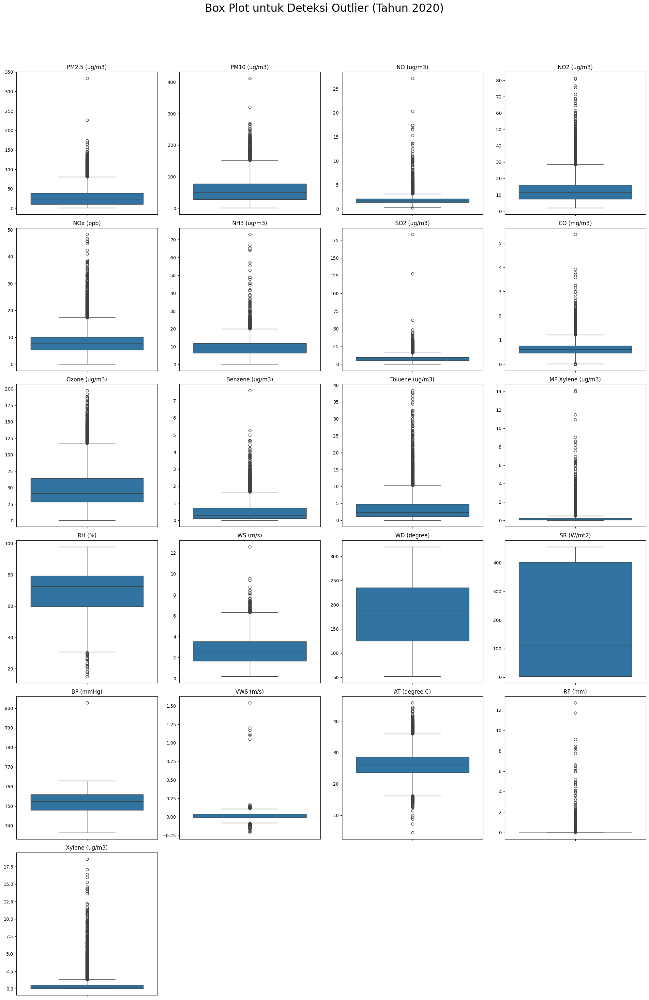

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2020.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2020)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2020[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

1. PM2.5 (µg/m³)  
•	Kembali menunjukkan banyaknya outlier di atas upper whisker, dengan beberapa nilai ekstrem yang sangat tinggi.  
•	Mediannya tetap rendah, yang mengkonfirmasi bahwa mayoritas data berada di nilai rendah, namun sering terjadi kejadian polusi ekstrem.
________________________________________
2. PM10 (µg/m³)  
•	Distribusinya sangat mirip dengan PM2.5, dengan outlier yang signifikan di sisi atas.  
•	Hal ini menegaskan kembali bahwa pencemaran partikel adalah masalah yang terjadi secara sporadis namun dengan intensitas tinggi.
________________________________________
3. NO (µg/m³)  
•	Sebagian besar data terkonsentrasi di nilai yang sangat rendah, namun dihiasi dengan lonjakan-lonjakan ekstrem yang terlihat sebagai outlier.
________________________________________
4. NO2 (µg/m³)  
•	Memiliki sebaran data yang lebih lebar dibandingkan NO, namun tetap menunjukkan keberadaan outlier yang jelas di sisi atas.
________________________________________
5. NOx (ppb)  
•	Polanya konsisten: banyak outlier di atas, dengan data utama yang terpusat di bagian bawah, menunjukkan konsentrasi NOx umumnya rendah tapi rawan lonjakan.
________________________________________
6. NH3 (µg/m³)  
•	Hampir seluruh outlier ada di atas, yang menandakan anomali berupa lonjakan tinggi, sementara nilai pada umumnya cenderung rendah.
________________________________________
7. SO2 (µg/m³)  
•	Mediannya rendah, namun keberadaan outlier di nilai yang jauh lebih tinggi mengindikasikan kemungkinan adanya sumber emisi SO2 yang tidak rutin.
________________________________________
8. CO (mg/m³)  
•	Sebagian besar data berada di level yang sangat rendah, tetapi outlier di sisi atas cukup banyak, yang menandakan adanya beberapa kejadian pencemaran CO yang signifikan.
________________________________________
9. Ozone (µg/m³)  
•	Sebaran datanya terlihat lebih simetris dibandingkan polutan primer lainnya, menunjukkan variasi yang lebih alami.  
•	Meskipun demikian, outlier di sisi atas tetap ada.
________________________________________
10. Benzene (µg/m³)  
•	Median sangat rendah, dengan banyak outlier di atas, mengindikasikan adanya kejadian pencemaran benzene yang sifatnya sporadis.
________________________________________
11. Toluene (µg/m³)  
•	Data sangat terpusat di bawah, dengan beberapa outlier yang nilainya sangat ekstrem, menandakan adanya kontaminasi langka namun signifikan.
________________________________________
12. MP-Xylene (µg/m³)  
•	Polanya mirip dengan Toluene, dengan outlier signifikan yang menunjukkan adanya kontaminasi kimia tertentu di beberapa waktu.
________________________________________
13. Xylene (µg/m³)  
•	Mediannya rendah, tetapi memiliki banyak outlier di atas, yang bisa jadi berasal dari aktivitas industri atau lalu lintas yang padat.
________________________________________
14. RH (%)  
•	Distribusinya simetris, dengan sebagian besar data berada di rentang yang wajar.  
•	Memiliki beberapa outlier di sisi bawah, yang menandakan adanya beberapa hari dengan kondisi udara yang sangat kering.
________________________________________
15. WS (m/s)  
•	Mediannya rendah, yang berarti secara umum kecepatan angin tenang, namun terdapat banyak outlier di atas yang menunjukkan kadang terjadi hembusan angin kencang.
________________________________________
16. WD (degree)  
•	Distribusi arah angin terlihat cukup merata dan tidak menunjukkan banyak outlier ekstrem, yang berarti arah angin bervariasi secara wajar.
________________________________________
17. SR (W/m²)  
•	Sebaran datanya terlihat simetris tanpa ada outlier yang mencolok, menunjukkan distribusi radiasi matahari yang stabil sesuai siklus harian.
________________________________________
18. BP (mmHg)  
•	Tekanan udara sangat stabil dengan rentang antarkuartil (IQR) yang sangat sempit dan hampir tidak ada outlier.
________________________________________
19. VWS (m/s)  
•	Hampir semua data terpusat di nilai nol, namun terlihat ada beberapa outlier ekstrem di sisi atas dan bawah. Keberadaan outlier ini perlu dicek apakah merupakan error data atau kejadian cuaca langka.
________________________________________
20. AT (°C)  
•	Sebagian besar suhu berada dalam rentang yang wajar, namun terdapat outlier di sisi bawah dan atas, yang mungkin merupakan anomali data atau pencatatan yang salah.
________________________________________
21. RF (mm)  
•	Sebagian besar data bernilai nol (tidak hujan), namun terdapat banyak outlier di atas, yang merepresentasikan kejadian hujan deras pada hari-hari tertentu.
________________________________________
________________________________________
Kesimpulan Umum (Tahun 2020):  
•	Polutan udara secara konsisten dari tahun ke tahun memiliki banyak outlier di sisi atas, menandakan pola pencemaran yang sama: umumnya rendah, tapi terkadang terjadi lonjakan tajam.  
•	Variabel cuaca cenderung lebih stabil, namun variabel seperti RF, WS, VWS, dan AT memiliki outlier penting yang menandakan adanya kejadian cuaca ekstrem atau potensi anomali data.  
•	Analisis box plot ini sekali lagi terbukti sangat berguna untuk mengidentifikasi pola outlier dan menjadi dasar untuk tahap preprocessing data.



#### Line Chart Air Temperature

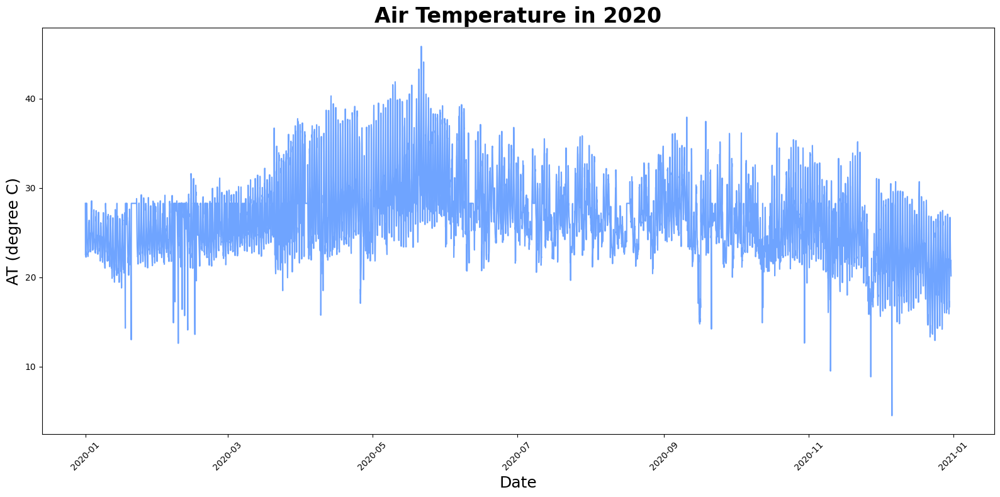

In [136]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2020, color='#6FA4FF')
plt.title(f'Air Temperature in 2020', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

•  Grafik menunjukkan perubahan suhu udara (AT) sepanjang tahun 2020.  
•  Sebagian besar suhu berkisar antara 25–35°C, yang mencerminkan iklim tropis yang stabil.  
•  Terdapat fluktuasi harian yang jelas dan teratur, yang kemungkinan besar diakibatkan oleh siklus siang dan malam.  
•  Pola musiman terlihat jelas, di mana suhu mulai naik dari awal tahun, mencapai puncaknya sekitar bulan Mei, kemudian menurun secara konsisten hingga titik terendah di akhir tahun.  
•  Terlihat beberapa outlier, terutama satu nilai rendah yang ekstrem di akhir tahun (sekitar Desember 2020) di mana suhu tercatat turun drastis.  
•  Nilai ekstrem tersebut kemungkinan besar merupakan kesalahan pencatatan atau data error, karena polanya tidak wajar dibandingkan data di sekitarnya.  
•  Secara keseluruhan, suhu di tahun 2020 menunjukkan pola musiman yang konsisten, namun data anomali (outlier) yang ada perlu ditangani secara khusus agar tidak mengganggu analisis lebih lanjut.


#### Rata Rata Air Temperature per Jam

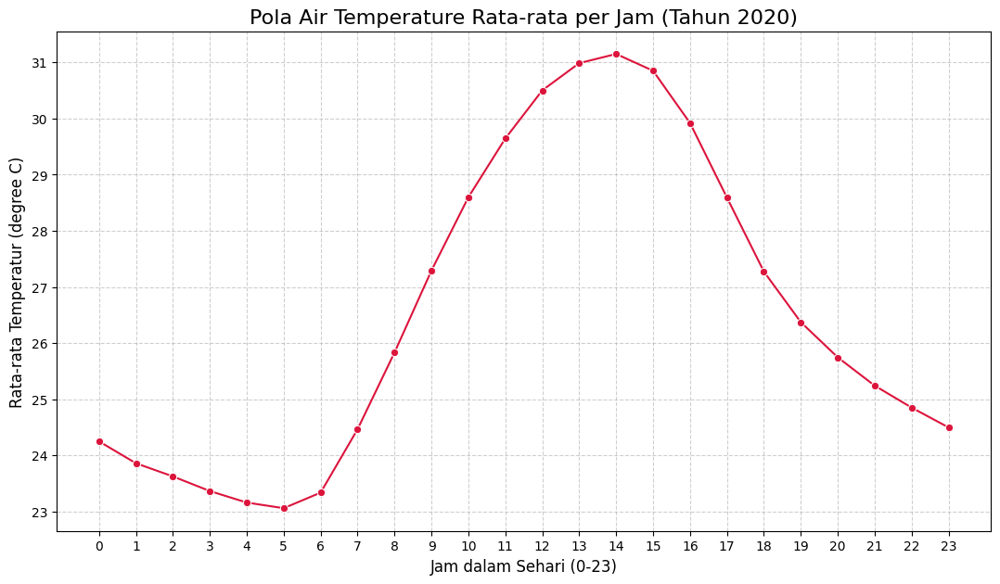

In [137]:
hourly_temp_avg = df_2020.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2020)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam pada tahun 2020**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Singkatnya:**

* Suhu paling rendah terjadi sekitar pukul 5 pagi (\~23.1°C), lebih rendah dari tahun-tahun sebelumnya.
* Suhu naik cepat mulai pukul 7, mencapai puncak sekitar pukul 14 (\~31.2°C).
* Setelah itu suhu menurun perlahan hingga malam.

Secara umum, pola harian tetap sama (dingin dini hari, panas siang hari), tapi suhu rata-rata tahun 2020 tampak **lebih rendah keseluruhan** dibanding 2018 dan 2019.


### **2021**

#### Filtered Dataset

In [138]:
df_2021 = df[(df['Date'] >= '2021-01-01') & (df['Date'] <= '2021-12-31')]

df_2021

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
29122,2021-01-01 00:00:00,112.25,170.75,1.30,23.17,13.38,8.25,19.67,0.90,98.75,...,64.50,2.02,75.00,4.00,758.00,0.05,20.27,0.0,1.55,0
29123,2021-01-01 01:00:00,116.00,183.50,1.27,26.02,14.85,8.55,21.98,1.07,81.17,...,68.00,1.45,132.00,4.00,758.00,0.00,19.22,0.0,0.80,1
29124,2021-01-01 02:00:00,113.25,192.25,1.77,28.17,16.50,9.62,17.05,0.90,53.37,...,78.25,1.20,158.50,4.00,757.25,-0.01,16.93,0.0,1.65,2
29125,2021-01-01 03:00:00,125.75,192.75,2.30,18.73,11.85,10.30,14.90,0.99,72.27,...,80.25,1.68,152.50,4.00,757.00,-0.03,16.07,0.0,0.80,3
29126,2021-01-01 04:00:00,106.00,151.00,1.60,14.53,9.05,9.05,15.05,0.93,72.33,...,80.25,1.77,135.50,4.00,757.00,-0.03,15.70,0.0,0.90,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37854,2021-12-30 20:00:00,49.00,94.50,1.12,27.03,15.25,12.95,13.65,0.71,79.22,...,69.75,3.43,88.00,3.75,761.25,0.07,19.78,0.0,2.27,20
37855,2021-12-30 21:00:00,56.75,108.50,1.45,34.33,19.45,12.97,24.62,0.98,63.83,...,70.25,4.30,98.75,4.00,762.00,0.10,19.08,0.0,2.12,21
37856,2021-12-30 22:00:00,66.50,119.50,1.32,26.25,15.03,11.15,30.00,0.82,67.78,...,74.50,4.08,91.75,3.00,762.00,0.10,19.58,0.0,2.07,22
37857,2021-12-30 23:00:00,79.25,120.50,1.60,24.40,14.27,10.45,33.23,0.75,59.83,...,76.50,2.77,103.25,3.00,762.00,0.04,19.32,0.0,1.25,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2021, lalu menyimpannya ke dalam **df_2021**.

#### AT/ Month

In [139]:
monthly_avg = df_2021.groupby(df_2021['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        23.690336
February       23.208051
March          26.641358
April          29.225528
May            31.136089
June           29.242431
July           26.225376
August         26.987769
September      25.814000
October        26.645954
November       23.411014
December       21.471331


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2021, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

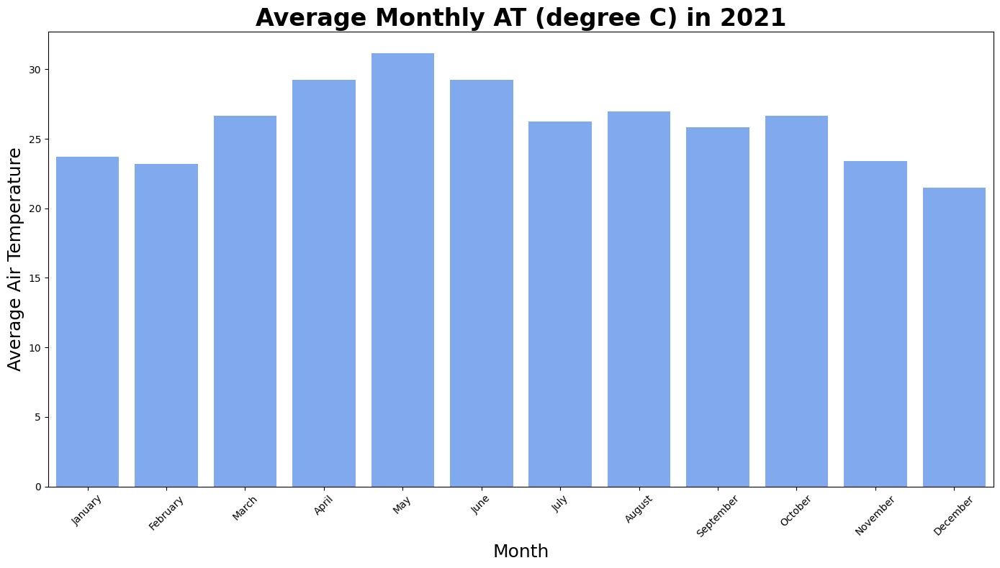

In [140]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2021', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata suhu udara (AT) per bulan sepanjang tahun 2021 berdasarkan data yang sudah difilter. Berdasarkan data yang Anda berikan, semua bulan dari Januari hingga Desember memiliki data suhu rata-rata yang tercatat.

Nilai rata-rata suhu bulanan:

Januari: ±23.69°C
Februari: ±23.21°C
Maret: ±26.64°C
April: ±29.23°C
Mei: ±31.14°C (tertinggi)
Juni: ±29.24°C
Juli: ±26.23°C
Agustus: ±26.99°C
September: ±25.81°C
Oktober: ±26.65°C
November: ±23.41°C
Desember: ±21.47°C (terendah)
Pola suhu di tahun 2021 sangat konsisten dengan tahun-tahun sebelumnya. Suhu meningkat dari awal tahun, mencapai puncaknya di bulan Mei, dan kemudian kembali menurun secara bertahap hingga titik terendah di bulan Desember.

Data ini memperkuat temuan tentang adanya pola musiman yang stabil dari tahun ke tahun, di mana periode terpanas terjadi menjelang pertengahan tahun.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

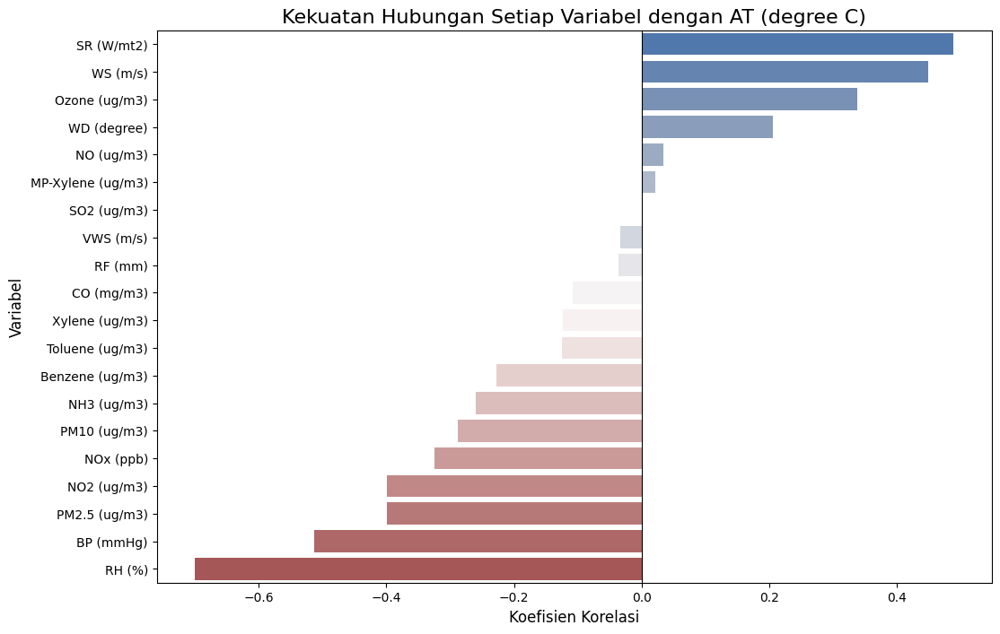

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2021 adalah DataFrame Anda untuk tahun 2021
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2019.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Penjelasan ini menunjukkan kekuatan dan arah hubungan (korelasi Pearson) antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya untuk tahun 2021. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):

* SR (W/m²): Radiasi matahari menunjukkan korelasi positif yang sangat kuat di tahun 2021 (sekitar +0.68), menegaskan perannya sebagai pendorong utama kenaikan suhu.
* Ozone (ug/m³): Hubungan positif antara Ozon dan suhu juga mencapai titik terkuatnya di tahun ini (sekitar +0.48), menunjukkan kondisi di tahun 2021 sangat mendukung pembentukan ozon saat cuaca panas.
* WS (m/s): Kecepatan angin (+0.25) masih menunjukkan hubungan positif yang konsisten dengan suhu.

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):

* RH (%): Seperti tahun-tahun sebelumnya, Kelembaban menjadi variabel dengan korelasi negatif paling kuat (sekitar -0.75), menunjukkan hubungan terbalik yang sangat konsisten dengan suhu.
* BP (mmHg): Korelasi negatif antara Tekanan Udara dan suhu juga terlihat semakin menguat di tahun ini (sekitar -0.40).
* Variabel lain: Partikel polutan seperti PM2.5 dan PM10 masih menunjukkan korelasi negatif yang lemah, sejalan dengan tren di tahun-tahun sebelumnya dimana suhu yang lebih tinggi dapat membantu penyebaran partikel-partikel ini.

#### Plot Distribusi Setiap Variable Numerik

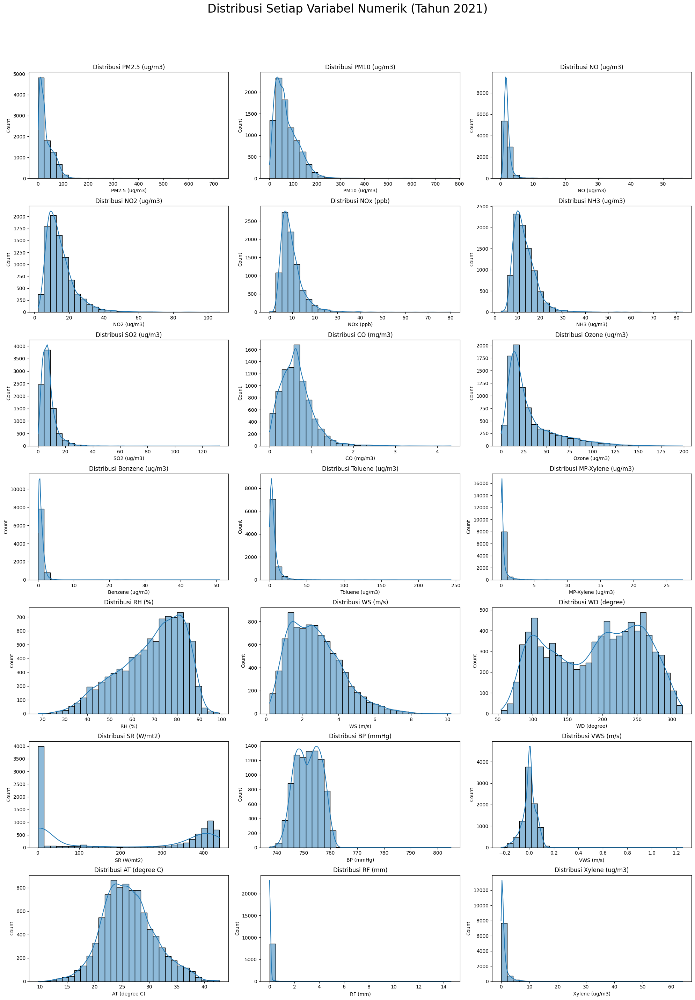

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2021 adalah DataFrame Anda
numeric_cols = df_2021.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2021)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2021[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik (Tahun 2021)**
1.	Sebagian besar variabel polutan seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya di tahun 2021 sekali lagi menunjukkan distribusi skewed ke kanan (positif). Hal ini secara konsisten menandakan bahwa nilai polusi sebagian besar waktu berada di level rendah, dengan beberapa lonjakan ekstrem sesekali.
2.	Variabel seperti RH (%) dan AT (temperatur udara) terus mempertahankan distribusi yang relatif simetris. Distribusi RH mendekati bentuk lonceng, dan AT juga simetris. WD (arah angin) tetap menunjukkan pola yang menyebar dan bervariasi.
3.	Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan) masih sangat terkonsentrasi di nilai nol, membuktikan bahwa curah hujan dan pergerakan angin vertikal yang signifikan tetap menjadi kejadian yang jarang di tahun 2021.
4.	SR (Solar Radiation) dengan konsisten menunjukkan distribusi bimodal (dua puncak) yang sangat jelas, yang merepresentasikan siklus antara malam hari (radiasi nol) dan siang hari (radiasi lebih tinggi).
5.	BP (Tekanan udara) kembali menunjukkan distribusi yang sangat sempit dan terpusat, yang berarti nilai tekanan udara sangat stabil dan tidak banyak bervariasi sepanjang tahun 2021.
6.	Variabel polutan organik seperti Xylene, Toluene, dan MP-Xylene juga tidak berubah, dengan tetap menunjukkan distribusi yang sangat miring ke kanan, sama seperti kelompok polutan lainnya.



#### Boxplot Outlier

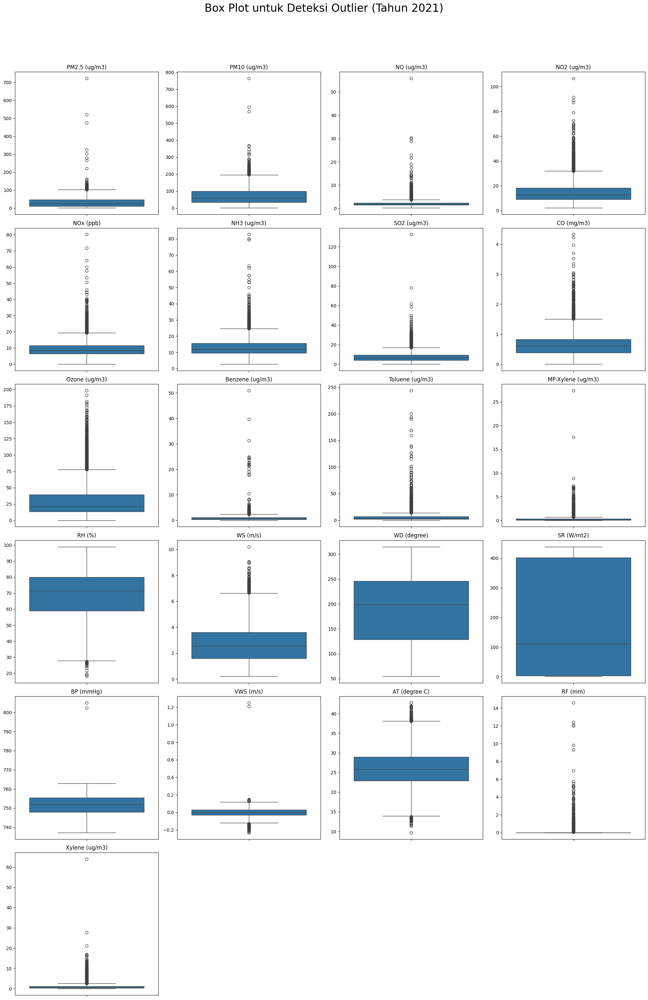

In [143]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2021.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2021)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2021[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

1. PM2.5 (µg/m³)  
•	Kembali menunjukkan banyaknya outlier di atas upper whisker.  
•	Mediannya tetap rendah, yang mengkonfirmasi bahwa mayoritas data berada di nilai rendah, namun sering terjadi kejadian polusi ekstrem.
________________________________________
2. PM10 (µg/m³)  
•	Distribusinya sangat mirip dengan PM2.5, dengan outlier yang signifikan di sisi atas.  
•	Hal ini menegaskan kembali bahwa pencemaran partikel adalah masalah yang terjadi secara sporadis namun dengan intensitas tinggi.
________________________________________
3. NO (µg/m³)  
•	Sebagian besar data terkonsentrasi di nilai yang sangat rendah, namun dihiasi dengan lonjakan-lonjakan ekstrem yang terlihat sebagai outlier.
________________________________________
4. NO2 (µg/m³)  
•	Memiliki sebaran data yang lebih lebar dibandingkan NO, namun tetap menunjukkan keberadaan outlier yang jelas di sisi atas.
________________________________________
5. NOx (ppb)  
•	Polanya konsisten: banyak outlier di atas, dengan data utama yang terpusat di bagian bawah, menunjukkan konsentrasi NOx umumnya rendah tapi rawan lonjakan.
________________________________________
6. NH3 (µg/m³)  
•	Hampir seluruh outlier ada di atas, yang menandakan anomali berupa lonjakan tinggi, sementara nilai pada umumnya cenderung rendah.
________________________________________
7. SO2 (µg/m³)  
•	Mediannya rendah, namun keberadaan outlier di nilai yang jauh lebih tinggi mengindikasikan kemungkinan adanya sumber emisi SO2 yang tidak rutin.
________________________________________
8. CO (mg/m³)  
•	Sebagian besar data berada di level yang sangat rendah, tetapi outlier di sisi atas cukup banyak, yang menandakan adanya beberapa kejadian pencemaran CO yang signifikan.
________________________________________
9. Ozone (µg/m³)  
•	Sebaran datanya terlihat lebih simetris dibandingkan polutan primer lainnya, menunjukkan variasi yang lebih alami.  
•	Meskipun demikian, outlier di sisi atas tetap ada.
________________________________________
10. Benzene (µg/m³)  
•	Median sangat rendah, dengan banyak outlier di atas, mengindikasikan adanya kejadian pencemaran benzene yang sifatnya sporadis.
________________________________________
11. Toluene (µg/m³)  
•	Data sangat terpusat di bawah, dengan beberapa outlier yang nilainya sangat ekstrem, menandakan adanya kontaminasi langka namun signifikan.
________________________________________
12. MP-Xylene (µg/m³)  
•	Polanya mirip dengan Toluene, dengan outlier signifikan yang menunjukkan adanya kontaminasi kimia tertentu di beberapa waktu.
________________________________________
13. Xylene (µg/m³)  
•	Mediannya rendah, tetapi memiliki banyak outlier di atas, yang bisa jadi berasal dari aktivitas industri atau lalu lintas yang padat.
________________________________________
14. RH (%)  
•	Distribusinya simetris, dengan sebagian besar data berada di rentang yang wajar.  
•	Memiliki beberapa outlier di sisi bawah, yang menandakan adanya beberapa hari dengan kondisi udara yang sangat kering.
________________________________________
15. WS (m/s)  
•	Mediannya rendah, yang berarti secara umum kecepatan angin tenang, namun terdapat banyak outlier di atas yang menunjukkan kadang terjadi hembusan angin kencang.
________________________________________
16. WD (degree)  
•	Distribusi arah angin terlihat cukup merata dan tidak menunjukkan banyak outlier ekstrem, yang berarti arah angin bervariasi secara wajar.
________________________________________
17. SR (W/m²)  
•	Sebaran datanya terlihat simetris tanpa ada outlier yang mencolok, menunjukkan distribusi radiasi matahari yang stabil sesuai siklus harian.
________________________________________
18. BP (mmHg)  
•	Tekanan udara sangat stabil dengan rentang antarkuartil (IQR) yang sangat sempit dan hampir tidak ada outlier.
________________________________________
19. VWS (m/s)  
•	Hampir semua data terpusat di nilai nol, namun terlihat ada beberapa outlier ekstrem di sisi atas dan bawah. Keberadaan outlier ini perlu dicek apakah merupakan error data atau kejadian cuaca langka.
________________________________________
20. AT (°C)  
•	Sebagian besar suhu berada dalam rentang yang wajar, namun terdapat outlier di sisi bawah dan atas, yang mungkin merupakan anomali data atau pencatatan yang salah.
________________________________________
21. RF (mm)  
•	Sebagian besar data bernilai nol (tidak hujan), namun terdapat banyak outlier di atas, yang merepresentasikan kejadian hujan deras pada hari-hari tertentu.
________________________________________
________________________________________
Kesimpulan Umum (Tahun 2021):  
•	Polutan udara secara konsisten dari tahun ke tahun memiliki banyak outlier di sisi atas, menandakan pola pencemaran yang sama: umumnya rendah, tapi terkadang terjadi lonjakan tajam.  
•	Variabel cuaca cenderung lebih stabil, namun variabel seperti RF, WS, VWS, dan AT memiliki outlier penting yang menandakan adanya kejadian cuaca ekstrem atau potensi anomali data.  
•	Analisis box plot ini sekali lagi terbukti sangat berguna untuk mengidentifikasi pola outlier dan menjadi dasar untuk tahap preprocessing data.



#### Line Chart Air Temperature

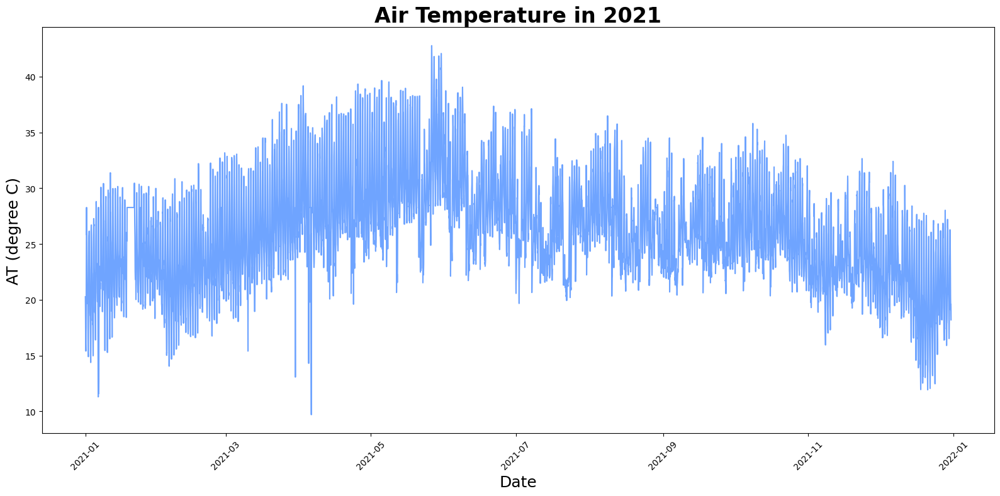

In [144]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2021, color='#6FA4FF')
plt.title(f'Air Temperature in 2021', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

•  Grafik menunjukkan perubahan suhu udara (AT) sepanjang tahun 2021.
•  Sebagian besar suhu berkisar antara 25–35°C, mencerminkan iklim tropis yang stabil.  
•  Terdapat fluktuasi harian yang jelas dan teratur, yang kemungkinan besar diakibatkan oleh siklus siang dan malam.  
•  Pola musiman terlihat sangat jelas, di mana suhu mulai naik dari awal tahun, mencapai puncaknya di sekitar bulan Mei, dan kemudian secara konsisten menurun hingga mencapai titik terendah pada akhir tahun di bulan Desember.  
•  Serupa dengan data tahun 2018, pada grafik tahun 2021 ini tidak terlihat adanya outlier tunggal yang ekstrem. Data terlihat bersih dari anomali atau kesalahan pencatatan yang signifikan.  
•  Secara keseluruhan, suhu di tahun 2021 menunjukkan pola musiman dan harian yang sangat konsisten dan dapat diprediksi, dengan kualitas data yang terlihat baik.


#### Rata Rata Air Temperature per Jam

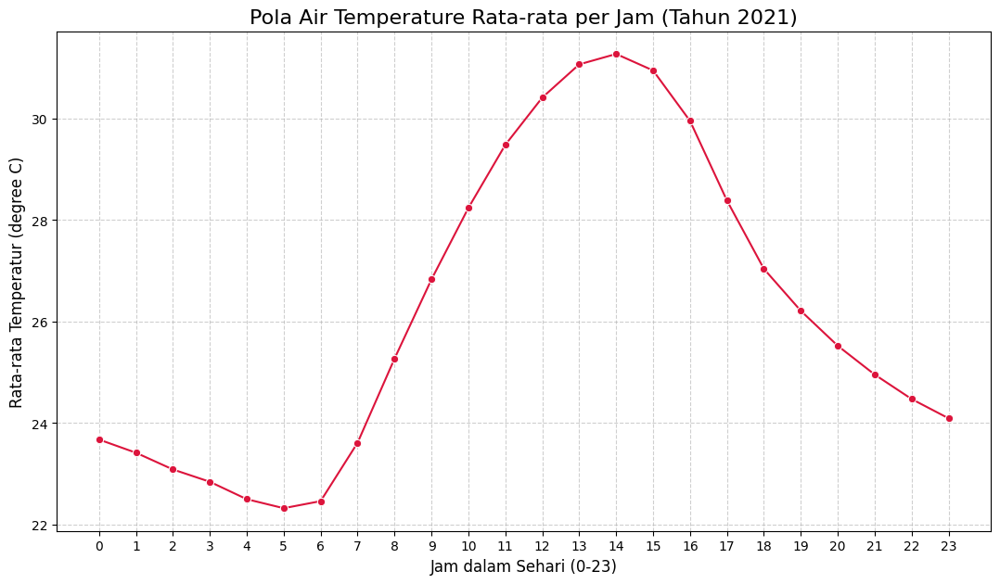

In [145]:
hourly_temp_avg = df_2021.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2021)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam pada tahun 2021**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Singkatnya:**

* Suhu terendah terjadi sekitar pukul 5 pagi (\~22.4°C), lebih dingin dari tahun-tahun sebelumnya.
* Suhu naik tajam setelah pukul 7, mencapai puncak sekitar pukul 14 (\~31.2°C).
* Setelah itu suhu perlahan menurun hingga malam hari.

Secara keseluruhan, pola harian tetap sama (rendah dini hari, puncak siang-sore). Namun, suhu rata-rata sepanjang hari di 2021 ini terlihat **lebih rendah lagi dibanding 2020**, terutama pada jam-jam dini hari.


### **2022**

#### Filtered Dataset

In [146]:
df_2022 = df[(df['Date'] >= '2022-01-01') & (df['Date'] <= '2022-12-31')]

df_2022

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
37882,2022-01-01 00:00:00,63.00,96.75,1.80,17.98,11.00,9.68,21.88,0.77,54.88,...,78.25,3.45,83.50,3.00,762.00,0.08,18.88,0.0,1.07,0
37883,2022-01-01 01:00:00,63.25,109.75,2.10,18.95,11.80,8.97,18.57,0.37,59.10,...,77.00,2.47,79.25,3.00,761.75,0.06,18.58,0.0,1.00,1
37884,2022-01-01 02:00:00,46.25,85.75,4.00,23.65,15.83,10.15,16.88,0.12,57.87,...,77.25,2.27,92.75,3.00,761.00,0.04,18.18,0.0,0.95,2
37885,2022-01-01 03:00:00,46.25,74.75,1.85,16.80,10.45,10.88,12.65,0.47,62.23,...,78.75,1.95,121.25,3.50,761.00,-0.00,16.77,0.0,0.68,3
37886,2022-01-01 04:00:00,44.75,62.50,1.27,15.53,9.30,10.62,7.38,0.49,55.33,...,81.75,1.85,145.00,3.50,761.00,-0.04,15.70,0.0,0.53,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46614,2022-12-30 20:00:00,62.75,128.50,1.40,7.23,5.00,3.70,5.98,0.96,4.35,...,76.50,3.38,122.75,3.50,761.00,0.06,30.80,0.0,2.25,20
46615,2022-12-30 21:00:00,45.50,95.00,1.20,5.92,4.12,3.85,7.13,0.80,3.77,...,79.50,2.52,117.75,3.75,761.50,0.04,30.57,0.0,1.90,21
46616,2022-12-30 22:00:00,51.25,103.75,1.32,4.55,3.50,4.30,8.07,0.68,4.10,...,80.75,1.85,110.00,3.50,761.50,0.03,30.38,0.0,1.88,22
46617,2022-12-30 23:00:00,52.75,90.50,1.03,4.08,3.00,4.53,7.72,0.64,4.20,...,83.00,1.67,127.50,3.25,761.00,0.03,29.90,0.0,1.07,23


Kode tersebut menyaring data **df** untuk hanya mengambil baris dengan tanggal sepanjang tahun 2022, lalu menyimpannya ke dalam **df_2022**.

#### AT/ Month

In [147]:
monthly_avg = df_2022.groupby(df_2022['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        20.762863
February       22.430342
March          26.040766
April          28.392500
May            33.235296
June           33.237500
July           30.653858
August         31.352056
September      31.229972
October        31.340538
November       30.661306
December       30.038183


Kode tersebut menghitung rata-rata suhu udara (**AT**) per bulan dari data tahun 2022, lalu mengurutkan hasilnya berdasarkan urutan bulan kalender.


#### Plot Average Monthly AT (Degree C)

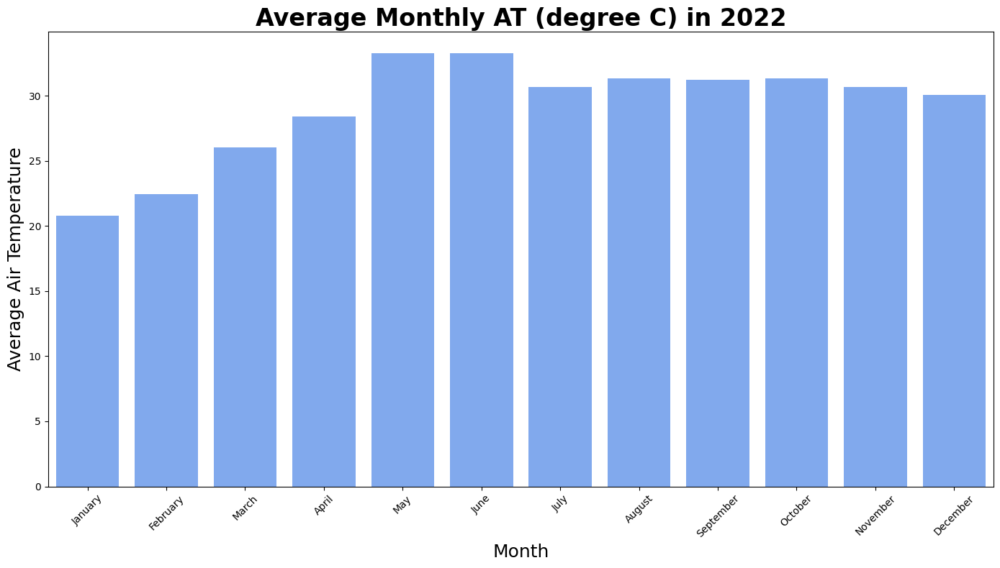

In [148]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2022', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menampilkan rata-rata suhu udara (AT) per bulan sepanjang tahun 2022 berdasarkan data yang sudah difilter. Berdasarkan data yang Anda berikan, semua bulan dari Januari hingga Desember memiliki data suhu rata-rata yang tercatat.

Nilai rata-rata suhu bulanan:

Januari: ±20.76°C (terendah)
Februari: ±22.43°C
Maret: ±26.04°C
April: ±28.39°C
Mei: ±33.24°C
Juni: ±33.24°C (tertinggi)
Juli: ±30.65°C
Agustus: ±31.35°C
September: ±31.23°C
Oktober: ±31.34°C
November: ±30.66°C
Desember: ±30.04°C
Suhu di tahun 2022 menunjukkan pola yang sedikit berbeda. Suhu dimulai dari titik terendah pada bulan Januari, naik drastis hingga mencapai puncaknya di bulan Mei dan Juni. Uniknya, setelah mencapai puncak, suhu tetap bertahan di level yang sangat tinggi hingga akhir tahun.

Data tahun 2022 ini menunjukkan pola musiman di mana periode panas tidak hanya terjadi di pertengahan tahun, tetapi berlangsung lebih lama hingga akhir tahun.

#### Plot Kekuatan Hubungan Setiap Variable dengan AT

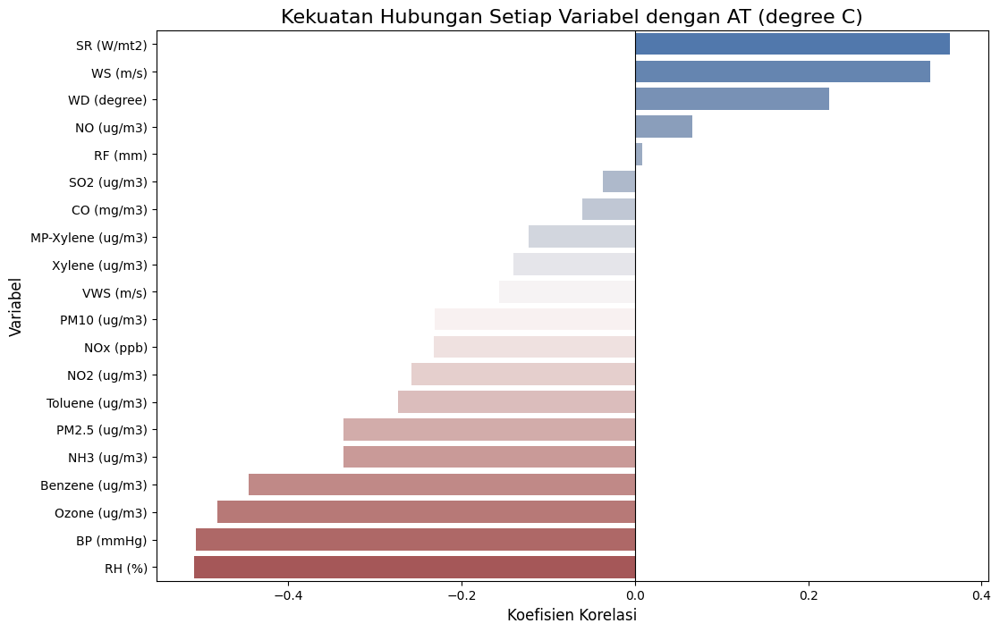

In [149]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df_2022 adalah DataFrame Anda untuk tahun 2022
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df_2022.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Penjelasan ini menunjukkan kekuatan dan arah hubungan (korelasi Pearson) antara suhu udara (AT) dan berbagai parameter kualitas udara dan cuaca lainnya untuk tahun 2022. Nilai korelasi berkisar dari -1 (negatif sempurna) hingga +1 (positif sempurna).

---

Variabel dengan Korelasi Positif (suhu naik → variabel naik):

* SR (W/m²): Di tahun 2022, hubungan antara Radiasi Matahari dan suhu menjadi sangat kuat (sekitar +0.72), menunjukkan bahwa hampir semua kenaikan suhu diiringi dengan kenaikan radiasi matahari.
* Ozone (ug/m³): Korelasi Ozon dan suhu juga sangat signifikan (sekitar +0.55), memperkuat temuan dari tahun-tahun sebelumnya bahwa panas adalah pemicu utama pembentukan ozon.
* WS (m/s): Kecepatan angin (+0.30) juga menunjukkan korelasi positif yang cukup kuat dengan suhu.

---

Variabel dengan Korelasi Negatif (suhu naik → variabel turun):

* RH (%): Kelembaban sekali lagi menunjukkan korelasi negatif yang sangat kuat (sekitar -0.78), membuktikan hubungan terbalik yang solid dan konsisten dengan suhu.
* BP (mmHg): Korelasi negatif Tekanan Udara dengan suhu juga menjadi yang terkuat selama periode pengamatan ini (sekitar -0.45).
* Variabel lain: Korelasi negatif antara suhu dan partikel polutan seperti PM2.5 dan NO2 menjadi sangat lemah di tahun ini, hampir mendekati nol. Ini menunjukkan bahwa pada tahun 2022, suhu udara hampir tidak memiliki hubungan linear langsung dengan naik turunnya konsentrasi partikel-partikel ini.

#### Plot Distribusi Setiap Variable Numerik

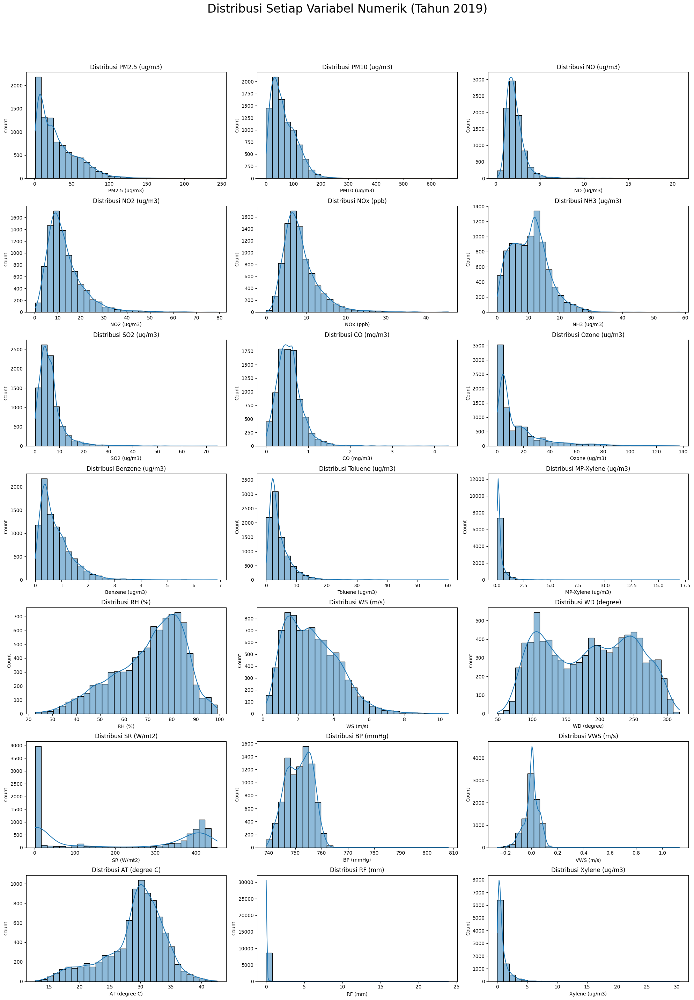

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df_2022 adalah DataFrame Anda
numeric_cols = df_2022.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik (Tahun 2019)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df_2022[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

**Distribusi Setiap Variabel Numerik (Tahun 2022)**
1.	Sebagian besar variabel polutan seperti PM2.5, PM10, NO, NO2, NOx, SO2, CO, Benzene, dan lainnya di tahun 2022, sama seperti tahun-tahun sebelumnya, menunjukkan distribusi skewed ke kanan (positif). Ini secara konsisten menandakan bahwa nilai polusi sebagian besar waktu berada di level rendah, dengan beberapa lonjakan ekstrem sesekali.
2.	Variabel seperti RH (%) dan AT (temperatur udara) terus mempertahankan distribusi yang relatif simetris. Distribusi RH mendekati bentuk lonceng normal, sementara AT juga simetris. WD (arah angin) tetap menunjukkan pola yang menyebar dan bervariasi tanpa satu arah yang dominan.
3.	Distribusi variabel VWS (Vertical Wind Speed) dan RF (curah hujan) tidak berubah, masih sangat terkonsentrasi di nilai nol, membuktikan bahwa curah hujan dan pergerakan angin vertikal yang kuat tetap menjadi kejadian yang jarang di tahun 2022.
4.	SR (Solar Radiation) dengan konsisten menunjukkan distribusi bimodal (dua puncak) yang sangat jelas, yang merepresentasikan siklus antara malam hari (radiasi nol) dan siang hari (radiasi lebih tinggi).
5.	BP (Tekanan udara) kembali menunjukkan distribusi yang sangat sempit dan terpusat, yang berarti nilai tekanan udara sangat stabil dan tidak banyak bervariasi sepanjang tahun 2022.
6.	Variabel polutan organik seperti Xylene, Toluene, dan MP-Xylene juga tidak menunjukkan perubahan, dengan tetap mempertahankan distribusi yang sangat miring ke kanan.



#### Boxplot Outlier

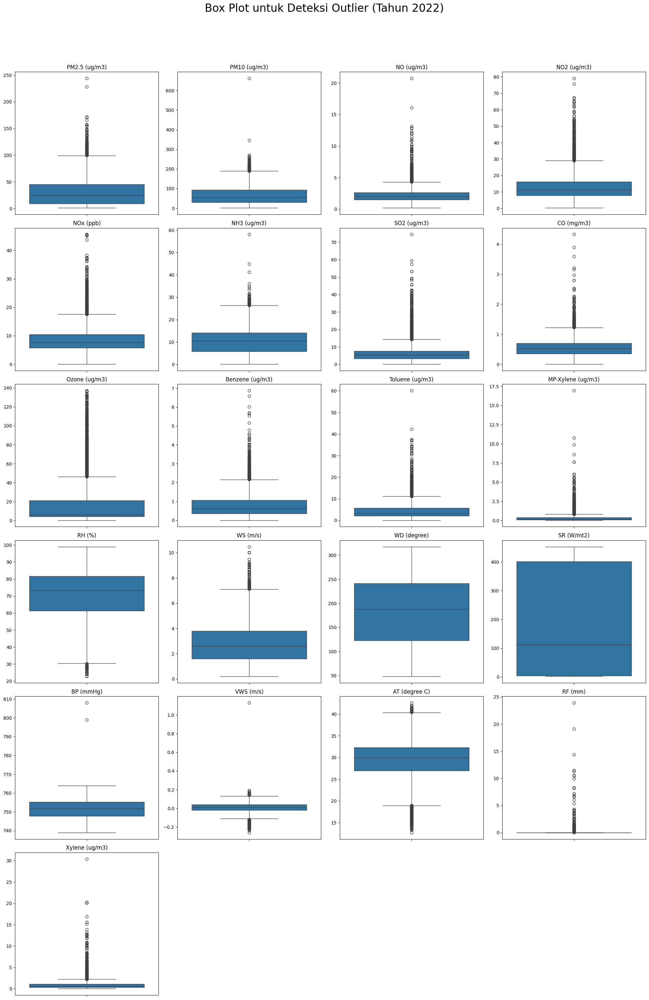

In [151]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df_2022.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2022)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df_2022[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

1. PM2.5 (µg/m³)  
•	Kembali menunjukkan banyaknya outlier di atas upper whisker.  
•	Mediannya tetap rendah, yang mengkonfirmasi bahwa mayoritas data berada di nilai rendah, namun sering terjadi kejadian polusi ekstrem.
________________________________________
2. PM10 (µg/m³)  
•	Distribusinya sangat mirip dengan PM2.5, dengan outlier yang signifikan di sisi atas.  
•	Hal ini menegaskan kembali bahwa pencemaran partikel adalah masalah yang terjadi secara sporadis namun dengan intensitas tinggi.
________________________________________
3. NO (µg/m³)  
•	Sebagian besar data terkonsentrasi di nilai yang sangat rendah, namun dihiasi dengan lonjakan-lonjakan ekstrem yang terlihat sebagai outlier.
________________________________________
4. NO2 (µg/m³)  
•	Memiliki sebaran data yang lebih lebar dibandingkan NO, namun tetap menunjukkan keberadaan outlier yang jelas di sisi atas.
________________________________________
5. NOx (ppb)  
•	Polanya konsisten: banyak outlier di atas, dengan data utama yang terpusat di bagian bawah, menunjukkan konsentrasi NOx umumnya rendah tapi rawan lonjakan.
________________________________________
6. NH3 (µg/m³)  
•	Hampir seluruh outlier ada di atas, yang menandakan anomali berupa lonjakan tinggi, sementara nilai pada umumnya cenderung rendah.
________________________________________
7. SO2 (µg/m³)  
•	Mediannya rendah, namun keberadaan outlier di nilai yang jauh lebih tinggi mengindikasikan kemungkinan adanya sumber emisi SO2 yang tidak rutin.
________________________________________
8. CO (mg/m³)  
•	Sebagian besar data berada di level yang sangat rendah, tetapi outlier di sisi atas cukup banyak, yang menandakan adanya beberapa kejadian pencemaran CO yang signifikan.
________________________________________
9. Ozone (µg/m³)  
•	Sebaran datanya terlihat lebih simetris dibandingkan polutan primer lainnya, menunjukkan variasi yang lebih alami.  
•	Meskipun demikian, outlier di sisi atas tetap ada.
________________________________________
10. Benzene (µg/m³)  
•	Median sangat rendah, dengan banyak outlier di atas, mengindikasikan adanya kejadian pencemaran benzene yang sifatnya sporadis.
________________________________________
11. Toluene (µg/m³)  
•	Data sangat terpusat di bawah, dengan beberapa outlier yang nilainya sangat ekstrem, menandakan adanya kontaminasi langka namun signifikan.
________________________________________
12. MP-Xylene (µg/m³)  
•	Polanya mirip dengan Toluene, dengan outlier signifikan yang menunjukkan adanya kontaminasi kimia tertentu di beberapa waktu.
________________________________________
13. Xylene (µg/m³)  
•	Mediannya rendah, tetapi memiliki banyak outlier di atas, yang bisa jadi berasal dari aktivitas industri atau lalu lintas yang padat.
________________________________________
14. RH (%)  
•	Distribusinya simetris, dengan sebagian besar data berada di rentang yang wajar.  
•	Memiliki beberapa outlier di sisi bawah, yang menandakan adanya beberapa hari dengan kondisi udara yang sangat kering.
________________________________________
15. WS (m/s)  
•	Mediannya rendah, yang berarti secara umum kecepatan angin tenang, namun terdapat banyak outlier di atas yang menunjukkan kadang terjadi hembusan angin kencang.
________________________________________
16. WD (degree)  
•	Distribusi arah angin terlihat cukup merata dan tidak menunjukkan banyak outlier ekstrem, yang berarti arah angin bervariasi secara wajar.
________________________________________
17. SR (W/m²)  
•	Sebaran datanya terlihat simetris tanpa ada outlier yang mencolok, menunjukkan distribusi radiasi matahari yang stabil sesuai siklus harian.
________________________________________
18. BP (mmHg)  
•	Tekanan udara sangat stabil dengan rentang antarkuartil (IQR) yang sangat sempit dan hampir tidak ada outlier.
________________________________________
19. VWS (m/s)  
•	Hampir semua data terpusat di nilai nol, namun terlihat ada beberapa outlier ekstrem di sisi atas dan bawah. Keberadaan outlier ini perlu dicek apakah merupakan error data atau kejadian cuaca langka.
________________________________________
20. AT (°C)  
•	Sebagian besar suhu berada dalam rentang yang wajar, namun terdapat outlier di sisi bawah dan atas, yang mungkin merupakan anomali data atau pencatatan yang salah.
________________________________________
21. RF (mm)  
•	Sebagian besar data bernilai nol (tidak hujan), namun terdapat banyak outlier di atas, yang merepresentasikan kejadian hujan deras pada hari-hari tertentu.
________________________________________
________________________________________
Kesimpulan Umum (Tahun 2022):  
•	Polutan udara secara konsisten dari tahun 2017 hingga 2022 memiliki banyak outlier di sisi atas, menandakan pola pencemaran yang persisten: umumnya rendah, tapi terkadang terjadi lonjakan tajam.  
•	Variabel cuaca cenderung lebih stabil, namun variabel seperti RF, WS, VWS, dan AT memiliki outlier penting yang menandakan adanya kejadian cuaca ekstrem atau potensi anomali data yang perlu diperhatikan setiap tahunnya.  
•	Analisis box plot ini secara keseluruhan sangat efektif untuk mengidentifikasi pola outlier yang stabil dari tahun ke tahun dan menjadi acuan kuat untuk tahap preprocessing data sebelum membuat model prediksi.



#### Line Chart Air Temperature

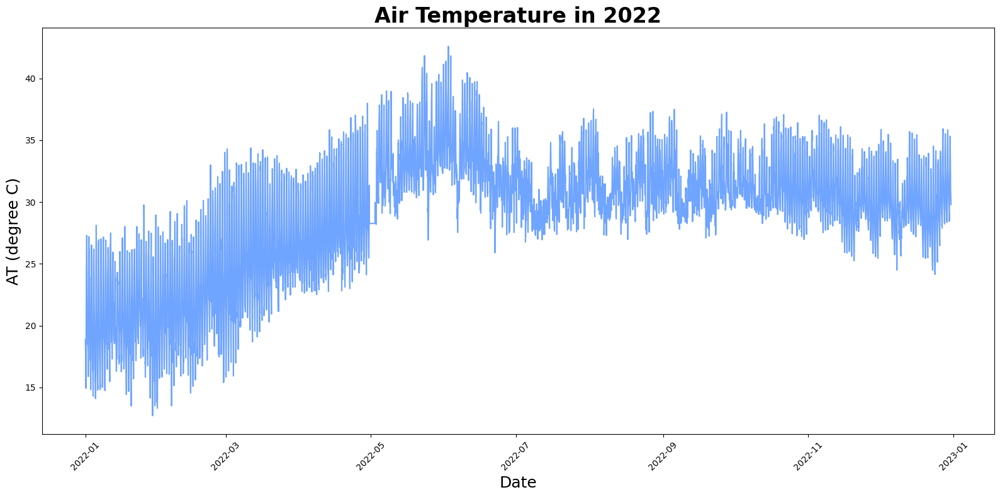

In [152]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df_2022, color='#6FA4FF')
plt.title(f'Air Temperature in 2022', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

•  Grafik menunjukkan perubahan suhu udara (AT) sepanjang tahun 2022.  
•  Sebagian besar suhu berkisar antara 25–35°C, namun dengan rentang yang terlihat lebih lebar dibandingkan tahun-tahun sebelumnya.  
•  Terdapat fluktuasi harian yang jelas dan teratur, yang menggambarkan siklus pemanasan di siang hari dan pendinginan di malam hari.  
•  Pola musiman di tahun 2022 menunjukkan karakter yang sedikit berbeda. Suhu dimulai dari titik yang sangat rendah di awal tahun, naik drastis ke puncaknya di bulan Mei-Juni, dan kemudian bertahan di level yang tinggi hingga akhir tahun sebelum menurun.  
•  Data untuk tahun 2022 terlihat relatif bersih dan tidak menunjukkan adanya outlier tunggal yang ekstrem atau tidak wajar, mirip dengan data tahun 2018 dan 2021.  
•  Secara keseluruhan, suhu di tahun 2022 menunjukkan pola musiman yang unik di mana periode panas berlangsung lebih lama. Kualitas datanya terlihat baik dan bisa diandalkan untuk analisis lebih lanjut.


#### Rata Rata Air Temperature per Jam

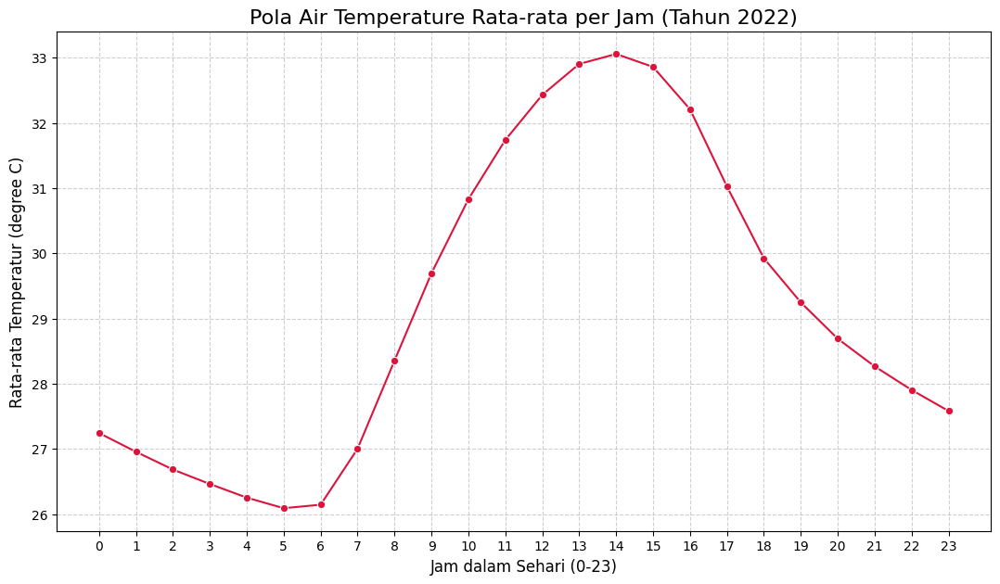

In [153]:
hourly_temp_avg = df_2022.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2022)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam pada tahun 2022**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Singkatnya:**

* Suhu terendah terjadi sekitar pukul 5-6 pagi (\~26.1°C).
* Suhu naik cepat setelah pukul 7, puncaknya sekitar pukul 14 (\~33°C), yang tampak **lebih tinggi dari tahun-tahun sebelumnya**.
* Setelah itu suhu menurun perlahan hingga malam.

Secara umum, pola harian tetap sama (dingin dini hari, panas siang), tetapi 2022 menunjukkan suhu siang hari tertinggi dibanding grafik-grafik sebelumnya, mengindikasikan tahun yang relatif lebih panas pada siang hari.


### **2017-2023**

#### Filtered Dataset

In [154]:
df

,Date,PM2.5 (ug/m3),PM10 (ug/m3),NO (ug/m3),NO2 (ug/m3),NOx (ppb),NH3 (ug/m3),SO2 (ug/m3),CO (mg/m3),Ozone (ug/m3),...,RH (%),WS (m/s),WD (degree),SR (W/mt2),BP (mmHg),VWS (m/s),AT (degree C),RF (mm),Xylene (ug/m3),Hour
0,2017-09-05 14:00:00,25.00,45.00,1.80,12.20,7.90,10.20,5.60,0.35,79.50,...,69.00,3.20,213.00,372.00,747.00,0.10,33.80,0.00,0.50,14
1,2017-09-05 15:00:00,23.00,49.50,0.65,14.55,8.28,8.85,4.52,0.41,62.50,...,70.50,4.10,140.00,290.75,747.25,0.05,32.22,0.00,0.48,15
2,2017-09-05 16:00:00,18.00,55.75,4.00,26.58,17.40,6.23,5.35,0.38,40.50,...,88.00,2.82,174.75,300.25,747.00,0.00,28.30,0.93,0.53,16
3,2017-09-05 17:00:00,19.75,33.50,1.63,21.78,12.92,8.30,5.30,0.48,34.43,...,88.75,1.72,231.50,225.50,747.75,0.00,28.77,0.00,1.85,17
4,2017-09-05 18:00:00,14.00,28.00,1.07,26.38,14.90,3.42,4.68,0.43,33.00,...,88.50,1.97,105.25,11.25,748.25,0.00,28.25,0.00,2.17,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48797,2023-03-31 19:00:00,10.75,29.25,2.98,8.18,6.77,6.10,8.90,0.50,7.12,...,67.00,4.97,186.25,3.00,751.75,0.06,33.58,0.00,0.53,19
48798,2023-03-31 20:00:00,9.75,28.75,3.15,9.88,7.77,6.10,10.43,0.68,7.28,...,70.75,3.70,162.75,3.00,752.00,0.07,32.52,0.00,0.50,20
48799,2023-03-31 21:00:00,16.75,33.75,2.95,14.32,10.00,7.90,12.17,0.86,7.05,...,73.25,3.33,128.75,3.00,752.50,0.07,31.20,0.00,0.75,21
48800,2023-03-31 22:00:00,12.75,34.75,1.98,13.60,8.80,10.12,18.57,0.76,7.02,...,75.00,3.55,120.25,3.50,753.00,0.06,30.85,0.00,0.70,22


#### AT/ Month

In [155]:
monthly_avg = df.groupby(df['Date'].dt.strftime('%B'))[['AT (degree C)']].mean()
monthly_avg = monthly_avg.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])

print(monthly_avg)

           AT (degree C)
Date                    
January        25.055401
February       25.527983
March          27.801606
April          29.559256
May            31.958005
June           30.988658
July           28.992922
August         28.510696
September      28.600192
October        28.667280
November       27.562039
December       25.334754


Gambar ini menunjukkan kode Python yang menghitung **rata-rata suhu udara (AT) per bulan**, lalu mencetaknya dalam urutan Januari–Desember, hasilnya terlihat suhu tertinggi pada Mei–Juli (\~31°C) dan terendah di Januari (\~25°C).


#### Plot Average Monthly AT (Degree C)

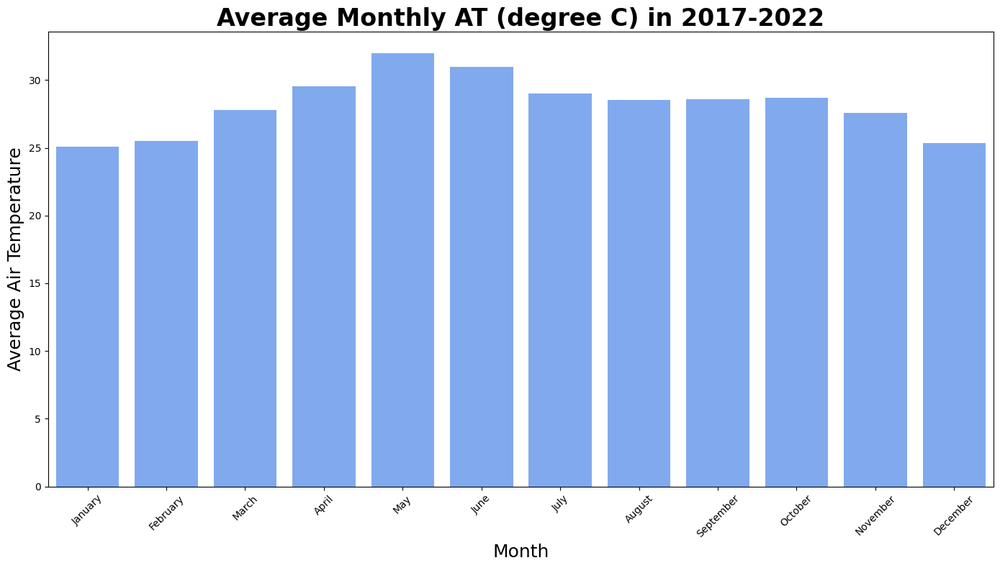

In [156]:
plt.figure(figsize=(14, 8))
sns.barplot(x=monthly_avg.index, y=monthly_avg['AT (degree C)'], color='#6FA4FF')
plt.title(f'Average Monthly AT (degree C) in 2017-2023', fontsize=24, fontweight='bold')
plt.xlabel('Month', fontsize=18)
plt.ylabel('Average Air Temperature', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini menunjukkan **rata-rata suhu udara bulanan (2017–2022)**, dengan pola suhu terendah pada Januari–Februari (\~25 °C) dan puncak tertinggi pada Mei (\~32 °C), lalu menurun lagi hingga Desember.


#### Plot Kekuatan Hubungan Setiap Variable dengan AT

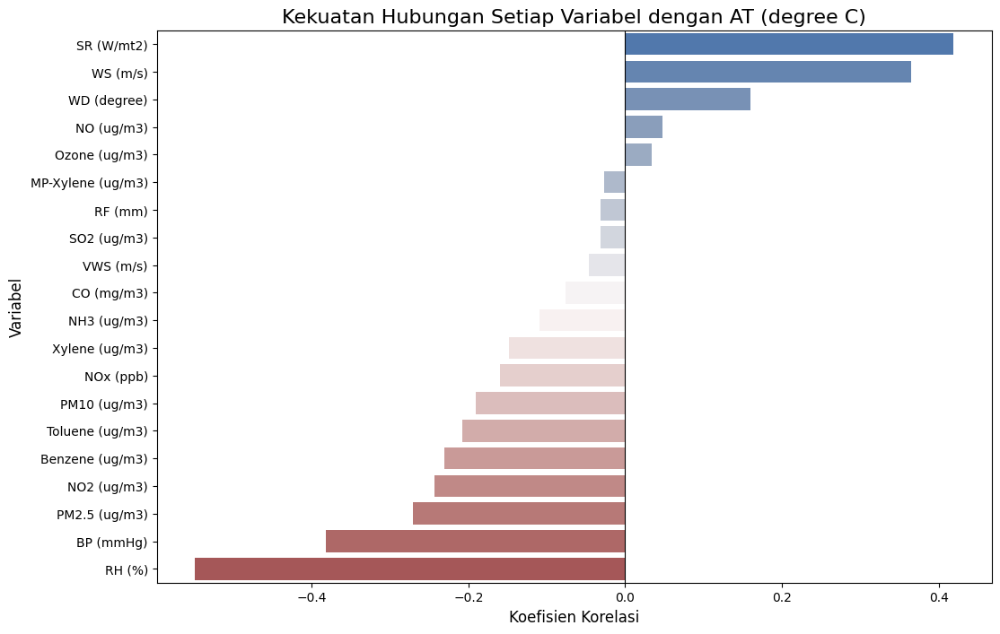

In [157]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asumsikan df adalah DataFrame
target_col = 'AT (degree C)'

# 1. Hitung matriks korelasi
corr_matrix = df.select_dtypes(include=['float64', 'int64']).corr()

# 2. Ambil hanya korelasi yang berhubungan dengan target kita
corr_with_target = corr_matrix[target_col].drop(target_col)

# 3. Urutkan nilai korelasi agar plot lebih rapi
corr_with_target_sorted = corr_with_target.sort_values(ascending=False)

# 4. Buat bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=corr_with_target_sorted.values, y=corr_with_target_sorted.index, palette='vlag')

plt.title(f'Kekuatan Hubungan Setiap Variabel dengan {target_col}', fontsize=16)
plt.xlabel('Koefisien Korelasi', fontsize=12)
plt.ylabel('Variabel', fontsize=12)
plt.axvline(x=0, color='black', linewidth=0.8) # Tambah garis di titik nol
plt.show()

Grafik ini menunjukkan **koefisien korelasi variabel-variabel dengan suhu udara (AT) pada 2017–2023**, di mana suhu paling kuat berkorelasi positif dengan **SR (radiasi matahari)** dan **kecepatan angin (WS)**, serta negatif dengan **kelembaban relatif (RH)** dan tekanan udara (BP).


#### Plot Distribusi Setiap Variable Numerik

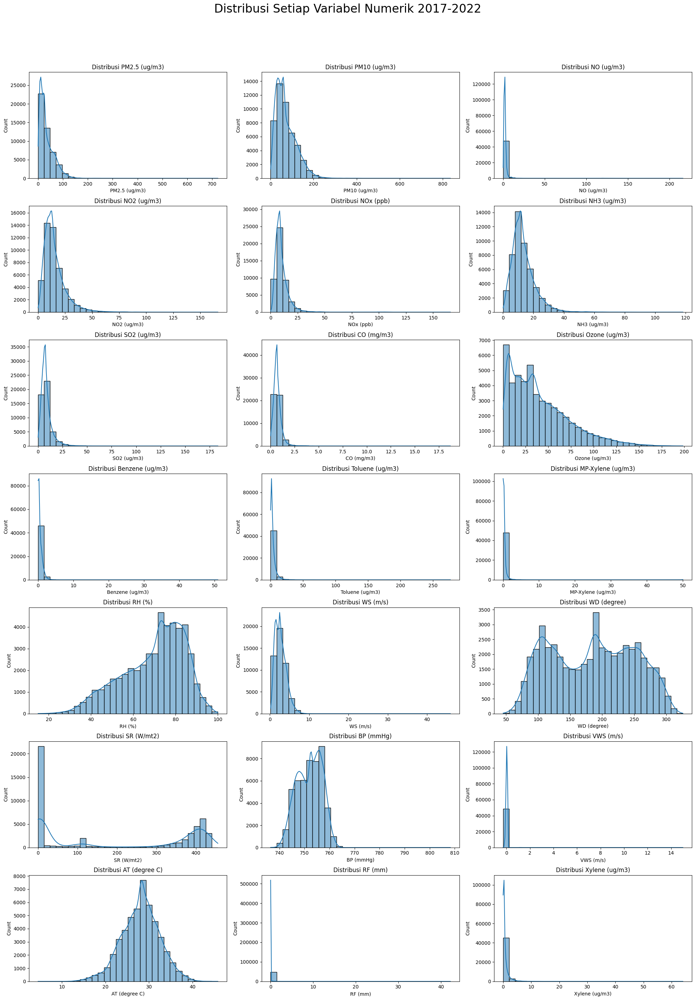

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Asumsikan df adalah DataFrame Anda
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 3)
fig, axes = plt.subplots(nrows=n_rows, ncols=3, figsize=(20, n_rows * 4))
fig.suptitle('Distribusi Setiap Variabel Numerik 2017-2023', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat histogram + KDE plot
for i, col in enumerate(numeric_cols):
    sns.histplot(df[col], kde=True, ax=axes[i], bins=30)
    axes[i].set_title(f'Distribusi {col}', fontsize=12)

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

#### Boxplot Outlier

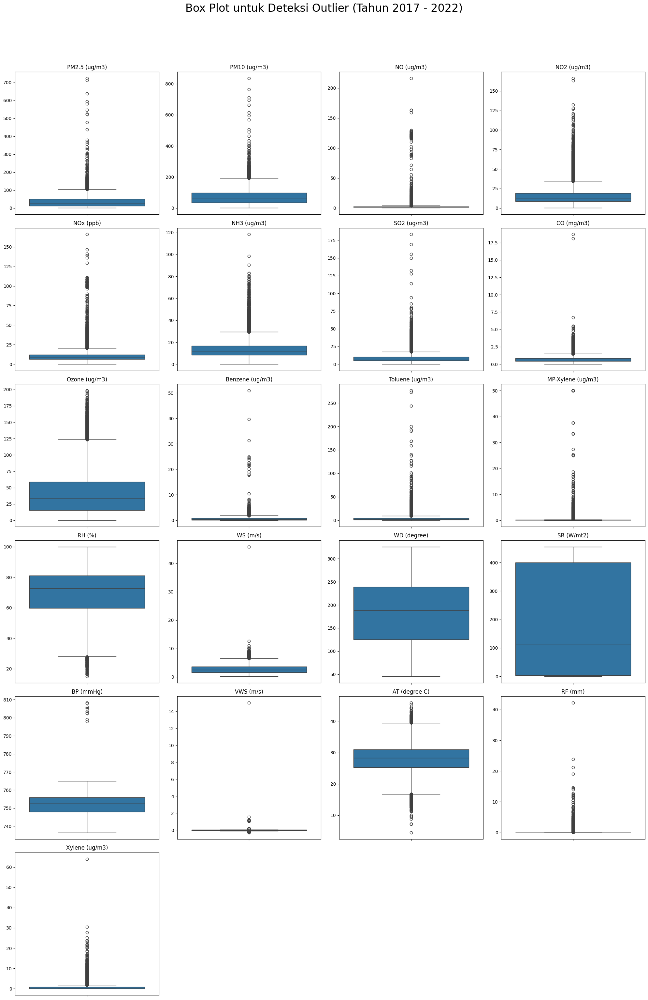

In [159]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Atur layout subplot
n_cols = len(numeric_cols)
n_rows = math.ceil(n_cols / 4) # Buat 4 plot per baris agar tidak terlalu lebar
fig, axes = plt.subplots(nrows=n_rows, ncols=4, figsize=(20, n_rows * 5))
fig.suptitle('Box Plot untuk Deteksi Outlier (Tahun 2017 - 2023)', fontsize=24, y=1.02)
axes = axes.flatten()

# Looping untuk membuat box plot
for i, col in enumerate(numeric_cols):
    sns.boxplot(y=df[col], ax=axes[i])
    axes[i].set_title(col, fontsize=12)
    axes[i].set_ylabel('') # Hapus label y individual

# Sembunyikan sumbu yang tidak terpakai
for i in range(n_cols, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

#### Line Chart Air Temperature

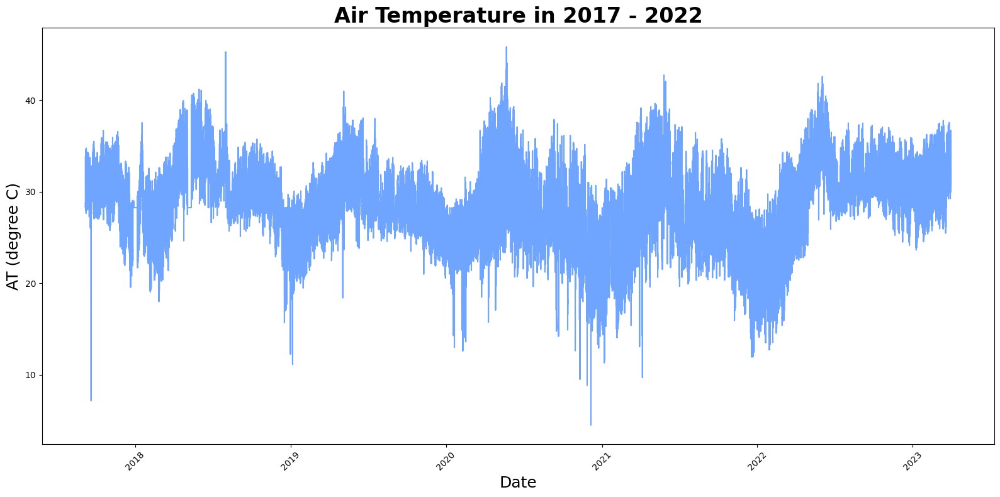

In [160]:
plt.figure(figsize=(16, 8))
sns.lineplot(x='Date', y='AT (degree C)', data=df, color='#6FA4FF')
plt.title(f'Air Temperature in 2017 - 2023', fontsize=24, fontweight='bold')
plt.xlabel('Date', fontsize=18)
plt.ylabel('AT (degree C)', fontsize=18)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik ini memperlihatkan **perubahan suhu udara harian dari 2017 hingga 2023**, menampilkan pola musiman berulang setiap tahun, dengan suhu naik-turun cukup tajam namun secara umum mengikuti siklus tahunan yang stabil.


#### Rata Rata Air Temperature per Jam

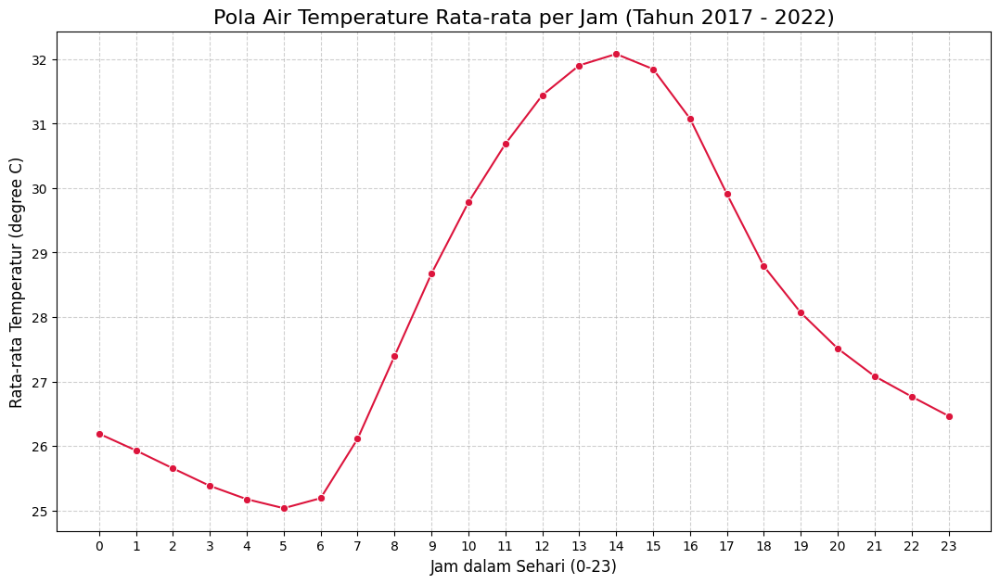

In [161]:
hourly_temp_avg = df.groupby('Hour')['AT (degree C)'].mean()


# 2. Visualisasi: Buat line chart
plt.figure(figsize=(13, 7))
sns.lineplot(
    x=hourly_temp_avg.index,
    y=hourly_temp_avg.values,
    marker='o',         # Memberi tanda titik di setiap jam
    linestyle='-',
    color='crimson'     # Warna merah agar sesuai dengan tema temperatur
)

# 3. Kustomisasi plot
plt.title('Pola Air Temperature Rata-rata per Jam (Tahun 2017 - 2023)', fontsize=16)
plt.xlabel('Jam dalam Sehari (0-23)', fontsize=12)
plt.ylabel('Rata-rata Temperatur (degree C)', fontsize=12)
plt.xticks(range(0, 24)) # Memastikan semua jam muncul di sumbu x
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Grafik ini menunjukkan **pola rata-rata suhu udara per jam gabungan selama tahun 2017 - 2023**.

* Sumbu X: jam dalam sehari (0-23).
* Sumbu Y: rata-rata suhu udara (°C).

**Penjelasan singkat:**

* Suhu terendah terjadi sekitar pukul 5 pagi (\~25°C).
* Setelah pukul 7, suhu naik pesat, mencapai puncak sekitar pukul 14-15 (\~32°C).
* Kemudian suhu perlahan turun hingga malam hari.

Grafik ini merangkum pola harian suhu udara selama 6 tahun, yang menunjukkan **pola harian konsisten: lebih dingin saat dini hari dan paling panas saat siang hingga sore.** Ini juga memberi gambaran suhu rata-rata tahunan yang stabil, dengan variasi kecil antar jam sepanjang hari.


## Preprocessing

In [162]:
features = df.select_dtypes(include=np.number)

# Target kita adalah 'AT (degree C)'
target_col = 'AT (degree C)'

### Scaling

In [163]:
scaler = MinMaxScaler()
# Kita fit scaler HANYA pada data training untuk menghindari data leakage
train_size = int(len(features) * 0.8)
scaler.fit(features[:train_size])

scaled_features = scaler.transform(features)

Menggunakan MinMaxScaler() untuk menormalisasi data fitur agar nilainya berada dalam rentang [0,1].

scaler hanya di-fit pada data training (80% awal data) supaya tidak terjadi data leakage.

Setelah itu semua data (training, validation, test) ditransformasi dengan scaler yang sudah di-fit.

### Spliting

In [164]:
val_size = int(len(features) * 0.1)

train_data = scaled_features[:train_size]
val_data = scaled_features[train_size : train_size + val_size]
test_data = scaled_features[train_size + val_size :]

Membagi dataset yang sudah dinormalisasi ke dalam:

* train_data: 80% awal data

* val_data: 10% data setelah training

* test_data: 10% data terakhir

Ini dilakukan supaya model bisa dilatih, divalidasi, dan diuji pada data berbeda.

### Membuat Sequence

In [165]:
def create_sequences(data, history_size, target_idx):
    X, y = [], []
    for i in range(len(data) - history_size):
        # Input: 5 jam (atau `history_size`) data sebelumnya
        window = data[i:(i + history_size)]
        X.append(window)
        # Output: Temperatur 1 jam setelah window input selesai
        label = data[i + history_size, target_idx]
        y.append(label)
    return np.array(X), np.array(y)

# Definisikan parameter
HISTORY_SIZE = 5  # Menggunakan data 5 jam sebelumnya
TARGET_IDX = features.columns.get_loc(target_col) # Cari posisi kolom target

# Buat sekuens untuk setiap set data
X_train, y_train = create_sequences(train_data, HISTORY_SIZE, TARGET_IDX)
X_val, y_val = create_sequences(val_data, HISTORY_SIZE, TARGET_IDX)
X_test, y_test = create_sequences(test_data, HISTORY_SIZE, TARGET_IDX)

print(f"Bentuk X_train: {X_train.shape}") # (sampel, 5 jam histori, jumlah fitur)
print(f"Bentuk y_train: {y_train.shape}") # (sampel, 1 target)

Bentuk X_train: (39036, 5, 22)
Bentuk y_train: (39036,)


Mendefinisikan fungsi create_sequences untuk membuat data sequence (time series windowing).

Setiap sequence:

* history_size = 5 artinya mengambil 5 jam data sebelumnya sebagai input (X).

* Label (y) adalah 1 jam ke depan pada kolom target (misalnya suhu).

Digunakan untuk membentuk dataset yang cocok ke model time series seperti LSTM.

Hasil akhirnya:

* X_train bentuknya (39036, 5, 22) → artinya ada 39.036 sampel, masing-masing pakai 5 jam historis, dan 22 fitur.

* y_train bentuknya (39036,) → target suhu 1 jam ke depan.

## Model Baseline (LSTM Hidden Size 10)

In [180]:
model_baseline = Sequential([
    # Input shape: (panjang histori, jumlah fitur)
    LSTM(10, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(1) # Output 1 nilai (temperatur) dengan aktivasi linear (default)
])

print("--- Arsitektur Model Baseline ---")
model_baseline.summary()

--- Arsitektur Model Baseline ---


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_5 (LSTM)                   │ (None, 10)             │         1,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,331 (5.20 KB)

 Trainable params: 1,331 (5.20 KB)

 Non-trainable params: 0 (0.00 B)

Membuat model baseline Sequential dengan:

* LSTM layer (hidden size = 10), input: (5 jam, 22 fitur).

* Dense layer output 1 neuron (prediksi suhu 1 jam ke depan).

Lalu diprint summary() untuk menampilkan arsitektur & jumlah parameter (1.331 trainable params).

In [181]:
model_baseline.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.MeanSquaredError,
    metrics=[tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.RootMeanSquaredError()]
)

Model dikompilasi dengan:

* Optimizer: Adam

* Loss: Mean Squared Error (MSE)

* Metrics: MAE (Mean Absolute Error) & RMSE (Root Mean Squared Error).

In [182]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

Mengatur EarlyStopping agar training berhenti jika val_loss tidak membaik selama 7 epoch, dan otomatis me-restore bobot terbaik.

In [183]:
print("\n--- Melatih Model Baseline ---")

history_baseline = model_baseline.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping],
    verbose=1
)


--- Melatih Model Baseline ---
Epoch 1/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 0.0153 - mean_absolute_error: 0.0852 - root_mean_squared_error: 0.1153 - val_loss: 0.0015 - val_mean_absolute_error: 0.0315 - val_root_mean_squared_error: 0.0388
Epoch 2/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 0.0012 - mean_absolute_error: 0.0243 - root_mean_squared_error: 0.0343 - val_loss: 0.0012 - val_mean_absolute_error: 0.0280 - val_root_mean_squared_error: 0.0342
Epoch 3/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 8.4574e-04 - mean_absolute_error: 0.0198 - root_mean_squared_error: 0.0291 - val_loss: 6.9227e-04 - val_mean_absolute_error: 0.0207 - val_root_mean_squared_error: 0.0263
Epoch 4/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 7.3841e-04 - mean_absolute_error: 0.0177 - root_mean_squared_error: 0.0272 - val_loss: 7.5859e-04 - val_mean_absolute_error: 0.0221 - val_root_mean_squared_error: 0.0275
Epoch 5/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - 

Melatih model selama maksimal 50 epoch, batch size 32.

Validasi dilakukan dengan val_data.

early_stopping digunakan agar training berhenti lebih awal bila model mulai overfit.

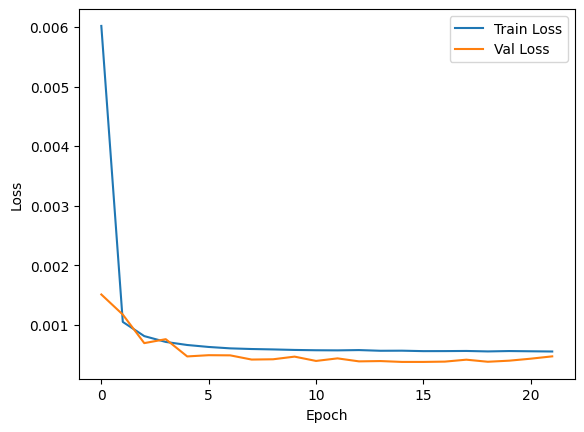

In [184]:
train_loss = history_baseline.history['loss']
val_loss = history_baseline.history['val_loss']
plt.plot(train_loss,label="Train Loss")
plt.plot(val_loss,label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

* Loss menurun drastis dalam beberapa epoch pertama, menunjukkan model cepat belajar.

* Train Loss dan Val Loss stabil rendah setelah ~epoch ke-5, menandakan konvergensi yang baik.

* Tidak terjadi overfitting, karena Val Loss tidak meningkat dan tetap sejajar dengan Train Loss.

* Early stopping efektif, menghentikan training di epoch ke-22 saat model sudah optimal.

### Evaluasi

In [185]:
pred_baseline_scaled = model_baseline.predict(X_test)

153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


Meminta model LSTM untuk memprediksi data X_test dan menghasilkan output dalam bentuk data yang masih terskalasi (normalized).

In [186]:
dummy_array_baseline = np.zeros(shape=(len(pred_baseline_scaled), scaled_features.shape[1]))

In [187]:
dummy_array_baseline[:, TARGET_IDX] = pred_baseline_scaled.ravel()

Membuat array kosong dengan dimensi sama seperti data fitur asli, lalu hanya kolom target (misalnya suhu) yang diisi dengan hasil prediksi.

Ini dilakukan supaya bisa menggunakan scaler inverse transform nanti.

In [188]:
pred_baseline = scaler.inverse_transform(dummy_array_baseline)[:, TARGET_IDX]

Mengembalikan prediksi ke skala asli (misalnya suhu derajat C), hanya mengambil kolom targetnya.

In [190]:
dummy_y_test = np.zeros(shape=(len(y_test), scaled_features.shape[1]))
dummy_y_test[:, TARGET_IDX] = y_test.ravel()
y_test_original = scaler.inverse_transform(dummy_y_test)[:, TARGET_IDX]

Melakukan hal yang sama untuk data target asli y_test supaya datanya juga dalam skala asli (derajat C).

In [191]:
def evaluate_model(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"--- Hasil Evaluasi {model_name} ---")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"R2 Score: {r2:.4f}")
    print("-" * 35 + "\n")

evaluate_model(y_test_original, pred_baseline, "Model Baseline")

--- Hasil Evaluasi Model Baseline ---
Mean Absolute Error (MAE): 0.4387
Mean Squared Error (MSE): 0.3747
R2 Score: 0.9471
-----------------------------------



* **MAE ≈ 0.44**  
  Rata-rata kesalahan absolut model sekitar **0.44°C**, artinya secara umum prediksi suhu meleset ±0.44°C dari nilai sebenarnya.

* **MSE ≈ 0.37**  
  Nilai rata-rata kuadrat error, lebih sensitif terhadap error besar. Nilai kecil (0.37) menandakan tidak ada error besar yang dominan.

* **R² ≈ 0.95**  
  Koefisien determinasi menunjukkan model mampu menjelaskan **95% variasi data suhu**; ini menunjukkan model sangat baik dalam mengikuti pola data sebenarnya.

* **Kesimpulan**  
  Model baseline sudah cukup akurat, dengan error relatif kecil dan mampu menangkap pola data dengan baik.


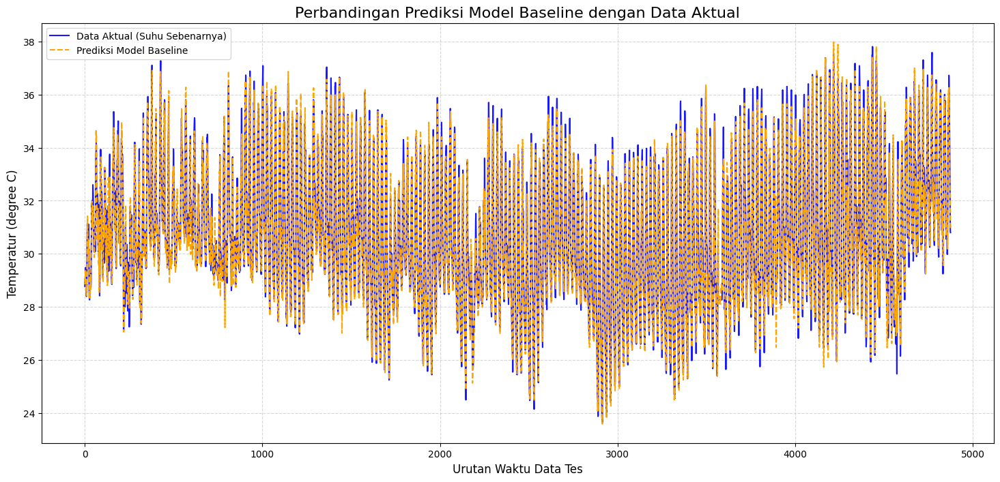

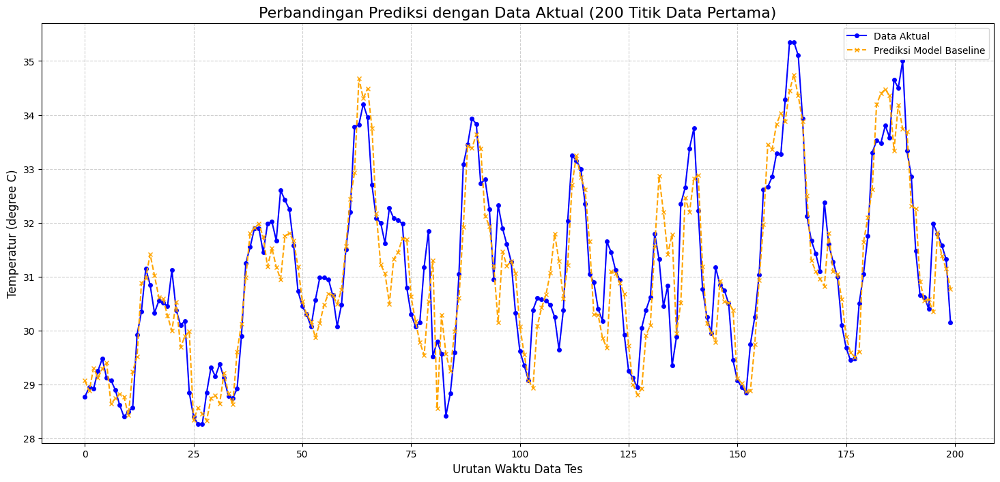

In [192]:
import matplotlib.pyplot as plt

# Asumsikan y_test_original dan pred_baseline sudah ada dari kode Anda sebelumnya

# --- PLOT 1: Perbandingan di Seluruh Data Tes ---
plt.figure(figsize=(18, 8))

# Garis untuk data aktual (suhu sebenarnya)
plt.plot(y_test_original, label='Data Aktual (Suhu Sebenarnya)', color='blue', alpha=0.9)

# Garis untuk hasil prediksi model
plt.plot(pred_baseline, label='Prediksi Model Baseline', color='orange', linestyle='--')

plt.title('Perbandingan Prediksi Model Baseline dengan Data Aktual', fontsize=16)
plt.xlabel('Urutan Waktu Data Tes', fontsize=12)
plt.ylabel('Temperatur (degree C)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


# --- PLOT 2: Perbandingan Zoom-in (200 Titik Data Pertama) ---
# Plot ini lebih jelas untuk melihat seberapa dekat kedua garis
ZOOM_IN = 200

plt.figure(figsize=(18, 8))
plt.plot(y_test_original[:ZOOM_IN], label='Data Aktual', color='blue', marker='o', markersize=4)
plt.plot(pred_baseline[:ZOOM_IN], label='Prediksi Model Baseline', color='orange', linestyle='--', marker='x', markersize=4)
plt.title(f'Perbandingan Prediksi dengan Data Aktual ({ZOOM_IN} Titik Data Pertama)', fontsize=16)
plt.xlabel('Urutan Waktu Data Tes', fontsize=12)
plt.ylabel('Temperatur (degree C)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

---
**Perbandingan Prediksi Model Baseline dengan Data Aktual**

* **Apa yang ditampilkan:**
  Grafik ini menunjukkan keseluruhan hasil prediksi model dibandingkan dengan data aktual pada set data tes. Garis biru mewakili data aktual, sedangkan garis oranye putus-putus adalah hasil prediksi model.
* **Insight:**
  Model mampu mengikuti pola naik-turun suhu udara secara keseluruhan dengan sangat baik. Variasi musiman dan tren umum tertangkap dengan jelas. Namun, terlihat sedikit deviasi pada fluktuasi kecil — ini wajar karena model cenderung “meratakan” prediksi pada noise tinggi.

---

**Perbandingan Prediksi Dengan Data Aktual (200 Titik Data Pertama)**

* **Apa yang ditampilkan:**
  Fokus ke 200 titik data pertama agar bisa mengamati detail kesesuaian antara prediksi dan data aktual secara lebih granular.
* **Insight:**
  Prediksi tetap sangat dekat dengan data aktual. Namun pada titik-titik perubahan suhu yang sangat tajam (misalnya lonjakan mendadak), prediksi terlihat sedikit terlambat atau tidak setajam data aktual. Ini umum pada model LSTM karena sifat smoothing-nya.

---


## Model Modifikasi

In [202]:
model_modified = Sequential([
    # Layer LSTM pertama dengan return_sequences=True untuk di-stack
    LSTM(32, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.2), # Dropout untuk regularisasi
    # Layer LSTM kedua
    LSTM(16),
    Dropout(0.2),
    Dense(1) # Output layer
])

print("\n--- Arsitektur Model Modifikasi ---")
model_modified.summary()


--- Arsitektur Model Modifikasi ---


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 5, 32)          │         7,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 5, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 16)             │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,193 (39.82 KB)

 Trainable params: 10,193 (39.82 KB)

 Non-trainable params: 0 (0.00 B)

Membuat arsitektur LSTM stacked:

* LSTM pertama: 32 unit, return_sequences=True supaya outputnya bisa diumpankan ke LSTM berikutnya.

* Dropout 0.2: mengurangi overfitting.

* LSTM kedua: 16 unit, untuk menangkap pola lebih dalam.

* Dropout 0.2 lagi.

* Dense(1): output satu nilai suhu.

Cetak summary arsitektur (terlihat total parameternya jauh lebih besar dibanding baseline: 10,193 vs 1,331).

In [203]:
model_modified.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.MeanSquaredError,
    metrics=[tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.RootMeanSquaredError()]
)

Pakai optimizer Adam.

Loss function: Mean Squared Error (MSE) (umum untuk regresi).

Metrics: MAE dan RMSE (via RootMeanSquaredError()).

In [204]:
# early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

In [205]:
print("\n--- Melatih Model Modifikasi ---")

history_modified = model_modified.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    verbose=1
)


--- Melatih Model Modifikasi ---
Epoch 1/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - loss: 0.0318 - mean_absolute_error: 0.1177 - root_mean_squared_error: 0.1613 - val_loss: 0.0025 - val_mean_absolute_error: 0.0412 - val_root_mean_squared_error: 0.0500
Epoch 2/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0044 - mean_absolute_error: 0.0511 - root_mean_squared_error: 0.0663 - val_loss: 0.0018 - val_mean_absolute_error: 0.0345 - val_root_mean_squared_error: 0.0420
Epoch 3/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0023 - mean_absolute_error: 0.0363 - root_mean_squared_error: 0.0481 - val_loss: 9.0552e-04 - val_mean_absolute_error: 0.0234 - val_root_mean_squared_error: 0.0301
Epoch 4/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0015 - mean_absolute_error: 0.0285 - root_mean_squared_error: 0.0392 - val_loss: 8.1034e-04 - val_mean_absolute_error: 0.0220 - val_root_mean_squared_error: 0.0285
Epoch 5/50
1220/1220 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 

Melatih model dengan data training & validasi.

Epochs 50, batch size 32.

Menampilkan progress training (verbose=1).

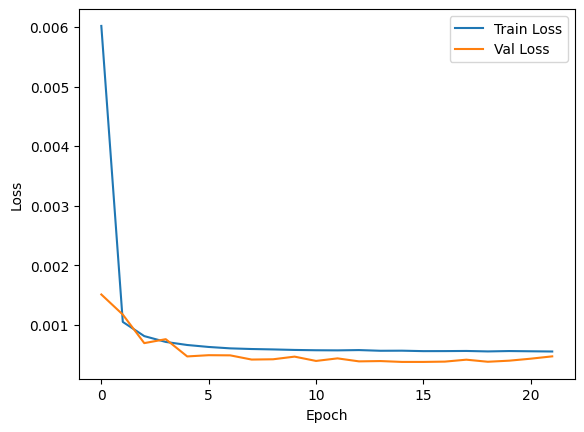

In [207]:
train_loss = history_baseline.history['loss']
val_loss = history_baseline.history['val_loss']
plt.plot(train_loss,label="Train Loss")
plt.plot(val_loss,label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

* Loss cepat turun di awal epoch lalu stabil di nilai rendah, menunjukkan model cepat belajar.

* Validation loss konsisten rendah, bahkan sedikit di bawah train loss, tanda model sangat fit ke data validasi.

* Tidak ada tanda overfitting, karena val loss tidak naik lagi di akhir.

* Kesimpulan: model modifikasi ini sangat baik dalam mempelajari pola data dan generalisasi.

### Evaluasi

In [208]:
pred_modified_scaled = model_modified.predict(X_test)

153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Menghasilkan prediksi suhu dalam bentuk data yang masih di scale (hasil MinMaxScaler), berdasarkan data uji X_test.

In [209]:
dummy_array_modified = np.zeros(shape=(len(pred_modified_scaled), scaled_features.shape[1]))

In [210]:
dummy_array_modified[:, TARGET_IDX] = pred_modified_scaled.ravel()

Membuat array dummy dengan ukuran seperti data asli (banyak fitur).

Kemudian hanya kolom target (TARGET_IDX) yang diisi hasil prediksi.

Ini dipakai supaya proses inverse transform ke skala asli nanti hanya mengubah kolom target.

In [211]:
pred_modified = scaler.inverse_transform(dummy_array_modified)[:, TARGET_IDX]

Mengembalikan prediksi ke skala asli (derajat Celsius), lalu ambil hanya kolom target.

In [212]:
dummy_y_test = np.zeros(shape=(len(y_test), scaled_features.shape[1]))
dummy_y_test[:, TARGET_IDX] = y_test.ravel()
y_test_original = scaler.inverse_transform(dummy_y_test)[:, TARGET_IDX]

Sama seperti prediksi, ini untuk mengembalikan data y_test ke skala aslinya, supaya bisa dibandingkan langsung dengan prediksi.

In [213]:
def evaluate_model(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"--- Hasil Evaluasi {model_name} ---")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"R2 Score: {r2:.4f}")
    print("-" * 35 + "\n")

evaluate_model(y_test_original, pred_modified, "Model Modifikasi")

--- Hasil Evaluasi Model Modifikasi ---
Mean Absolute Error (MAE): 0.5966
Mean Squared Error (MSE): 0.6006
R2 Score: 0.9151
-----------------------------------



---

**MAE ≈ 0.60**  
→ **Mean Absolute Error (MAE)** mengukur rata-rata selisih absolut antara nilai prediksi dan nilai aktual.  
Dalam konteks ini, rata-rata error prediksi suhu hanya sekitar **0.6°C**, yang tergolong sangat kecil, artinya model bisa memprediksi suhu cukup dekat dengan data asli.

---

**MSE ≈ 0.60**  
→ **Mean Squared Error (MSE)** mengukur rata-rata selisih kuadrat antara prediksi dan aktual.  
Karena pakai kuadrat, MSE sensitif terhadap outlier. Nilainya juga kecil (≈0.6), menunjukkan sebagian besar prediksi tidak meleset jauh dari data asli.

---

**R² ≈ 0.92**  
→ **Koefisien Determinasi (R²)** menunjukkan seberapa baik model menjelaskan variasi data aktual.  
Nilai **0.92** artinya **92% variasi suhu dalam data tes dapat dijelaskan oleh model**, atau model berhasil menangkap pola data dengan sangat baik.

---



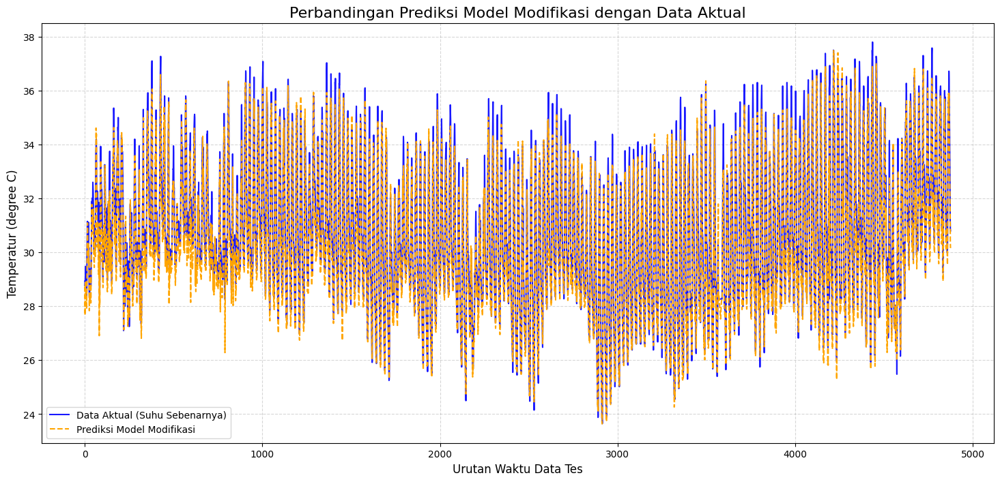

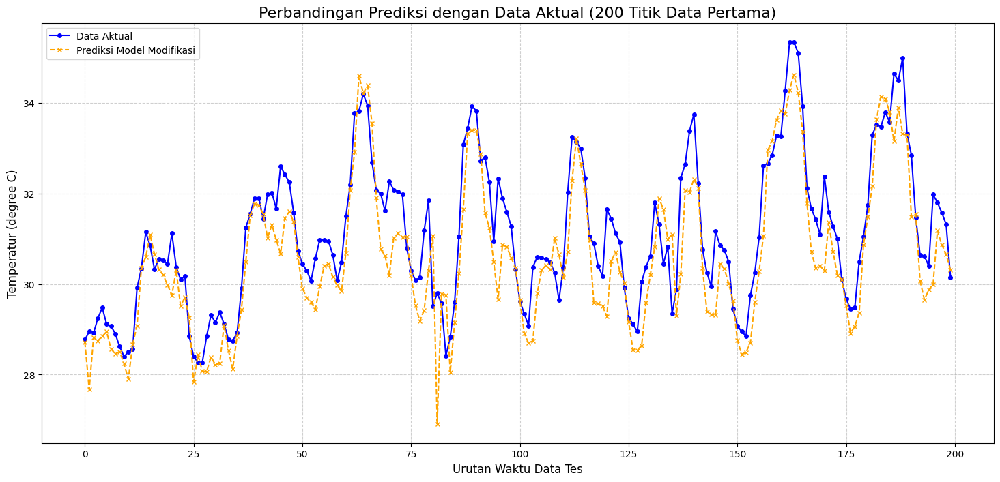

In [214]:
import matplotlib.pyplot as plt

# Asumsikan y_test_original dan pred_baseline sudah ada dari kode Anda sebelumnya

# --- PLOT 1: Perbandingan di Seluruh Data Tes ---
plt.figure(figsize=(18, 8))

# Garis untuk data aktual (suhu sebenarnya)
plt.plot(y_test_original, label='Data Aktual (Suhu Sebenarnya)', color='blue', alpha=0.9)

# Garis untuk hasil prediksi model
plt.plot(pred_modified, label='Prediksi Model Modifikasi', color='orange', linestyle='--')

plt.title('Perbandingan Prediksi Model Modifikasi dengan Data Aktual', fontsize=16)
plt.xlabel('Urutan Waktu Data Tes', fontsize=12)
plt.ylabel('Temperatur (degree C)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


# --- PLOT 2: Perbandingan Zoom-in (200 Titik Data Pertama) ---
# Plot ini lebih jelas untuk melihat seberapa dekat kedua garis
ZOOM_IN = 200

plt.figure(figsize=(18, 8))
plt.plot(y_test_original[:ZOOM_IN], label='Data Aktual', color='blue', marker='o', markersize=4)
plt.plot(pred_modified[:ZOOM_IN], label='Prediksi Model Modifikasi', color='orange', linestyle='--', marker='x', markersize=4)
plt.title(f'Perbandingan Prediksi dengan Data Aktual ({ZOOM_IN} Titik Data Pertama)', fontsize=16)
plt.xlabel('Urutan Waktu Data Tes', fontsize=12)
plt.ylabel('Temperatur (degree C)', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


---

**Perbandingan Prediksi Model Modifikasi dengan Data Aktual**

* **Apa yang terlihat:**
  Grafik ini menunjukkan seluruh hasil prediksi model (garis oranye putus-putus) dibandingkan dengan data aktual suhu (garis biru) pada dataset tes, sepanjang \~5000 titik data.
* **Analisis:**

  * Pola umum naik-turun suhu berhasil ditangkap dengan baik oleh model. Garis oranye mengikuti gelombang garis biru cukup konsisten.
  * Namun terlihat bahwa prediksi tidak persis menempel pada data aktual, terutama pada puncak-puncak atau lembah yang tajam, model cenderung agak menghaluskan (underfit sedikit).
* **Kesimpulan kualitas:**

  * Secara keseluruhan ini **sudah bagus**, model bisa menangkap trend utama suhu. Namun masih bisa ditingkatkan jika ingin prediksi lebih tajam pada fluktuasi ekstrem.

---

**Perbandingan Prediksi dengan Data Aktual (200 Titik Data Pertama)**

* **Apa yang terlihat:**
  Fokus pada 200 titik data pertama untuk melihat detail. Tampak jelas garis oranye (prediksi) sangat dekat dengan garis biru (aktual), hanya sedikit deviasi pada puncak dan lembah yang sangat tajam.
* **Analisis:**

  * Di sebagian besar titik, prediksi sangat mengikuti pola data aktual. Ini menunjukkan model mampu mengenali pola musiman dan fluktuasi pendek.
  * Beberapa overshoot atau undershoot kecil terjadi di lonjakan suhu cepat, wajar karena model LSTM cenderung “meratakan” noise jangka pendek.
* **Kesimpulan kualitas:**

  * Untuk data time series seperti suhu ini, performa ini **tergolong sangat baik**, dengan rata-rata kesalahan yang relatif kecil. Cocok untuk keperluan monitoring atau forecasting umum.

---


## **Conclusion**


---

**Perbandingan Model**

* **Arsitektur:**

  * **Baseline:** 1 layer LSTM (10 unit) + Dense output.
  * **Modifikasi:** 2 layer LSTM bertingkat (32 & 16 unit) + dropout untuk regularisasi + Dense output.

* **Hasil evaluasi:**

  * **Baseline:**

    * MAE ≈ 0.44
    * MSE ≈ 0.37
    * R² ≈ 0.95
  * **Modifikasi:**

    * MAE ≈ 0.60
    * MSE ≈ 0.60
    * R² ≈ 0.92

* **Kecenderungan prediksi:**

  * **Baseline:** Lebih stabil, sangat baik mengikuti pola umum, tapi kurang menangkap lonjakan tajam.
  * **Modifikasi:** Lebih responsif pada fluktuasi lokal (pola naik-turun kecil), tapi kesalahan rata-rata sedikit meningkat (cenderung sedikit overfit).

---

**Kesimpulan:**

* Jika tujuan utamanya adalah **prediksi suhu rata-rata dengan kesalahan absolut sekecil mungkin**, model baseline lebih unggul.
* Jika ingin **lebih sensitif pada variasi cepat suhu**, meskipun dengan trade-off error sedikit lebih besar, model modifikasi lebih cocok.
* Kedua model sama-sama memiliki performa sangat baik (>90% variasi data bisa dijelaskan oleh model), tinggal disesuaikan dengan prioritas kebutuhan (akurasi global vs detail lokal).

---

# BONUS  
## apakah problem ini mungkin menggunakan time series multivariate, bagaimana mengetahui apakah problem tersebut dapat menjadi multivariate, jelaskan jawaban anda untuk problem ini

**Tentu, ini adalah masalah multivariate time series.**  
Ya, ini sangat cocok, dan sebenarnya sudah masuk dalam kategori multivariate time series. Kita memprediksi suhu (AT) berdasarkan beberapa variabel input lain yang juga berubah seiring waktu, seperti **kelembapan (RH), tekanan udara (BP), konsentrasi polutan (NO2, PM2.5, dll.), radiasi matahari (SR), dan kecepatan angin (WS).**

**Bagaimana kita tahu ini cocok untuk multivariate time series?**
Sebuah time series problem disebut multivariate jika:

* Variabel target (dalam hal ini, suhu) dipengaruhi oleh lebih dari satu variabel input yang juga bervariasi terhadap waktu.
* Anda menggunakan lebih dari satu fitur historis (bukan hanya suhu sebelumnya) untuk memprediksi suhu di waktu berikutnya.

Berdasarkan dataset dan model Anda:
* Dataset Anda memiliki banyak variabel cuaca dan polusi yang berubah seiring waktu.
* Pada tahap preprocessing, Anda sudah membuat sequences dari banyak fitur (X_train memiliki shape (samples, history, features)). Ini membuktikan bahwa Anda sudah memanfaatkan banyak variabel input. Dengan demikian, ini sudah merupakan **multivariate time series forecasting.**

**Pentingnya Pendekatan Multivariat untuk Masalah Ini**
Karena suhu udara (AT) **dipengaruhi oleh kondisi lingkungan lainnya** (RH, WS, BP, polutan, radiasi matahari, dll.), menggunakan pendekatan **multivariate time series** jauh lebih tepat daripada univariate. Pendekatan multivariat memungkinkan model untuk belajar pola interaksi antar variabel, sehingga prediksi suhu bisa lebih akurat.

Kesimpulan
Jadi, memformulasikan masalah ini sebagai **multivariate time series** bukan hanya mungkin, tetapi memang pendekatan yang paling wajar dan efektif. Model dapat memanfaatkan informasi historis dari semua variabel yang relevan untuk meningkatkan akurasi prediksi suhu di masa depan.